<div class="alert alert-block alert-info">
<center> <h1> BUSINESS CASE 3: SIEMENS ADVANTA CONSULTING </h1> </center> <br>
<center> <h2> Group G </h2> </center> <br>
<center> <h3> 2022/2023 </h3> </center> <br>

**Table of Contents** <br>
* [1. Initial Setup](#setup)
    * [Import Libraries](#importlibraries)
    * [Import Data](#importdata)
        * [Import Sales Data](#importsales)
        * [Import Market Data](#importmarket)
        * [Import GDP and Consumer Price Index Information](#importinfo)
* [2. Data Understanding](#dataunderstanding)
    * [General](#ugeneral)
    * [Product Group 1](#ugck1)
    * [Product Group 3](#ugck3)
    * [Product Group 4](#ugck4)
    * [Product Group 5](#ugck5)
    * [Product Group 6](#ugck6)
    * [Product Group 8](#ugck8)
    * [Product Group 9](#ugck9)
    * [Product Group 11](#ugck11)
    * [Product Group 12](#ugck12)
    * [Product Group 13](#ugck13)
    * [Product Group 14](#ugck14)
    * [Product Group 16](#ugck16)
    * [Product Group 20](#ugck20)
    * [Product Group 36](#ugck36)
* [3. Data Preparation](#datapreparation)
    * [Missing Values](#missingvalues)
    * [Feature Creation](#featurecreation)
    * [Feature Selection and Outlier Detection](#selection&outlier)
        * [Product Group 1](#sgck1)
        * [Product Group 3](#sgck3)
        * [Product Group 4](#sgck4)
        * [Product Group 5](#sgck5)
        * [Product Group 6](#sgck6)
        * [Product Group 8](#sgck8)
        * [Product Group 9](#sgck9)
        * [Product Group 11](#sgck11)
        * [Product Group 12](#sgck12)
        * [Product Group 13](#sgck13)
        * [Product Group 14](#sgck14)
        * [Product Group 16](#sgck16)
        * [Product Group 20](#sgck20)
        * [Product Group 36](#sgck36)
* [4. Export](#export)

<hr>
<a class="anchor" id="setup">
    
# 1. Initial Setup
    
</a>

<a class="anchor" id="importlibraries">

## Import Libraries

</a>

In [1]:
# !pip install Prophet

#!pip install pmdarima

#!pip install xgboost

#!pip install ydata_profiling

#!pip install plotly

In [474]:
import pandas as pd  # version 1.5.0
import numpy as np  # version 1.23.3
import seaborn as sns  # version 0.12.0
import re  # version 2.2.1
import calendar

from ydata_profiling import ProfileReport  # version v4.0.0
import datetime

import matplotlib.pyplot as plt  # version 3.5.3
import matplotlib.dates as mdates # version 3.5.3

import statsmodels.api as sm  # version 3.5.3
from statsmodels.tsa.stattools import adfuller  # version 0.13.2
from statsmodels.tsa.arima.model import ARIMA   # version 0.13.2

from scipy.stats import pearsonr, chi2, norm, kstest # version 1.9.1

from prophet import Prophet  # version 1.1.2

from xgboost import XGBRegressor  # version 1.7.5

from pmdarima import auto_arima    # version 2.0.3

from statsmodels.tsa.seasonal import seasonal_decompose   # version 0.13.2

from sklearn.linear_model import LinearRegression  # version 1.1.2
from sklearn.metrics import mean_squared_error  # version 1.0.2
from sklearn.ensemble import IsolationForest  # version 1.0.2

import scipy.stats as stats    # version 1.7.3
import plotly.graph_objects as go   # version 5.9.0

In [483]:
#print(.__version__)

<a class="anchor" id="importdata">

## Import Data

</a>

<a class="anchor" id="importsales">

### Import Sales Data

</a>

In [4]:
# Import Sales data
sales_data=pd.read_csv("Case3_Sales data.csv",sep=';')
sales_data.head()

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,#1,0
1,02.10.2018,#1,0
2,03.10.2018,#1,0
3,04.10.2018,#1,0
4,05.10.2018,#1,0


In [5]:
# Removing the # from the 'Mapped_GCK' column to make it easier to use
sales_data['Mapped_GCK']=sales_data['Mapped_GCK'].apply(lambda x: x[1:3])

In [6]:
# Replacing , with . in the column 'Sales_EUR' so we can transform the datatype to float 
sales_data['Sales_EUR'] = sales_data['Sales_EUR'].str.replace(',', '.')

# Transforming the datatype of the column 'Sales_EUR' to float
sales_data['Sales_EUR']=sales_data['Sales_EUR'].astype('float')

In [7]:
# Transforming the data type of the column 'Mapped_GCK' to int
sales_data['Mapped_GCK']=sales_data['Mapped_GCK'].astype('int')

In [8]:
# Converting the 'DATE' column to datetime format ('DD/MM/YYYY' format)
sales_data['DATE'] = pd.to_datetime(sales_data['DATE'], format='%d.%m.%Y')

# Transforming the 'DATE' column to 'YYYY-MM-DD' format
sales_data['DATE'] = pd.to_datetime(sales_data['DATE'].dt.strftime('%Y-%m-%d'))

In [9]:
# Renaming the columns so the titles are easier to understand
sales_data.rename(columns={'DATE':'Date','Mapped_GCK':'GCK','Sales_EUR':'Sales (€)'},inplace=True)
sales_data.head()

,Date,GCK,Sales (€)
0,2018-10-01,1,0.0
1,2018-10-02,1,0.0
2,2018-10-03,1,0.0
3,2018-10-04,1,0.0
4,2018-10-05,1,0.0


<a class="anchor" id="importmarket">

### Import Market Data

</a>

In [10]:
# Import Market data
# We altered the dataset in excel so that it had one row with the countries and another row below with the names of the
#macro-economic indices
market_data=pd.read_excel("Case3_Market data.xlsx",header=None)
market_data.head()

,0,1,2,3,4,5,6,7,8,9,...,38,39,40,41,42,43,44,45,46,47
0,NaN,China,China,France,France,Germany,Germany,Italy,Italy,Japan,...,France,Germany,United States,World,Switzerland,United Kingdom,Italy,Japan,France,Germany
1,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,...,Production Index Machinery and equipment n.e.c.,Production Index Machinery and equipment n.e.c.,Production Index Electrical equipment,Production Index Electrical equipment,Production Index Electrical equipment,Production Index Electrical equipment,Production Index Electrical equipment,Production Index Electrical equipment,Production Index Electrical equipment,Production Index Electrical equipment
2,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,...,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
3,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,...,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
4,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,...,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815


In [11]:
# Reorganizing the 'market_data' dataset to make it more usable

# Replace 'm' with '-' starting from row 3 and column 0
market_data.loc[3:,0]=market_data.loc[3:,0].str.replace('m','-')
# Drop row 2 since it's not useful for the analysis
market_data.drop(index=2,inplace=True)
# Transpose the dataframe, set the first row as the column headers, and drop the first row
market_data=market_data.T.set_axis(market_data.iloc[:,0],axis=1)
market_data.drop(index=0,inplace=True)
# Rename the column with NaN to 'Country'
market_data.rename(columns={np.NaN:'Country'},inplace=True)
market_data.head()

,Country,Index 2010=100 (if not otherwise noted),2004-2,2004-3,2004-4,2004-5,2004-6,2004-7,2004-8,2004-9,...,2021-7,2021-8,2021-9,2021-10,2021-11,2021-12,2022-1,2022-2,2022-3,2022-4
1,China,Production Index Machinery & Electricals,16.940704,23.711852,24.435235,23.708115,27.009138,23.590959,24.280597,25.989192,...,264.032744,253.723069,259.000496,269.794432,291.52003,310.763183,235.956129,235.956129,329.413367,267.373145
2,China,Shipments Index Machinery & Electricals,16.940704,23.711852,24.435235,23.708115,27.009138,23.590959,24.280597,25.989192,...,264.032744,253.723069,259.000496,269.794432,291.52003,310.763183,235.956129,235.956129,329.413367,267.373145
3,France,Production Index Machinery & Electricals,112.091273,136.327976,117.791806,109.002541,133.785737,117.405904,79.137033,130.487955,...,95.324444,63.856268,101.856355,97.348255,94.292783,100.565744,85.743503,90.60354,107.843548,87.69811
4,France,Shipments Index Machinery & Electricals,83.458866,106.168192,92.007646,85.696486,106.641482,89.302781,71.798962,98.896817,...,101.023707,90.607333,118.187535,116.870124,116.357666,134.589504,108.15632,117.71577,136.85872,116.528738
5,Germany,Production Index Machinery & Electricals,82.623037,100.556582,89.653203,86.880571,99.010814,94.200318,82.804844,102.039931,...,110.680184,100.880844,115.043611,108.420507,115.95156,118.103281,94.55061,103.987916,121.308119,99.522205


<a class="anchor" id="importinfo">

### Import GDP and Consumer Price Index Information

</a>

In [12]:
# https://fred.stlouisfed.org/series/CPMNACNSAB1GQDE
# Import gdp data
gdp = pd.read_csv("GDP.csv")
gdp.head()

,DATE,CPMNACNSAB1GQDE
0,2004-01-01,550180.0
1,2004-04-01,560160.0
2,2004-07-01,570660.0
3,2004-10-01,581520.0
4,2005-01-01,550540.0


In [13]:
# Rename the 'CPMNACNSAB1GQDE' column to 'GDP'
gdp.rename(columns={'CPMNACNSAB1GQDE': 'GDP'}, inplace = True)
# Convert the 'DATE' column to a datetime format
gdp['DATE'] = pd.to_datetime(gdp['DATE'])
gdp.head()

,DATE,GDP
0,2004-01-01,550180.0
1,2004-04-01,560160.0
2,2004-07-01,570660.0
3,2004-10-01,581520.0
4,2005-01-01,550540.0


In [14]:
gdp = gdp.set_index('DATE')

# Resample the data to monthly frequency and forward fill missing values
# We assume that the quarterly GDP value corresponds to the sum of the GDP values of the following 3 months
gdp_monthly = gdp.resample('MS').ffill()

# We also assume that the monthly gdp value is 1/3 of the quarterly gdp
gdp_monthly['GDP'] = gdp_monthly['GDP'] / 3

gdp_monthly

,GDP
DATE,
2004-01-01,183393.333333
2004-02-01,183393.333333
2004-03-01,183393.333333
2004-04-01,186720.000000
2004-05-01,186720.000000
...,...
2022-06-01,316193.333333
2022-07-01,324056.666667
2022-08-01,324056.666667


In [15]:
# https://www.destatis.de/EN/Themes/Economy/Prices/Consumer-Price-Index/_node.html#sprg481842
# Import consumer price index data
price_index = pd.read_csv("Cons_price_index.csv")
price_index.head()

,;;Consumer price index;;
0,;;2020=100;;
1,2004;January;79.4;;
2,2004;February;79.6;;
3,2004;March;79.9;;
4,2004;April;80.1;;


In [16]:
# Remove the first row of the DataFrame
price_index = price_index[1:]

# Split the ';;Consumer price index;;' column into separate columns
new_cols = price_index[';;Consumer price index;;'].str.split(";", n=3, expand=True)
new_cols.columns = ['Year', 'Month', 'Consumer Price Index (2020=100)', 'Column']

# Concatenate the new columns to the original DataFrame and drop unnecessary columns
price_index = pd.concat([price_index, new_cols], axis=1)
price_index.drop(columns = [';;Consumer price index;;', 'Column'], axis=1, inplace=True)
price_index.head()

,Year,Month,Consumer Price Index (2020=100)
1,2004,January,79.4
2,2004,February,79.6
3,2004,March,79.9
4,2004,April,80.1
5,2004,May,80.3


In [17]:
# Create a'Date' column using the 'Year' and 'Month' columns
price_index['Date'] = pd.to_datetime(price_index['Year'].astype(str) + '-' + price_index['Month'] + '-01')

# drop the 'Year' and 'Month' columns
price_index = price_index.drop(columns=['Year', 'Month'])
# Reorder columns
price_index = price_index.reindex(columns=['Date', 'Consumer Price Index (2020=100)'])

price_index.tail()

,Date,Consumer Price Index (2020=100)
227,2022-11-01,113.7
228,2022-12-01,113.2
229,2023-01-01,114.3
230,2023-02-01,115.2
231,2023-03-01,116.1


<hr>
<a class="anchor" id="dataunderstanding">
    
# 2. Data Understanding
    
    
</a>

<a class="anchor" id="ugeneral">

## General

</a>

In [18]:
# Generating a profile report to better explore the data
#ProfileReport(  
 #   sales_data,    
  #  title='Sales Data',
   # correlations={
    #    "pearson": {"calculate": True},
#        "spearman": {"calculate": True},
#       "kendall": {"calculate": True},
#        "phi_k": {"calculate": True},
#        "cramers": {"calculate": True},
#    },                 
#)

In [19]:
# Checking the unique values for the product groups (column 'GCK')
sales_data['GCK'].unique()

array([ 1, 11,  6,  8, 12, 16,  4,  5,  3,  9, 14, 13, 20, 36])

In [20]:
# There are negative values in Sales
# From the pandas profile, we can also see that we have 72.8% of the data in the column 'Sales (€)' being 0
np.unique(sales_data['Sales (€)'])

array([ -506381.17,  -463023.3 ,  -341515.12, ..., 37519861.51,
       38363810.51, 41127988.02])

In [21]:
# The Sales data is from October 2018 to April 2022 as presented
print(sales_data['Date'].min())  # minimum date
print(sales_data['Date'].max())  # maximum date

2018-10-01 00:00:00
2022-04-30 00:00:00


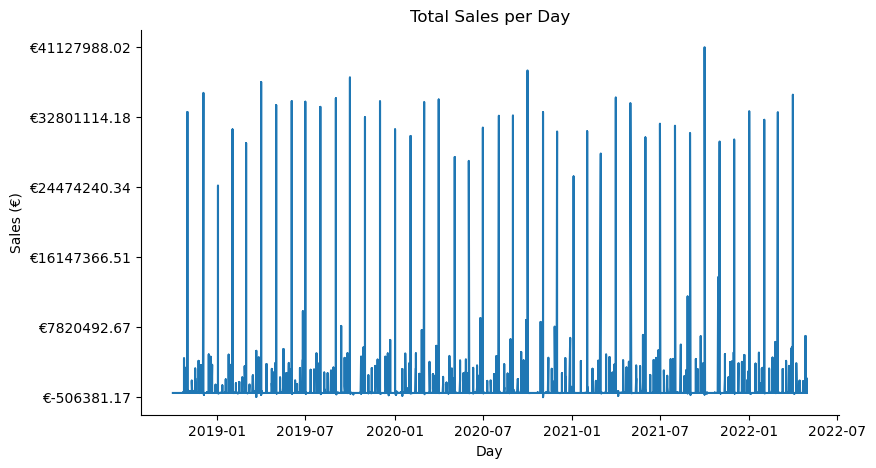

In [22]:
%matplotlib inline
# Compute the minimum and maximum values of the 'Sales (€)' column
sales_min = sales_data['Sales (€)'].min()
sales_max = sales_data['Sales (€)'].max()

# Generate 5 equally spaced levels between the minimum and maximum values
y_ticks = np.linspace(sales_min, sales_max, num=6)
# Format the tick labels as desired
y_tick_labels = ['€{:.2f}'.format(val) for val in y_ticks]

# You can convert it using the pd.to_datetime() method if it's not
sales_data = sales_data.sort_values(by='Date')
years_fmt = mdates.DateFormatter('%Y-%m')

fig, ax = plt.subplots(figsize=(9,5))
ax.plot(sales_data['Date'], sales_data['Sales (€)'])
ax.grid(False)

# Set the x-axis tick formatter to show only years
ax.xaxis.set_major_formatter(years_fmt)
ax.set_xlabel('Day')
ax.set_ylabel('Sales (€)')
ax.set_yticks(y_ticks)
ax.set_yticklabels(y_tick_labels)
ax.set_title('Total Sales per Day')

sns.despine()
plt.show()
#fig.savefig('Total Sales per Day.svg', format="svg", facecolor=fig.get_facecolor())

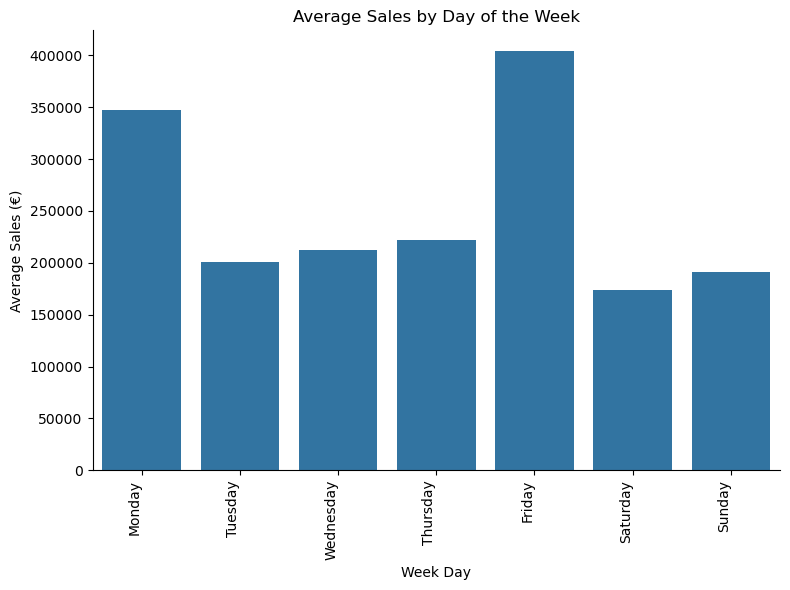

<Figure size 640x480 with 0 Axes>

In [23]:
# Creating a feature corresponding only to the month of each date
sales_dayweek=sales_data.drop('GCK',axis=1)
sales_dayweek['DayWeek']=sales_dayweek['Date'].dt.day_name()

# Aggregating the sales by day of the week
sales_dayweek_agg=sales_dayweek.groupby(('DayWeek'))['Sales (€)'].mean(numeric_only=True)

# Define the desired order of the days of the week
desired_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Reindex the DayWeek variable with the desired order of the days of the week
sales_dayweek_agg = sales_dayweek_agg.reindex(desired_order)

# Create bar chart
plt.figure(figsize=(8,6))
sns.barplot(x=sales_dayweek_agg.index, y=sales_dayweek_agg.values, palette=sns.color_palette(n_colors=1))
plt.xlabel('Week Day')
plt.ylabel('Average Sales (€)')
plt.title('Average Sales by Day of the Week')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()
#plt.savefig('Average Sales by Day of the Week.svg', format="svg", facecolor=fig.get_facecolor())

In [24]:
# Creating a feature corresponding only to the month and year of each date
sales_data['DateMY']=pd.to_datetime(sales_data['Date']).apply(lambda x: x.strftime('%Y-%m'))

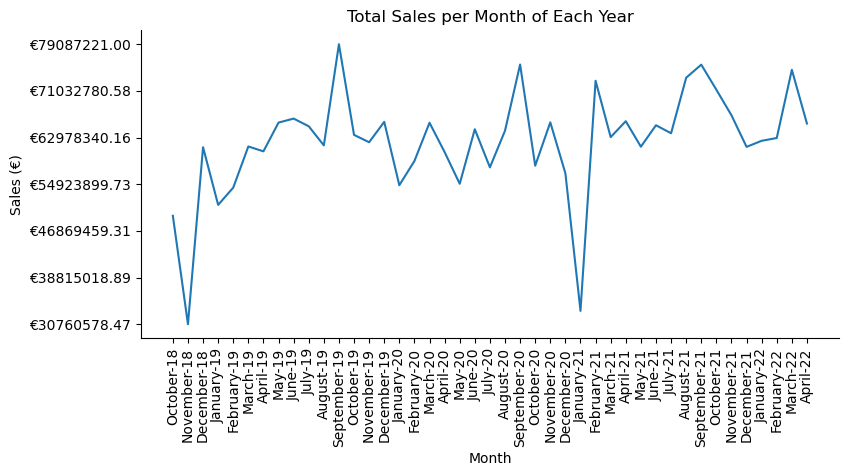

In [25]:
# Aggregating the sales by month
sales_month=sales_data.drop('GCK',axis=1).groupby(sales_data['DateMY']).sum(numeric_only=True)

%matplotlib inline
# Compute the minimum and maximum values of the 'Sales (€)' column
sales_min = sales_month['Sales (€)'].min()
sales_max = sales_month['Sales (€)'].max()

# Generate 6 equally spaced levels between the minimum and maximum values
y_ticks = np.linspace(sales_min, sales_max, num=7)

# Format the tick labels as desired
y_tick_labels = ['€{:.2f}'.format(val) for val in y_ticks]

# Generate the month name and year based on the index
month_names = [calendar.month_name[int(m.split('-')[1])] + '-' + m.split('-')[0][-2:] for m in sales_month.index]
#[calendar.month_name[int(m.split('-')[1])] for m in sales_month.index]

fig, ax = plt.subplots(figsize=(9,4))
ax.plot(sales_month.index, sales_month['Sales (€)'])
ax.grid(False)

ax.set_xlabel('Month')
ax.set_xticks(range(len(sales_month.index)))
ax.set_xticklabels(month_names, rotation=90)
ax.set_ylabel('Sales (€)')
ax.set_yticks(y_ticks)
ax.set_yticklabels(y_tick_labels)
ax.set_title('Total Sales per Month of Each Year')

sns.despine()
plt.show()
#fig.savefig('Total Sales per Month of Each Year.svg', format="svg", facecolor=fig.get_facecolor())

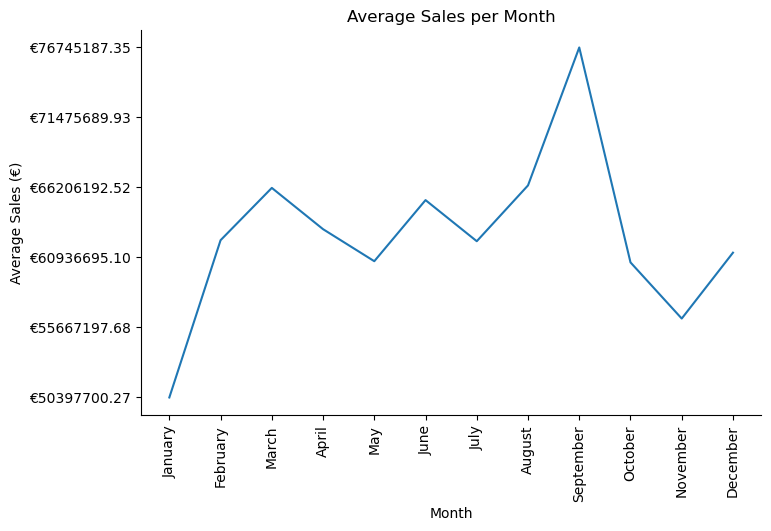

In [26]:
# Creating a feature corresponding only to the month of each date
sales_month['DateM']= [calendar.month_name[int(m.split('-')[1])] for m in sales_month.index]

# Aggregating the sales by month
sales_month_agg=sales_month.groupby(sales_month['DateM']).mean()

# Ordering 'sales_month_agg' by month
month_name_to_num = {name: num for num, name in enumerate(calendar.month_name) if num != 0}
month_nums = [month_name_to_num[name] for name in sales_month_agg.index]
sales_month_agg = sales_month_agg.iloc[np.argsort(month_nums)]

%matplotlib inline
# Compute the minimum and maximum values of the 'Sales (€)' column
sales_min = sales_month_agg['Sales (€)'].min()
sales_max = sales_month_agg['Sales (€)'].max()

# Generate 5 equally spaced levels between the minimum and maximum values
y_ticks = np.linspace(sales_min, sales_max, num=6)

# Format the tick labels as desired
y_tick_labels = ['€{:.2f}'.format(val) for val in y_ticks]
#x_tick_labels = [label.split('-')[1] if i % int(len(sales_month)/12) == 0 else '' for i, label in enumerate(sales_month.index)]

fig, ax = plt.subplots(figsize=(8,5))
ax.plot(sales_month_agg.index, sales_month_agg['Sales (€)'])
ax.grid(False)

ax.set_xlabel('Month')
ax.set_xticks(range(len(sales_month_agg.index)))
ax.set_xticklabels(sales_month_agg.index,rotation=90)
ax.set_ylabel('Average Sales (€)')
ax.set_yticks(y_ticks)
ax.set_yticklabels(y_tick_labels)
ax.set_title('Average Sales per Month')

sns.despine()
plt.show()
#fig.savefig('Average Sales per Month.svg', format="svg", facecolor=fig.get_facecolor())

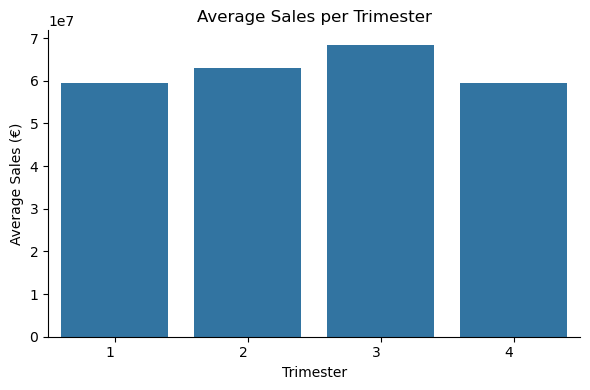

In [27]:
def get_trimester(month):
    if month in ['January','February','March']:
        return 1
    elif month in ['April','May','June']:
        return 2
    elif month in ['July','August','September']:
        return 3
    elif month in ['October','November','December']:
        return 4

# Creating a feature corresponding only to the month of each date
sales_month['Trimester']= sales_month['DateM'].apply(get_trimester)

# Aggregating the sales by trimester
sales_trimester=sales_month.groupby(('Trimester'))['Sales (€)'].mean(numeric_only=True)
#sales_trimester=sales_trimester.apply(lambda x: int(x))

# Ordering 'sales_trimester' by trimester
desired_order = [1, 2, 3, 4]
sales_trimester = sales_trimester.reindex(desired_order)

# Create bar chart
plt.figure(figsize=(6,4))
sns.barplot(x=sales_trimester.index, y=sales_trimester.values, palette=sns.color_palette(n_colors=1))
plt.xlabel('Trimester')
plt.ylabel('Average Sales (€)')
plt.title('Average Sales per Trimester')
plt.xticks(ha='right')
plt.tight_layout()

sns.despine()
plt.show()
#fig.savefig('Average Sales per Trimester.svg', format="svg", facecolor=fig.get_facecolor())

In [28]:
# Aggregating the sales by month per product group
sales_agg=sales_data.groupby([sales_data['DateMY'],sales_data['GCK']]).sum(numeric_only=True)

# Reset the index to move the index levels to columns
sales_agg = sales_agg.reset_index()

# Use the pivot method to reshape the DataFrame
sales_agg = sales_agg.pivot(index='DateMY',columns='GCK', values='Sales (€)')
sales_agg.reset_index(inplace=True)

# Reshape the data into a long format using the melt function
sales_agg = pd.melt(sales_agg, id_vars=['DateMY'], 
                 var_name='GCK', value_name='Sales (€)')

sales_agg=sales_agg.sort_values('GCK', ascending=True)
sales_agg.reset_index(inplace=True,drop=True)
sales_agg

,DateMY,GCK,Sales (€)
0,2018-10,1,36098918.79
1,2020-10,1,41453854.50
2,2020-11,1,37643611.57
3,2020-12,1,34816959.18
4,2021-01,1,27180432.94
...,...,...,...
597,2020-02,36,11813.40
598,2020-03,36,28300.82
599,2020-04,36,27121.60
600,2020-06,36,146778.15


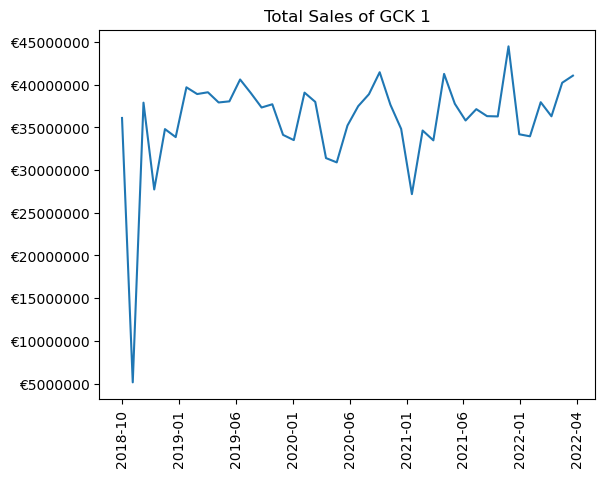

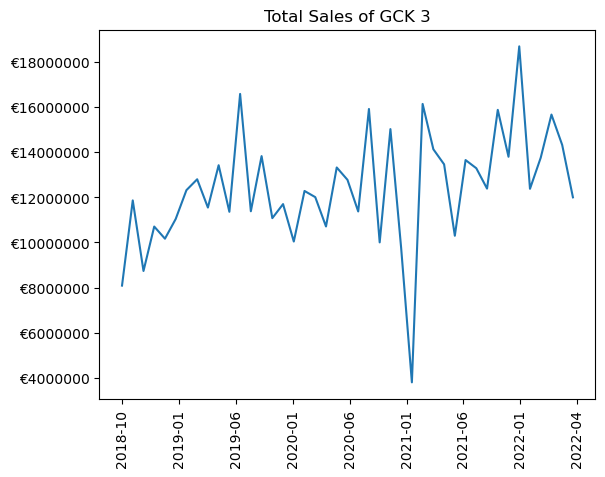

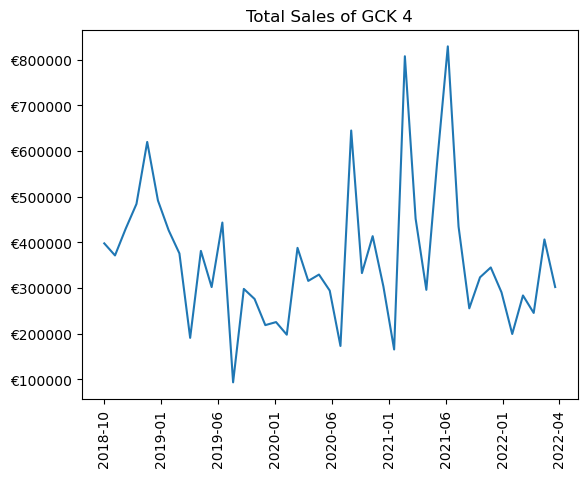

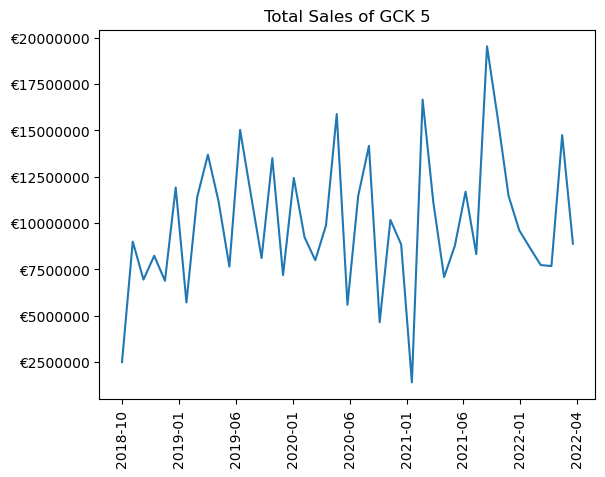

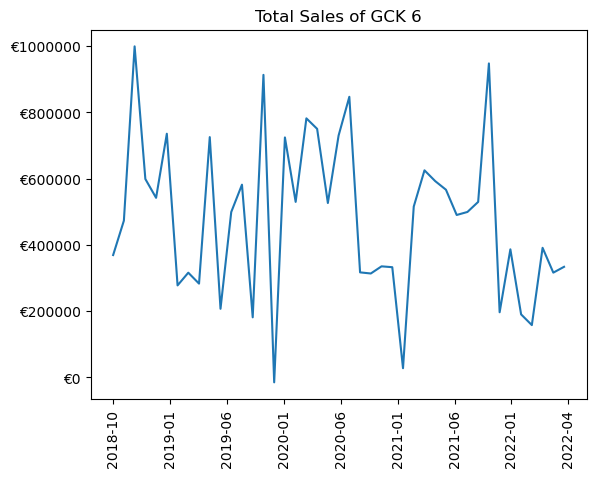

...

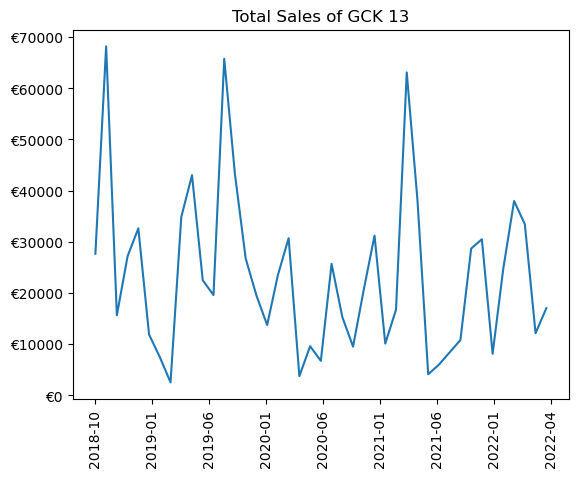

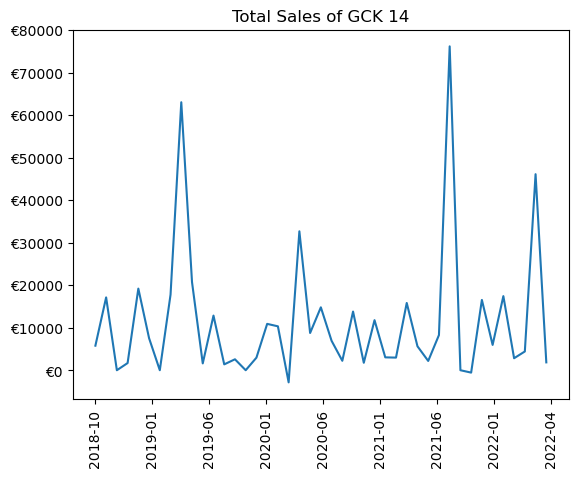

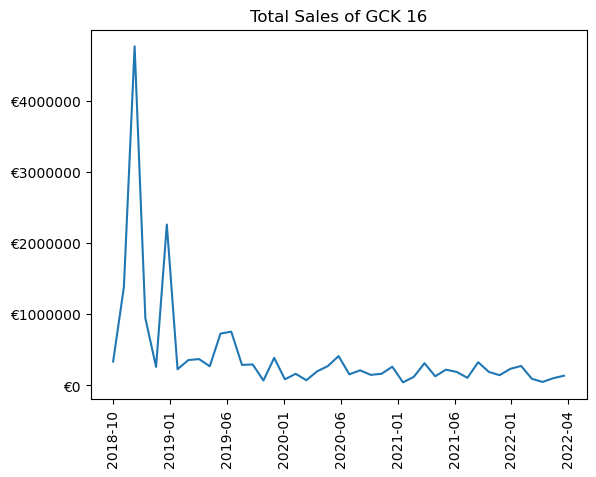

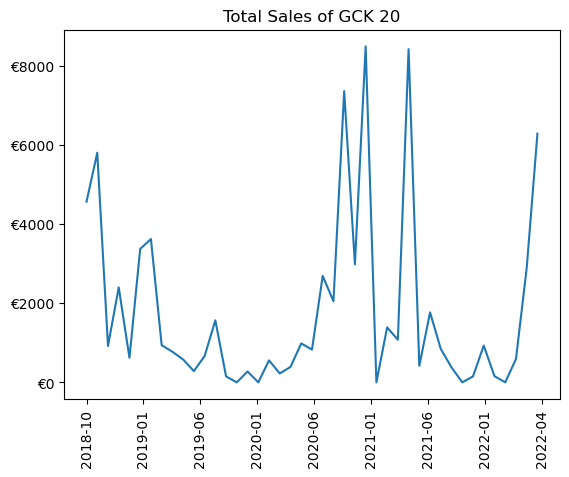

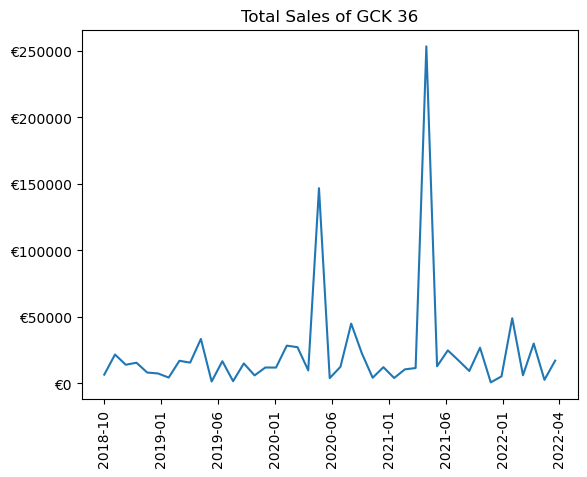

In [30]:
from matplotlib.ticker import FormatStrFormatter
# Get a list of unique 'GCK' values
gck_values = sales_agg['GCK'].unique()

# Define a list of the desired x-axis tick labels
x_tick_labels = ['2018-10','2019-01', '2019-06', '2020-01', '2020-06', '2021-01', '2021-06', '2022-01', '2022-04']

# Define a dictionary to map each month to its corresponding index in the list of tick labels
month_to_index = {'2018-10': 0, '2019-01': 5.3, '2019-06': 10.6, '2020-01': 15.9, '2020-06': 21.2, '2021-01': 26.5, '2021-06': 31.8, '2022-01': 37.1, '2022-04': 42.4}

# Loop over each unique 'GCK' value
for gck in gck_values:
    # Get the data for the current 'GCK' value
    gck_data = sales_agg[sales_agg['GCK'] == gck]
    
    # Compute the total sales for the current 'GCK' value
    total_sales = gck_data['Sales (€)'].sum()
    y_tick_interval = 25000

    # Create a new plot
    fig, ax = plt.subplots()
    
    # Set the y-axis tick label format
    y_tick_fmt = FormatStrFormatter('€%.0f')
    ax.yaxis.set_major_formatter(y_tick_fmt)
    
    
    ax.plot(gck_data.groupby('DateMY')['Sales (€)'].sum())
    ax.grid(False)
        
    # Set the title of the plot to the current 'GCK' value
    ax.set_title('Total Sales of GCK {}'.format(gck))
    
    # Set the x-axis tick labels to show only the desired values
    ax.set_xticks([month_to_index[label] for label in x_tick_labels])
    ax.set_xticklabels(x_tick_labels)
    
    # Rotate the x-axis tick labels by 90 degrees
    for tick in ax.get_xticklabels():
        tick.set_rotation(90)
        
    plt.show()


In [31]:
# merge the two data frames on the "Date" column
price_index['Date']=price_index['Date'].dt.strftime('%Y-%m')
sales_agg = pd.merge(sales_agg, price_index, left_on='DateMY', right_on='Date', how='left')
sales_agg

,DateMY,GCK,Sales (€),Date,Consumer Price Index (2020=100)
0,2018-10,1,36098918.79,2018-10,99.1
1,2020-10,1,41453854.50,2020-10,99.9
2,2020-11,1,37643611.57,2020-11,99.7
3,2020-12,1,34816959.18,2020-12,99.8
4,2021-01,1,27180432.94,2021-01,101.0
...,...,...,...,...,...
597,2020-02,36,11813.40,2020-02,100.1
598,2020-03,36,28300.82,2020-03,100.3
599,2020-04,36,27121.60,2020-04,100.4
600,2020-06,36,146778.15,2020-06,100.5


In [32]:
# create a new column that multiplies the sales value by the consumer price index
# From now on, the adjusted sales will always be used and in the end it will be readjusted to get the accurate predictions
sales_agg['Adjusted Sales (€)'] = sales_agg['Sales (€)'] * sales_agg['Consumer Price Index (2020=100)'].astype(float)/100
sales_agg.drop(columns=['Sales (€)','Date','Consumer Price Index (2020=100)'],inplace=True)
sales_agg

,DateMY,GCK,Adjusted Sales (€)
0,2018-10,1,3.577403e+07
1,2020-10,1,4.141240e+07
2,2020-11,1,3.753068e+07
3,2020-12,1,3.474733e+07
4,2021-01,1,2.745224e+07
...,...,...,...
597,2020-02,36,1.182521e+04
598,2020-03,36,2.838572e+04
599,2020-04,36,2.723009e+04
600,2020-06,36,1.475120e+05


In [33]:
# Saving the original 'market_data' dataset before altering its format
original_market_data=market_data.copy()

In [34]:
# Creating a new dataset 'market_data_pred' by reorganizing 'original_market_data'
market_data_pred=original_market_data.T.append(original_market_data.T.iloc[1]+' '+original_market_data.T.iloc[0],ignore_index=True)
market_data_pred.set_axis(market_data_pred.loc[221],inplace=True,axis=1)
market_data_pred.drop(index=[0,1,221],inplace=True)

# Set the index to be the same as the original market data and convert to float
market_data_pred.set_index(original_market_data.T.index[2:],inplace=True)
market_data_pred=market_data_pred.astype(float)

# Convert the index to a datetime object and rename it
market_data_pred.index=pd.to_datetime(market_data_pred.index)
market_data_pred.index.name=None
market_data_pred.rename_axis("Date", axis=1, inplace=True)

# Add the monthly GDP data to the market data
market_data_pred['GDP Germany']=gdp_monthly['GDP'][1:220]
market_data_pred.head()

C:\Users\migue\AppData\Local\Temp\ipykernel_10312\2845946361.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  market_data_pred=original_market_data.T.append(original_market_data.T.iloc[1]+' '+original_market_data.T.iloc[0],ignore_index=True)


Date,Production Index Machinery & Electricals China,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,...,Production Index Machinery and equipment n.e.c. Germany,Production Index Electrical equipment United States,Production Index Electrical equipment World,Production Index Electrical equipment Switzerland,Production Index Electrical equipment United Kingdom,Production Index Electrical equipment Italy,Production Index Electrical equipment Japan,Production Index Electrical equipment France,Production Index Electrical equipment Germany,GDP Germany
2004-02-01,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.334010,110.495272,...,80.829010,117.723991,NaN,81.100000,120.706516,141.510864,106.161262,102.077057,85.913200,183393.333333
2004-03-01,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,...,102.130104,119.220779,NaN,76.690307,138.309550,152.880234,140.288741,117.225685,97.670815,183393.333333
2004-04-01,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,...,90.961426,117.441124,NaN,71.552403,115.557330,137.796875,106.271197,105.335777,87.253983,186720.000000
2004-05-01,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,...,88.082901,117.899216,NaN,66.414500,119.269534,143.860535,101.608710,96.616508,84.675552,186720.000000
2004-06-01,27.009138,27.009138,133.785737,106.641482,99.010814,95.108740,136.424935,110.889719,120.332920,119.616380,...,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.458710,95.401802,186720.000000


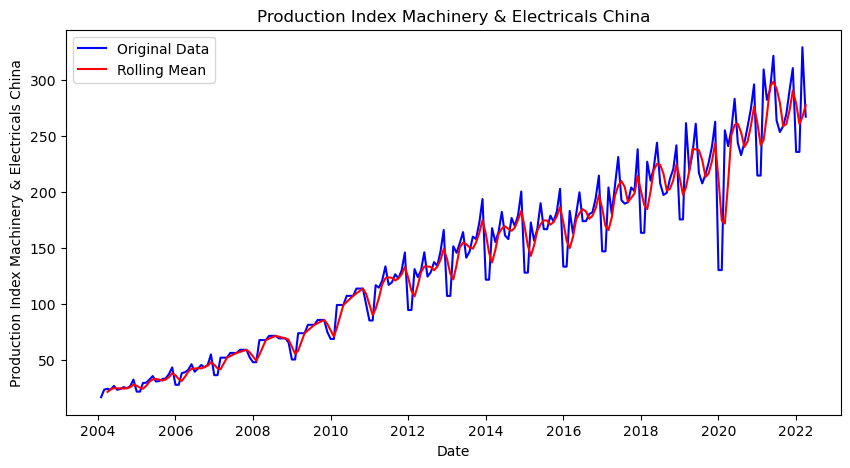

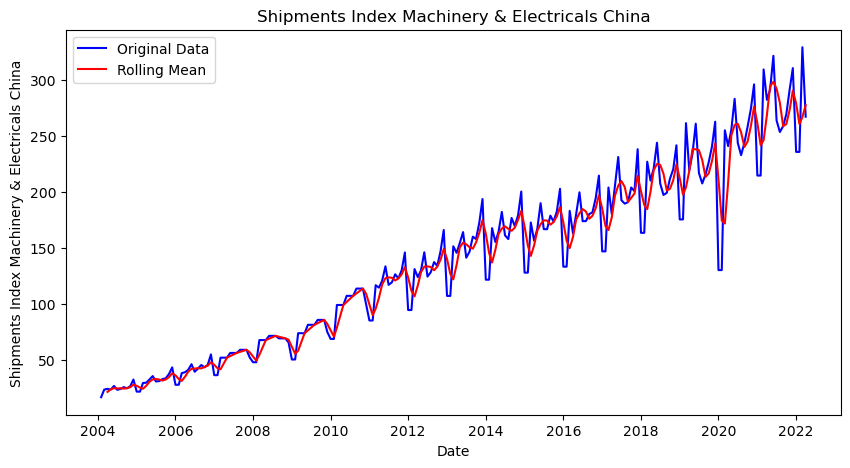

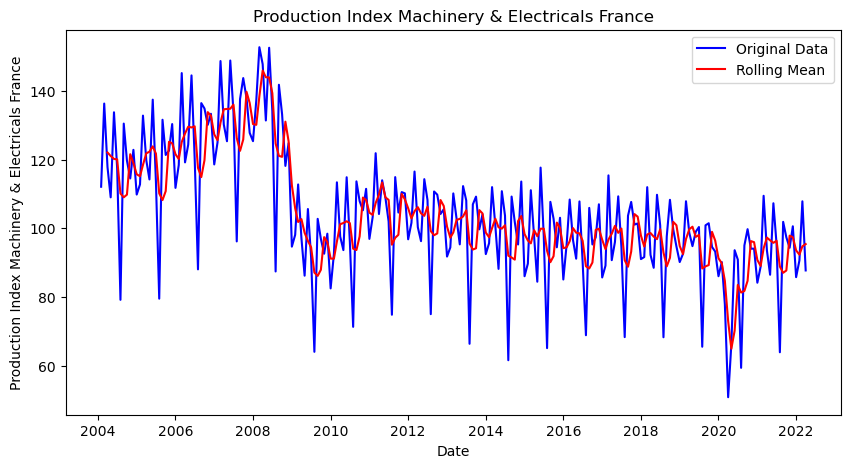

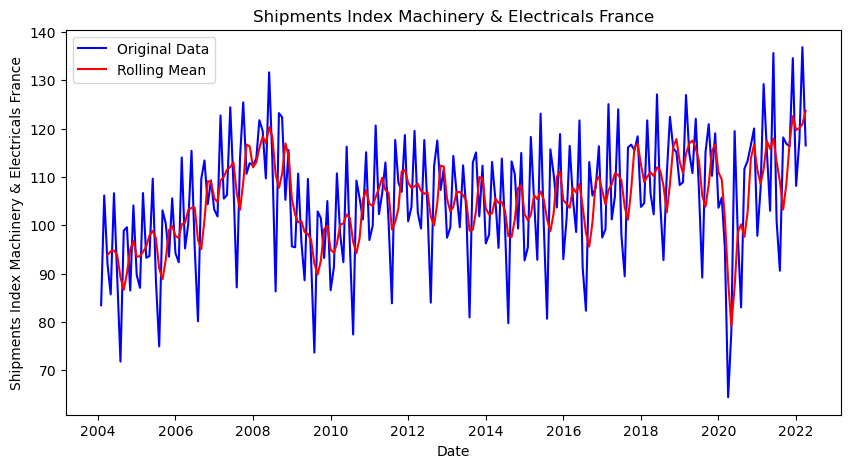

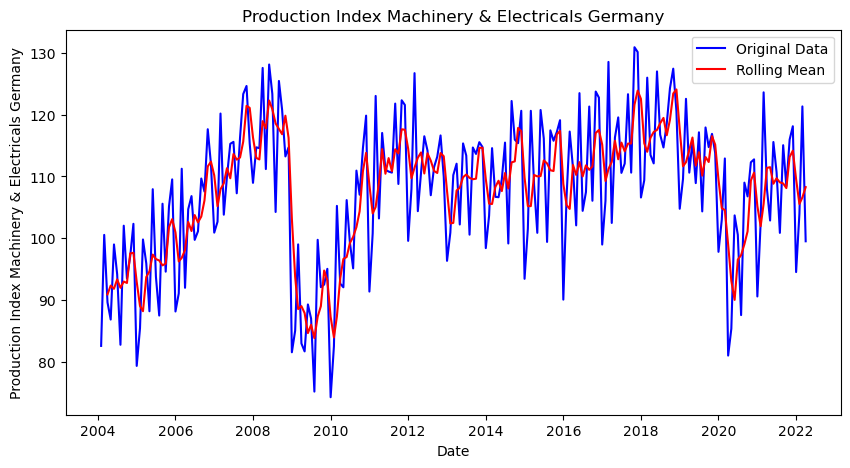

...

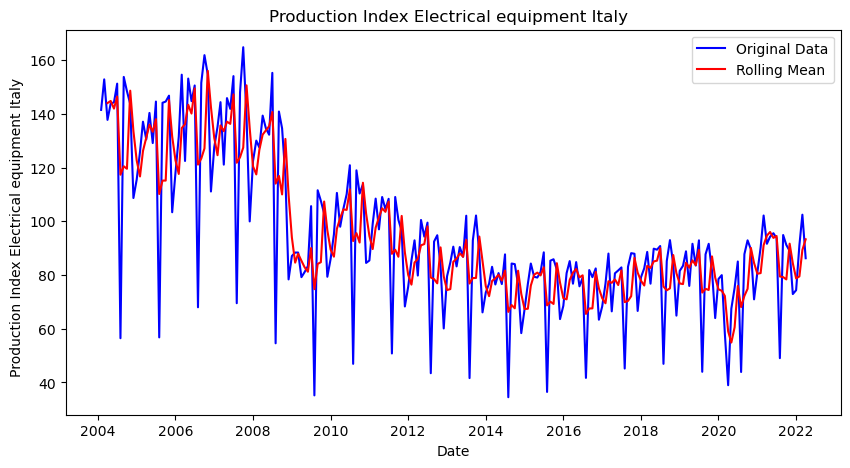

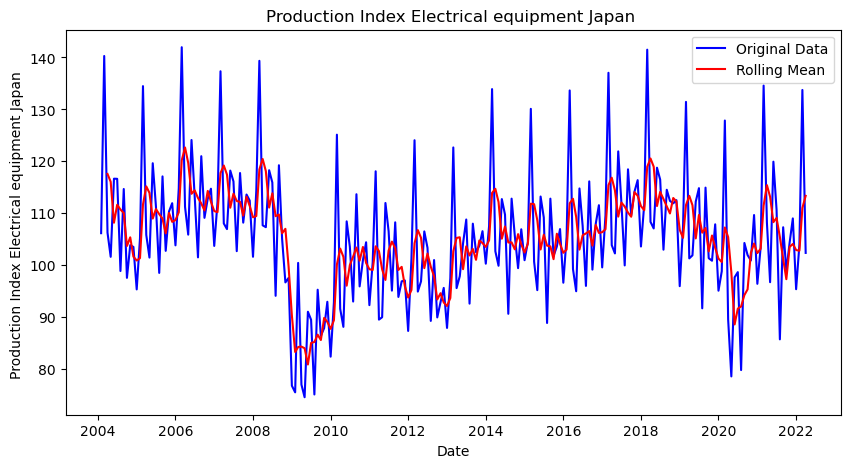

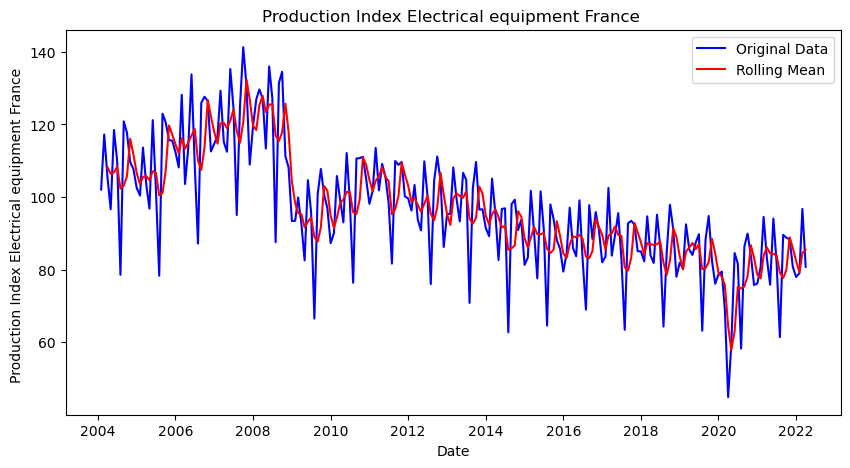

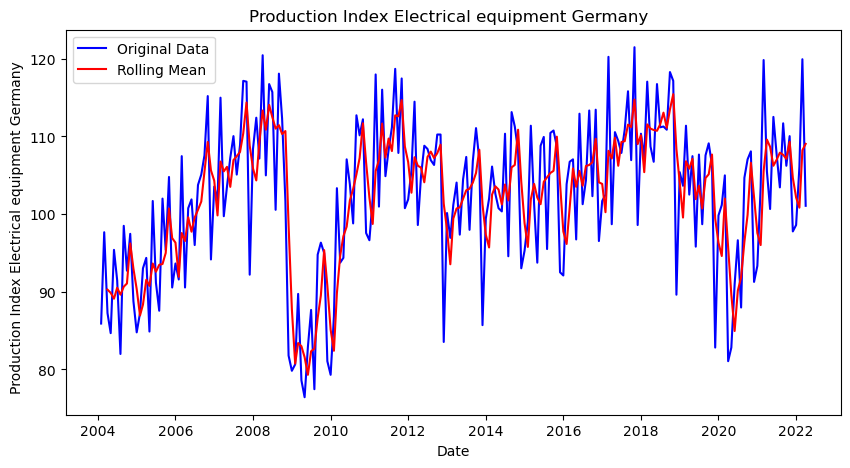

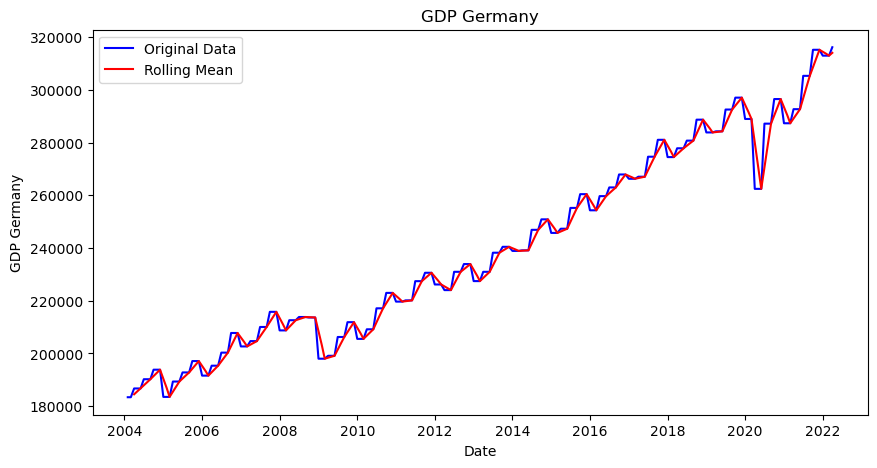

In [35]:
# loop through each column and plot its values
for col in market_data_pred.columns:
    # create a new figure and axis
    fig, ax = plt.subplots(figsize=(10, 5))
    
    # plot the original data in blue
    ax.plot(market_data_pred.index, market_data_pred[col], color='blue', label='Original Data')
    
    # plot the rolling mean in red
    ax.plot(market_data_pred[col].rolling(window=3).mean(), color='red', label='Rolling Mean')
    
    # set axis labels and title
    ax.set_xlabel('Date')
    ax.set_ylabel(col)
    ax.set_title(col)
    ax.grid(False)
    
    # show legend and plot
    ax.legend()
    plt.show()

<a class="anchor" id="ugck1">
    
## Product Group 1
    
</a>

In [36]:
# Sales dataset aggregated by month for the first product group
sales_agg1=pd.DataFrame(sales_agg[sales_agg['GCK']==1].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg1.reset_index(inplace=True)
sales_agg1.head()

,DateMY,Adjusted Sales (€)
0,2018-10,3.577403e+07
1,2018-11,5.063649e+06
2,2018-12,3.732127e+07
3,2019-01,2.709040e+07
4,2019-02,3.413209e+07


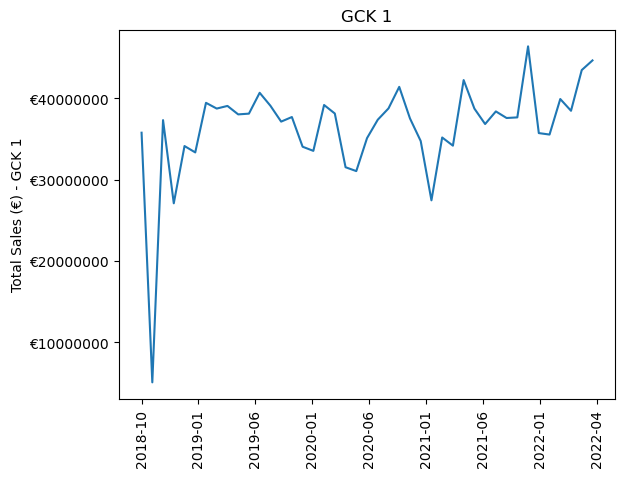

In [37]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg1['DateMY'],sales_agg1['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 1')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 1')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

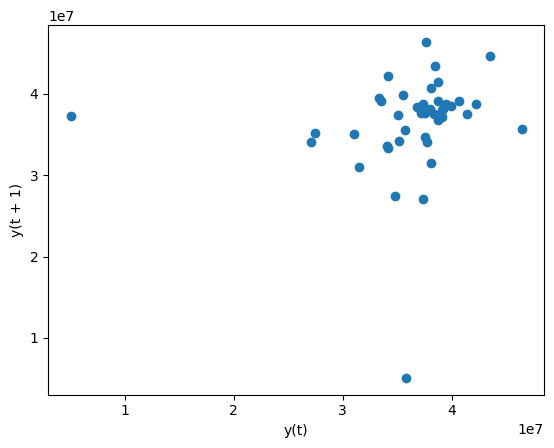

In [38]:
pd.plotting.lag_plot(sales_agg1['Adjusted Sales (€)'],lag=1)

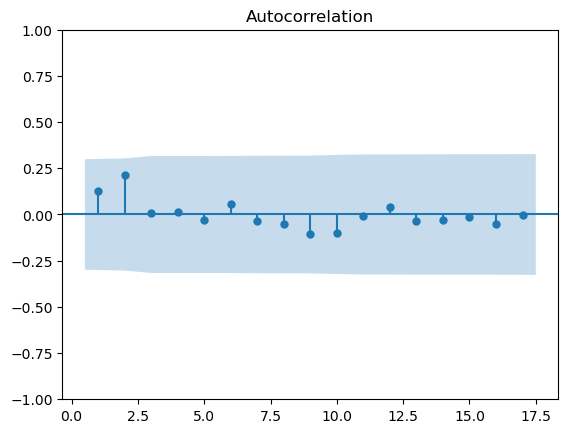

In [39]:
sm.graphics.tsa.plot_acf(sales_agg1['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


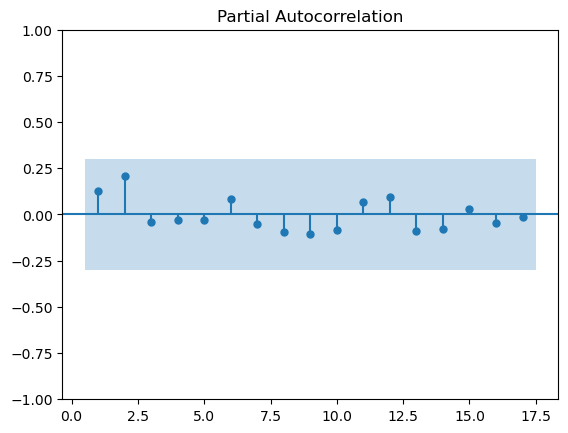

In [40]:
sm.graphics.tsa.plot_pacf(sales_agg1['Adjusted Sales (€)'],zero=False);

In [41]:
# ADF test
result = adfuller(sales_agg1['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -5.420747813636797
p-value: 3.063394316395847e-06
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck3">
    
## Product Group 3
    
</a>

In [42]:
# Sales dataset aggregated by month for the third product group
sales_agg3=pd.DataFrame(sales_agg[sales_agg['GCK']==3].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg3.reset_index(inplace=True)
sales_agg3.head()

,DateMY,Adjusted Sales (€)
0,2018-10,8.016661e+06
1,2018-11,1.168506e+07
2,2018-12,8.605806e+06
3,2019-01,1.045908e+07
4,2019-02,9.974609e+06


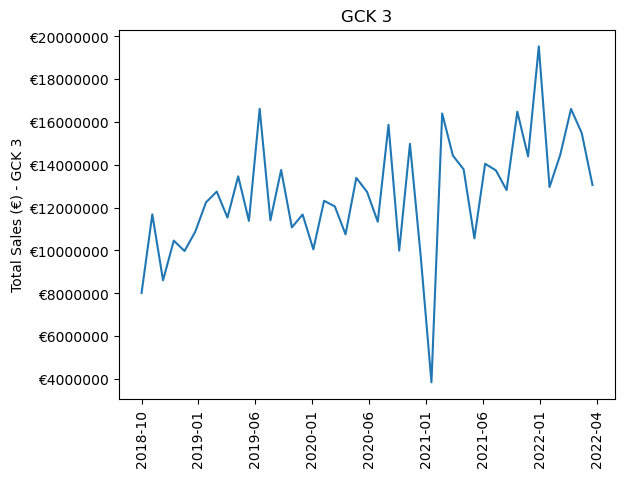

In [43]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg3['DateMY'],sales_agg3['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 3')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 3')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 12)'>

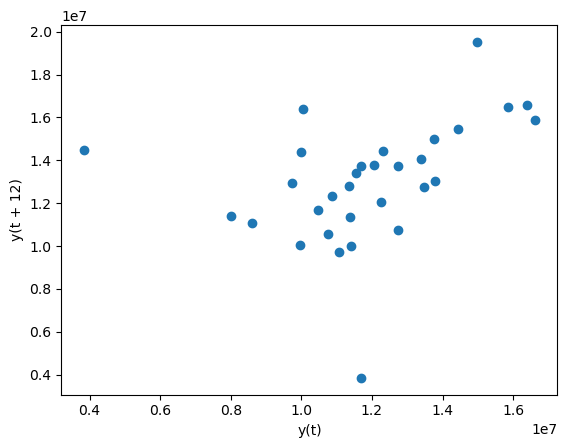

In [44]:
pd.plotting.lag_plot(sales_agg3['Adjusted Sales (€)'],lag=12)

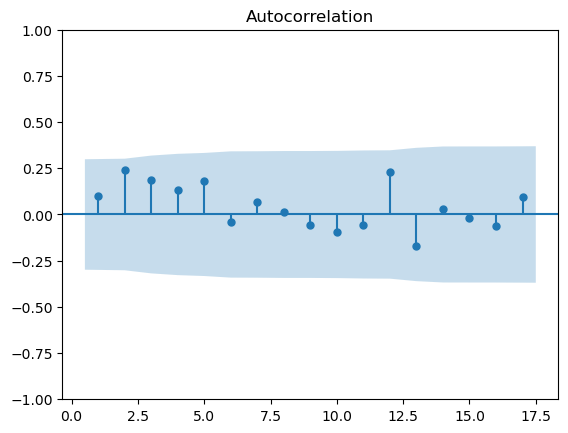

In [45]:
sm.graphics.tsa.plot_acf(sales_agg3['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


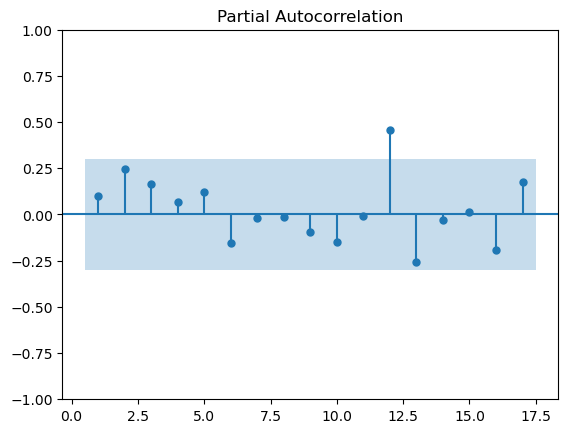

In [46]:
sm.graphics.tsa.plot_pacf(sales_agg3['Adjusted Sales (€)'],zero=False);

In [47]:
# ADF test
result = adfuller(sales_agg3['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -5.922813492130286
p-value: 2.4833729764064977e-07
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck4">
    
## Product Group 4
    
</a>

In [48]:
# Sales dataset aggregated by month for the fourth product group
sales_agg4=pd.DataFrame(sales_agg[sales_agg['GCK']==4].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg4.reset_index(inplace=True)
sales_agg4.head()

,DateMY,Adjusted Sales (€)
0,2018-10,394180.84379
1,2018-11,365752.58370
2,2018-12,423649.44560
3,2019-01,473037.88076
4,2019-02,608251.19580


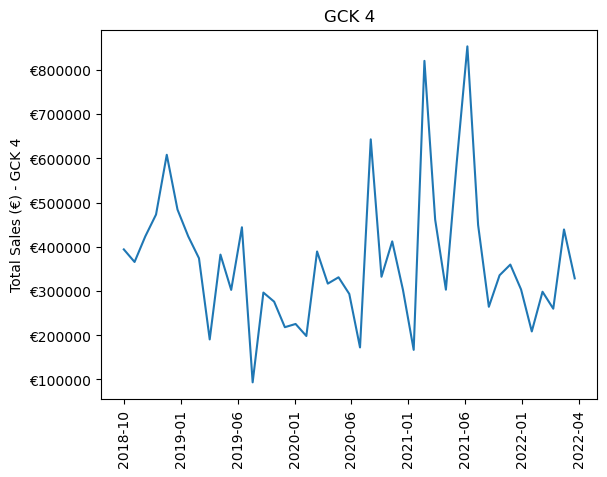

In [49]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg4['DateMY'],sales_agg4['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 4')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 4')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 12)'>

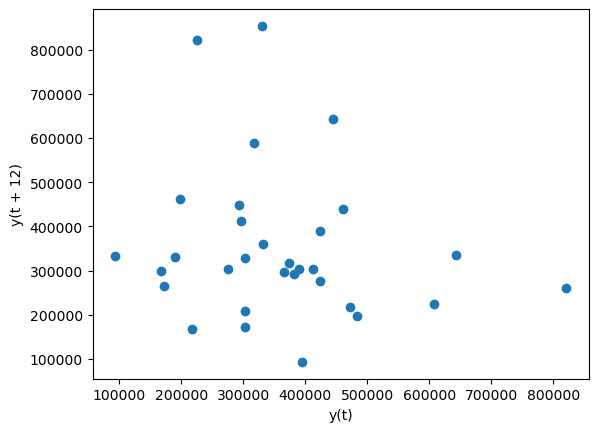

In [50]:
pd.plotting.lag_plot(sales_agg4['Adjusted Sales (€)'],lag=12)

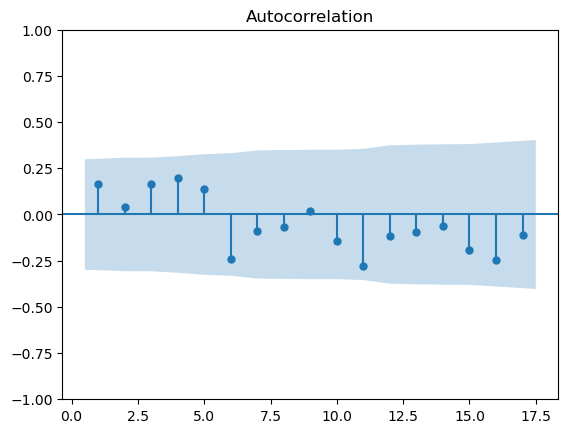

In [51]:
sm.graphics.tsa.plot_acf(sales_agg4['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


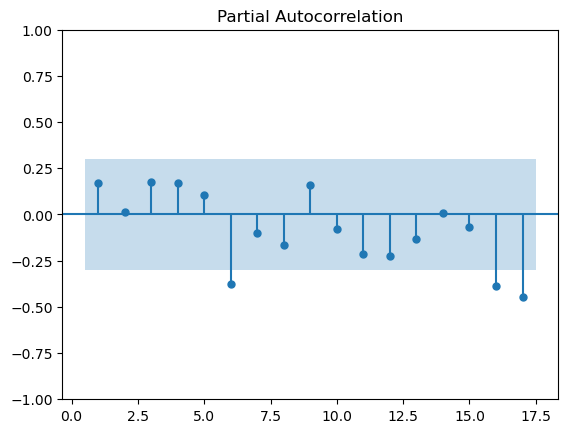

In [52]:
sm.graphics.tsa.plot_pacf(sales_agg4['Adjusted Sales (€)'],zero=False);

In [53]:
# ADF test
result = adfuller(sales_agg4['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -5.346922271771833
p-value: 4.374404442735414e-06
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck5">
    
## Product Group 5
    
</a>

In [54]:
# Sales dataset aggregated by month for the fifth product group
sales_agg5=pd.DataFrame(sales_agg[sales_agg['GCK']==5].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg5.reset_index(inplace=True)
sales_agg5.head()

,DateMY,Adjusted Sales (€)
0,2018-10,2.476570e+06
1,2018-11,8.859035e+06
2,2018-12,6.843295e+06
3,2019-01,8.043841e+06
4,2019-02,6.748545e+06


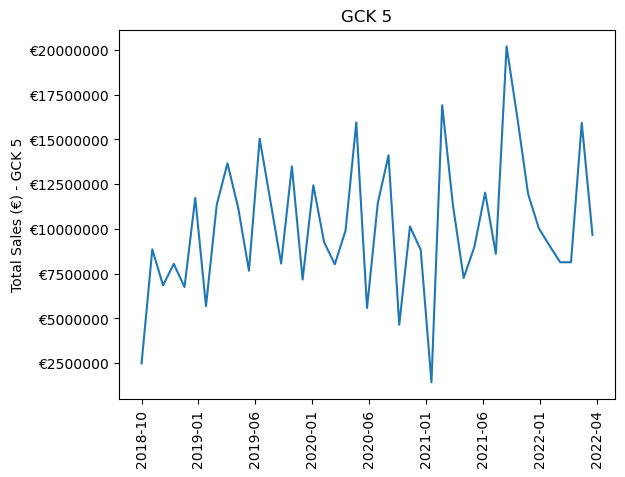

In [55]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg5['DateMY'],sales_agg5['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 5')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 5')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 12)'>

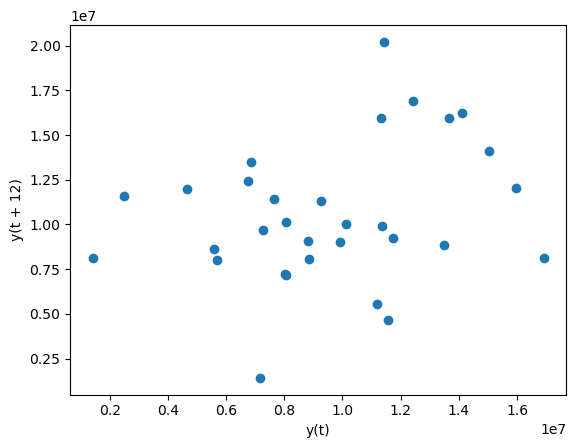

In [56]:
pd.plotting.lag_plot(sales_agg5['Adjusted Sales (€)'],lag=12)

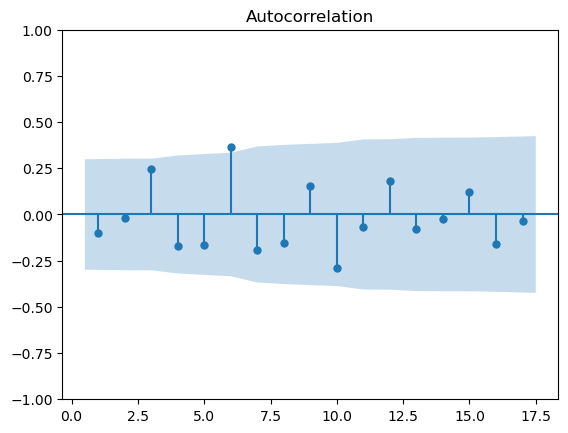

In [57]:
sm.graphics.tsa.plot_acf(sales_agg5['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


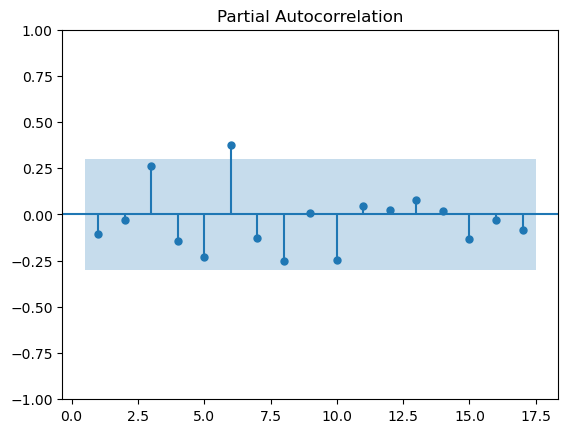

In [58]:
sm.graphics.tsa.plot_pacf(sales_agg5['Adjusted Sales (€)'],zero=False);

In [59]:
# ADF test
result = adfuller(sales_agg5['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -7.369453919361229
p-value: 9.052443680308147e-11
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck6">
    
## Product Group 6
    
</a>

In [60]:
# Sales dataset aggregated by month for the sixth product group
sales_agg6=pd.DataFrame(sales_agg[sales_agg['GCK']==6].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg6.reset_index(inplace=True)
sales_agg6.head()

,DateMY,Adjusted Sales (€)
0,2018-10,365908.51560
1,2018-11,465951.25560
2,2018-12,984480.59965
3,2019-01,585099.99570
4,2019-02,531738.80712


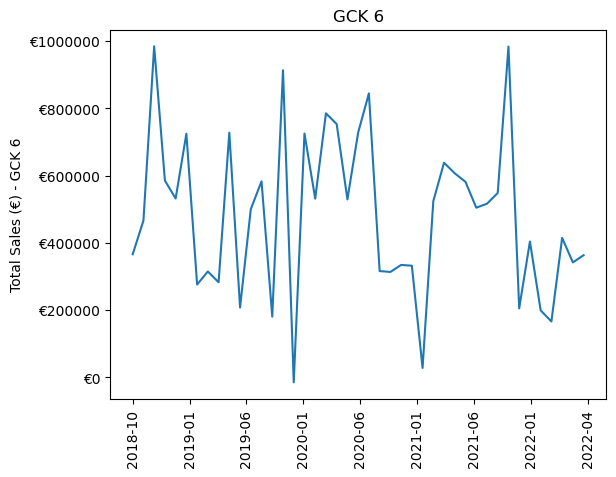

In [61]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg6['DateMY'],sales_agg6['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 6')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 6')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 12)'>

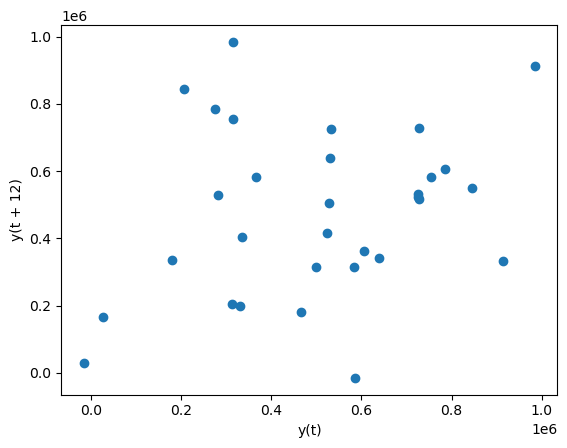

In [62]:
pd.plotting.lag_plot(sales_agg6['Adjusted Sales (€)'],lag=12)

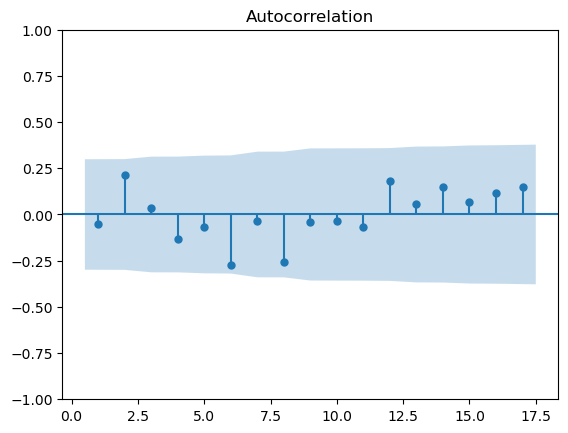

In [63]:
sm.graphics.tsa.plot_acf(sales_agg6['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


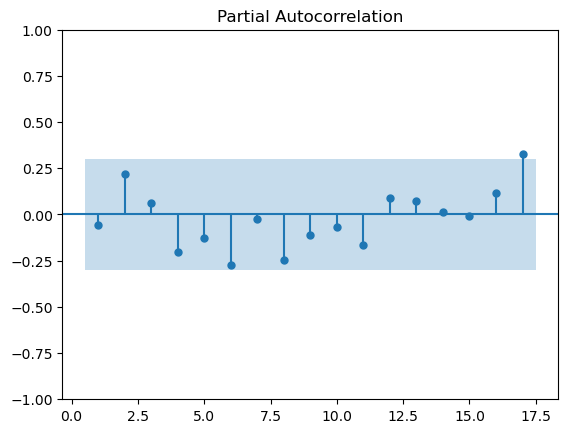

In [64]:
sm.graphics.tsa.plot_pacf(sales_agg6['Adjusted Sales (€)'],zero=False);

In [65]:
# ADF test
result = adfuller(sales_agg6['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.572016323659713
p-value: 0.006319111024141652
Critical values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
The time series is stationary


<a class="anchor" id="ugck8">
    
## Product Group 8
    
</a>

In [66]:
# Sales dataset aggregated by month for the eighth product group
sales_agg8=pd.DataFrame(sales_agg[sales_agg['GCK']==8].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg8.reset_index(inplace=True)
sales_agg8.head()

,DateMY,Adjusted Sales (€)
0,2018-10,580778.26534
1,2018-11,518398.37845
2,2018-12,267418.34935
3,2019-01,372627.94655
4,2019-02,361474.53417


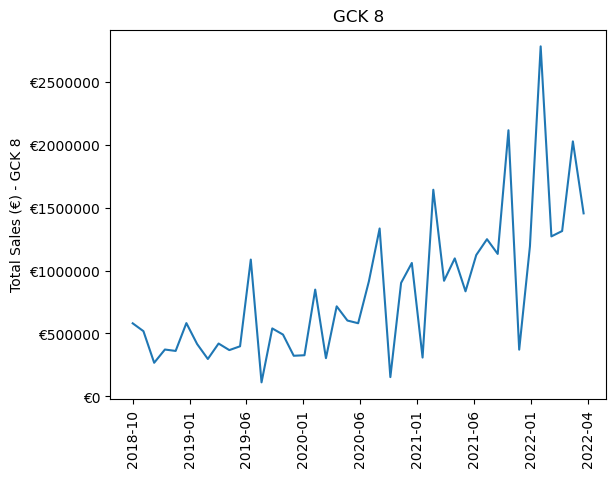

In [67]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg8['DateMY'],sales_agg8['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 8')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 8')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 12)'>

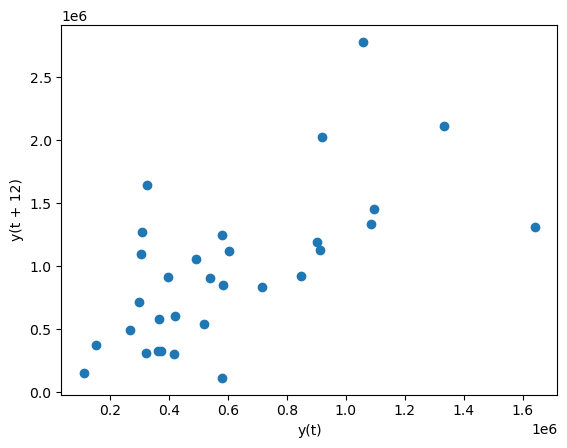

In [68]:
pd.plotting.lag_plot(sales_agg8['Adjusted Sales (€)'],lag=12)

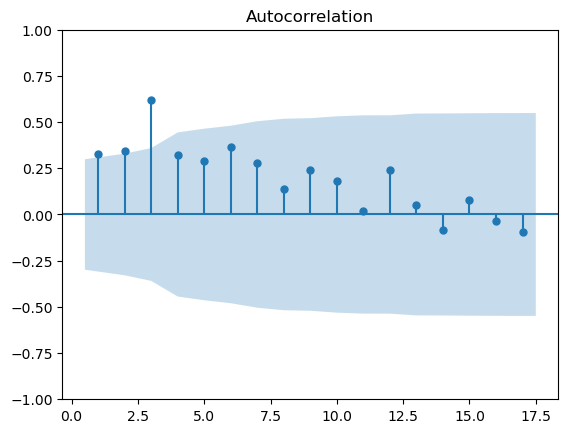

In [69]:
sm.graphics.tsa.plot_acf(sales_agg8['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


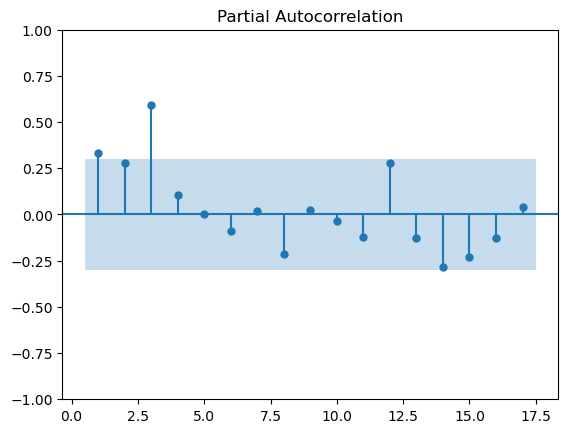

In [70]:
sm.graphics.tsa.plot_pacf(sales_agg8['Adjusted Sales (€)'],zero=False);

In [71]:
# ADF test
result = adfuller(sales_agg8['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: 2.7159393652073462
p-value: 0.9990876937986093
Critical values: {'1%': -3.626651907578875, '5%': -2.9459512825788754, '10%': -2.6116707716049383}
The time series is non-stationary


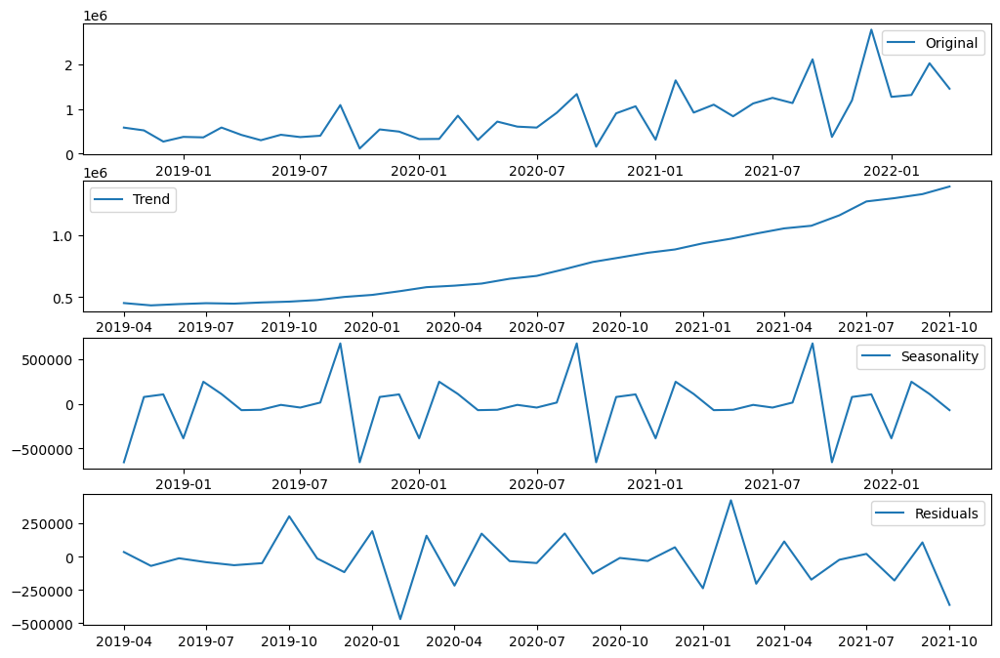

In [72]:
# Extract the seasonal, trend, and residual components
sales_agg8['DateMY']=pd.to_datetime(sales_agg8['DateMY'])
result = seasonal_decompose(sales_agg8.set_index('DateMY'), model='additive')
seasonal = result.seasonal
trend = result.trend
resid = result.resid

# Plot the components
fig, axs = plt.subplots(4, 1, figsize=(12, 8))
axs[0].plot(sales_agg8.set_index('DateMY'), label='Original')
axs[0].legend()
axs[1].plot(trend, label='Trend')
axs[1].legend()
axs[2].plot(seasonal, label='Seasonality')
axs[2].legend()
axs[3].plot(resid, label='Residuals')
axs[3].legend()

plt.show()

<a class="anchor" id="ugck9">
    
## Product Group 9
    
</a>

In [73]:
# Sales dataset aggregated by month for the ninth product group
sales_agg9=pd.DataFrame(sales_agg[sales_agg['GCK']==9].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg9.reset_index(inplace=True)
sales_agg9.head()

,DateMY,Adjusted Sales (€)
0,2018-10,3190.34612
1,2018-11,1847.76150
2,2018-12,0.00000
3,2019-01,1452.79900
4,2019-02,3172.82868


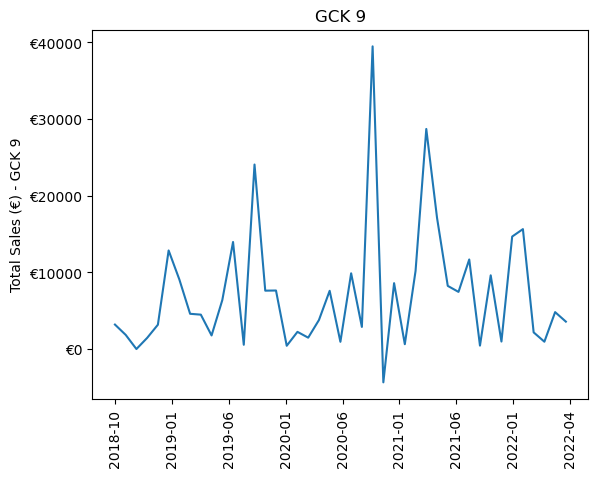

In [74]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg9['DateMY'],sales_agg9['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 9')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 9')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

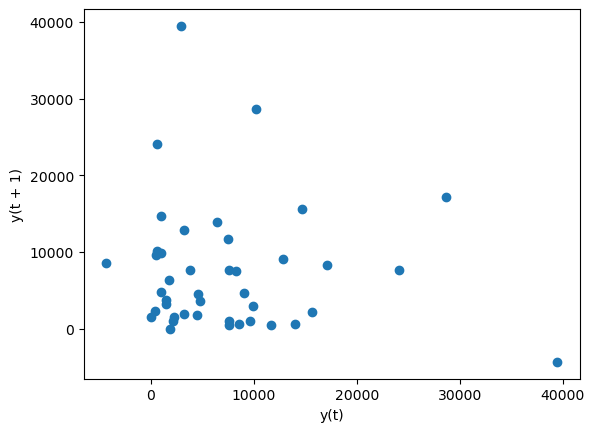

In [75]:
pd.plotting.lag_plot(sales_agg9['Adjusted Sales (€)'],lag=1)

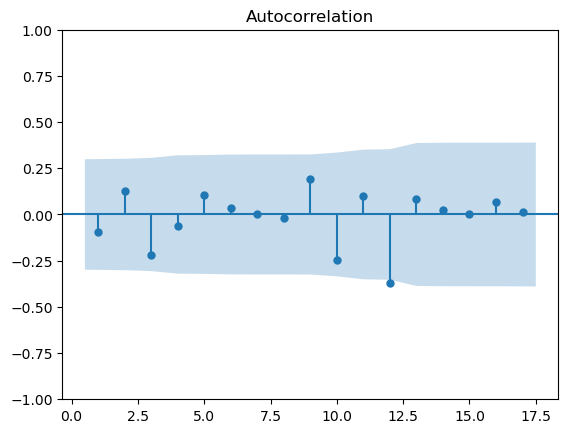

In [76]:
sm.graphics.tsa.plot_acf(sales_agg9['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


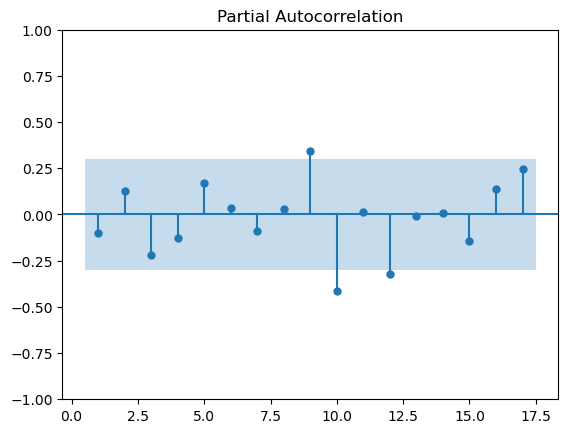

In [77]:
sm.graphics.tsa.plot_pacf(sales_agg9['Adjusted Sales (€)'],zero=False);

In [78]:
# ADF test
result = adfuller(sales_agg9['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.9680728170433905
p-value: 8.808995411547516e-10
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck11">
    
## Product Group 11
    
</a>

In [79]:
# Sales dataset aggregated by month for the eleventh product group
sales_agg11=pd.DataFrame(sales_agg[sales_agg['GCK']==11].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg11.reset_index(inplace=True)
sales_agg11.head()

,DateMY,Adjusted Sales (€)
0,2018-10,1.012112e+06
1,2018-11,1.870362e+06
2,2018-12,1.207730e+06
3,2019-01,2.165415e+06
4,2019-02,5.988579e+05


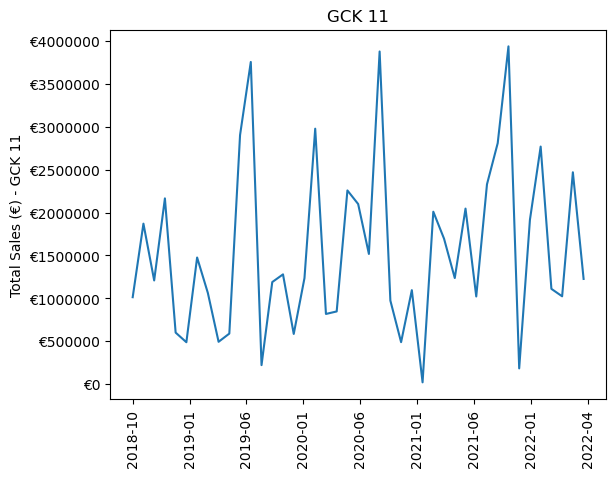

In [80]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg11['DateMY'],sales_agg11['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 11')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 11')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

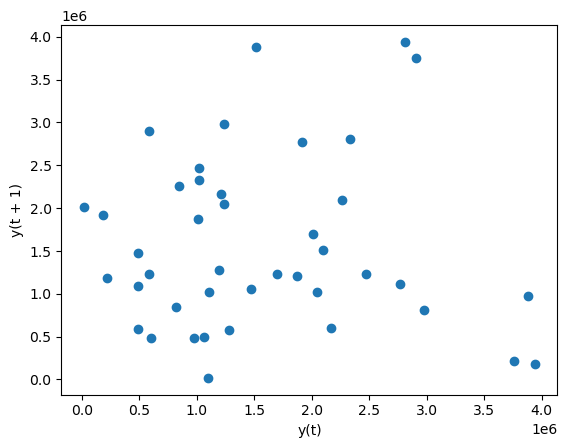

In [81]:
pd.plotting.lag_plot(sales_agg11['Adjusted Sales (€)'],lag=1)

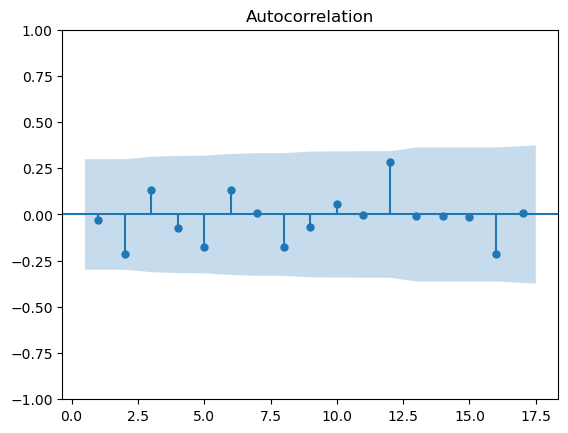

In [82]:
sm.graphics.tsa.plot_acf(sales_agg11['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


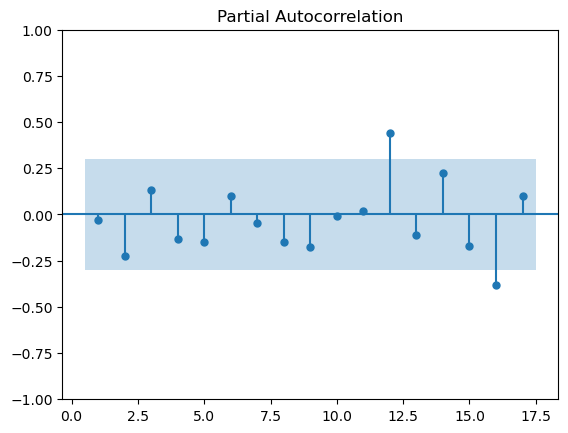

In [83]:
sm.graphics.tsa.plot_pacf(sales_agg11['Adjusted Sales (€)'],zero=False);

In [84]:
# ADF test
result = adfuller(sales_agg11['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -5.484325114346825
p-value: 2.2476448369860267e-06
Critical values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
The time series is stationary


<a class="anchor" id="ugck12">
    
## Product Group 12
    
</a>

In [85]:
# Sales dataset aggregated by month for the twelfth product group
sales_agg12=pd.DataFrame(sales_agg[sales_agg['GCK']==12].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg12.reset_index(inplace=True)
sales_agg12.head()

,DateMY,Adjusted Sales (€)
0,2018-10,28428.15303
1,2018-11,1053.95000
2,2018-12,17612.39100
3,2019-01,20989.86800
4,2019-02,33564.65994


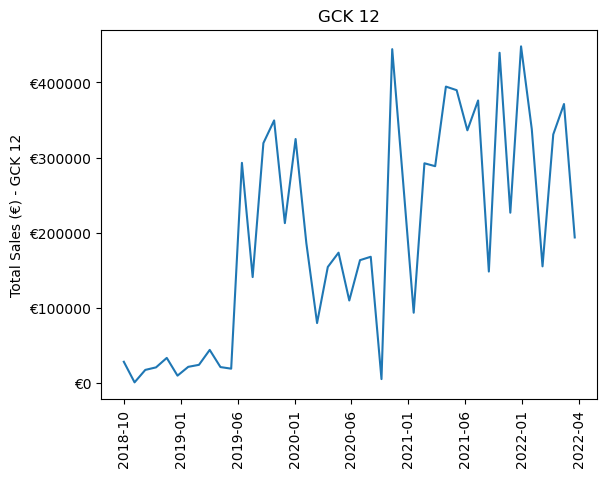

In [86]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg12['DateMY'],sales_agg12['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 12')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)

# Set the title of the plot 
ax.set_title('GCK 12')

# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)

# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

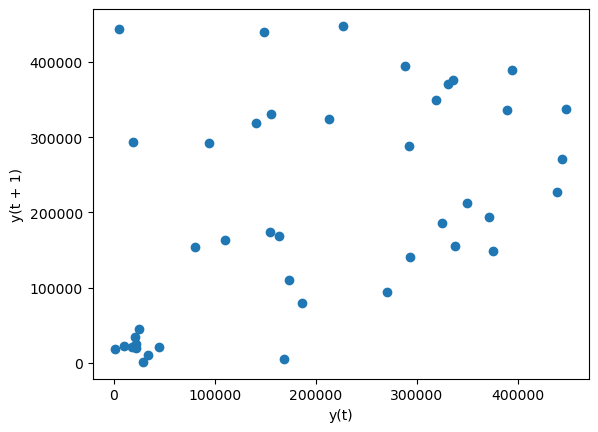

In [87]:
pd.plotting.lag_plot(sales_agg12['Adjusted Sales (€)'],lag=1)

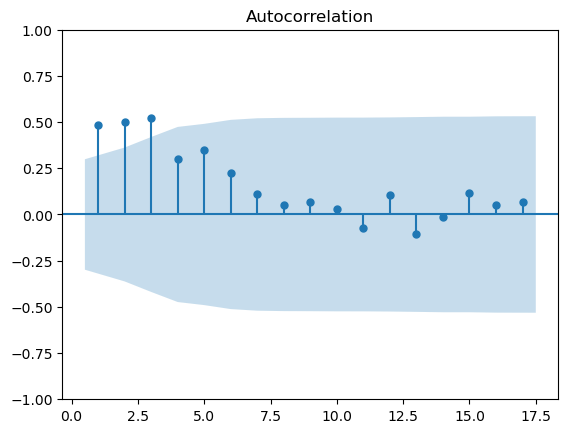

In [88]:
sm.graphics.tsa.plot_acf(sales_agg12['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


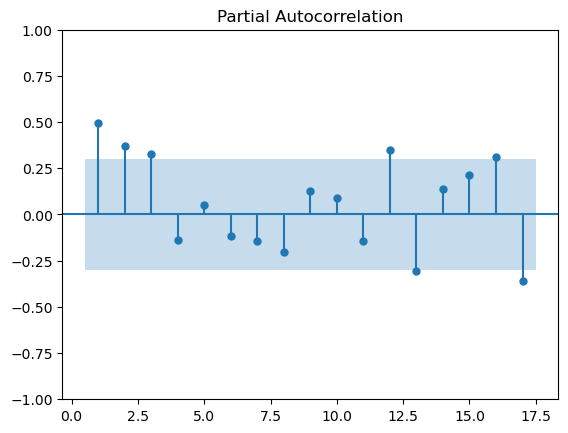

In [89]:
sm.graphics.tsa.plot_pacf(sales_agg12['Adjusted Sales (€)'],zero=False);

In [90]:
# ADF test
result = adfuller(sales_agg12['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.8098237437911786
p-value: 0.0028083893832133488
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck13">
    
## Product Group 13
    
</a>

In [91]:
# Sales dataset aggregated by month for the thirteenth product group
sales_agg13=pd.DataFrame(sales_agg[sales_agg['GCK']==13].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg13.reset_index(inplace=True)
sales_agg13.head()

,DateMY,Adjusted Sales (€)
0,2018-10,27417.10510
1,2018-11,67157.30000
2,2018-12,15420.35230
3,2019-01,26572.72933
4,2019-02,32018.49603


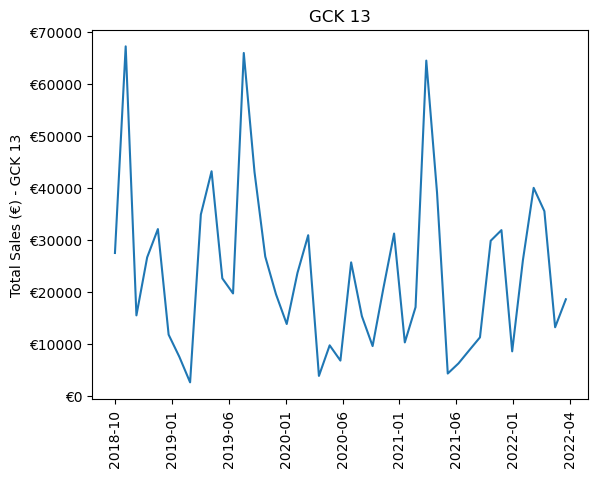

In [92]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg13['DateMY'],sales_agg13['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 13')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 13')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

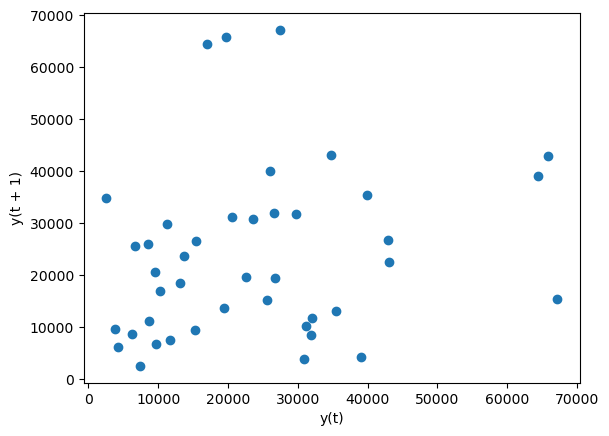

In [93]:
pd.plotting.lag_plot(sales_agg13['Adjusted Sales (€)'],lag=1)

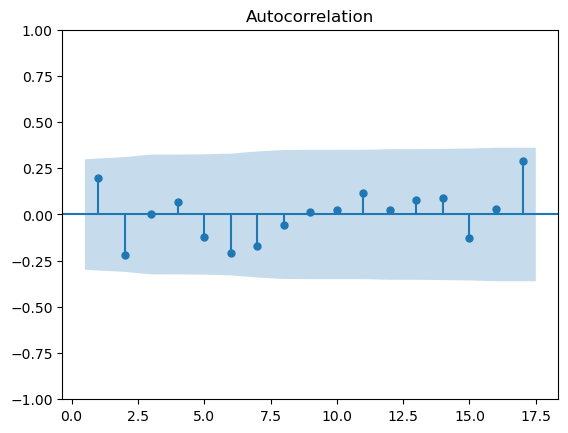

In [94]:
sm.graphics.tsa.plot_acf(sales_agg13['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


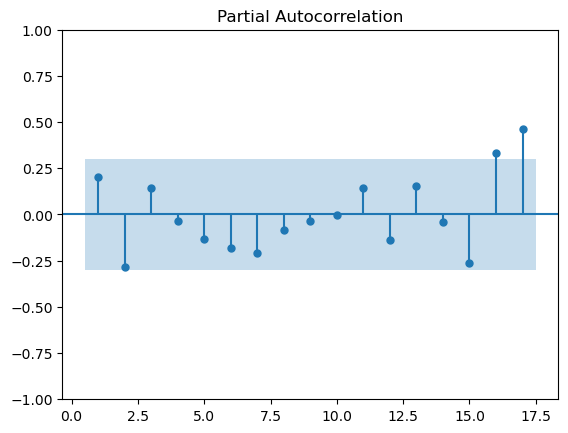

In [95]:
sm.graphics.tsa.plot_pacf(sales_agg13['Adjusted Sales (€)'],zero=False);

In [96]:
# ADF test
result = adfuller(sales_agg13['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.273821554451814
p-value: 0.01608998198613345
Critical values: {'1%': -3.6055648906249997, '5%': -2.937069375, '10%': -2.606985625}
The time series is stationary


<a class="anchor" id="ugck14">
    
## Product Group 14
    
</a>

In [97]:
# Sales dataset aggregated by month for the fourteenth product group
sales_agg14=pd.DataFrame(sales_agg[sales_agg['GCK']==14].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg14.reset_index(inplace=True)
sales_agg14.head()

,DateMY,Adjusted Sales (€)
0,2018-10,5718.0700
1,2018-11,16873.0500
2,2018-12,0.0000
3,2019-01,1647.6128
4,2019-02,18831.5703


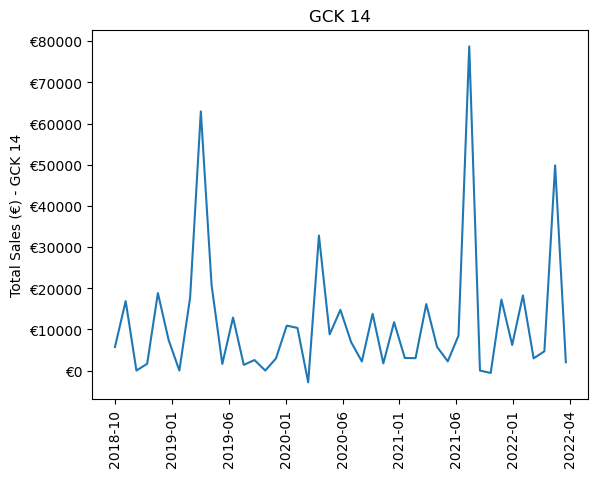

In [98]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg14['DateMY'],sales_agg14['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 14')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 14')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

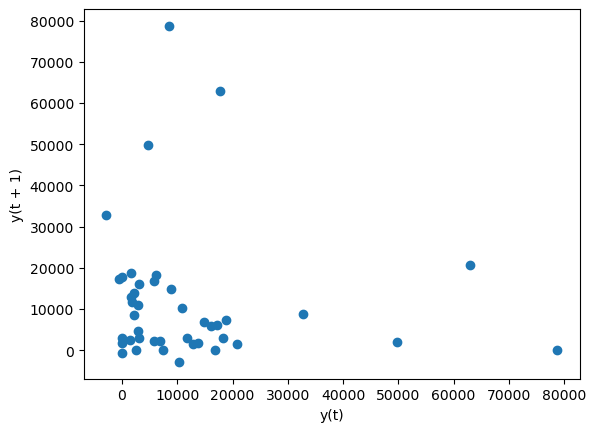

In [99]:
pd.plotting.lag_plot(sales_agg14['Adjusted Sales (€)'],lag=1)

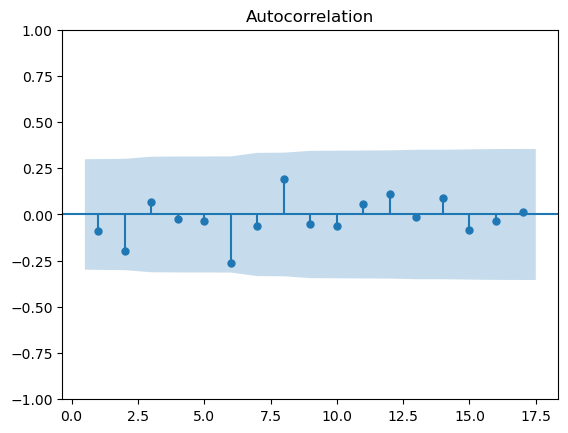

In [100]:
sm.graphics.tsa.plot_acf(sales_agg14['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


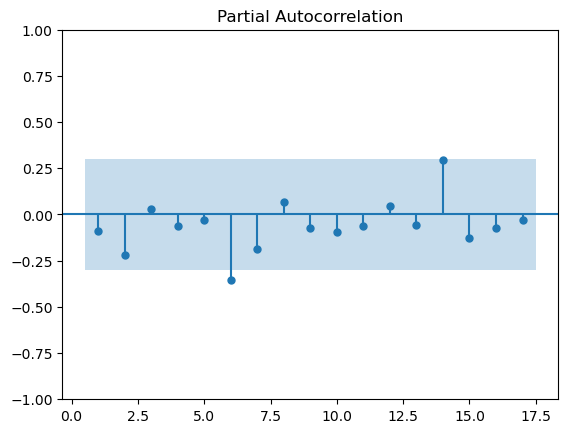

In [101]:
sm.graphics.tsa.plot_pacf(sales_agg14['Adjusted Sales (€)'],zero=False);

In [102]:
# ADF test
result = adfuller(sales_agg14['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.900684584938512
p-value: 1.2844099676883797e-09
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<a class="anchor" id="ugck16">
    
## Product Group 16
    
</a>

In [103]:
# Sales dataset aggregated by month for the sixteenth product group
sales_agg16=pd.DataFrame(sales_agg[sales_agg['GCK']==16].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg16.reset_index(inplace=True)
sales_agg16.head()

,DateMY,Adjusted Sales (€)
0,2018-10,3.301981e+05
1,2018-11,1.357029e+06
2,2018-12,4.691087e+06
3,2019-01,9.212692e+05
4,2019-02,2.528675e+05


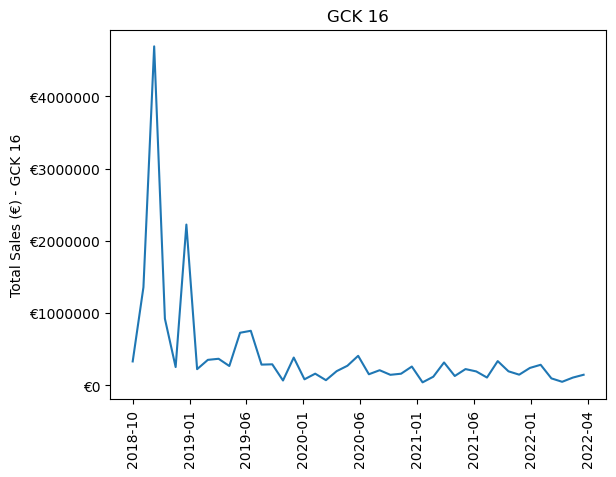

In [104]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg16['DateMY'],sales_agg16['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 16')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 16')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

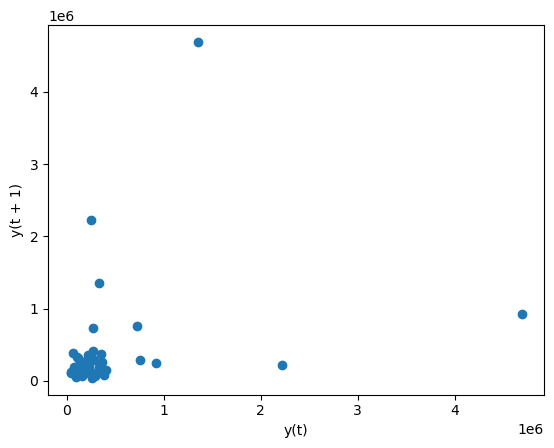

In [105]:
pd.plotting.lag_plot(sales_agg16['Adjusted Sales (€)'],lag=1)

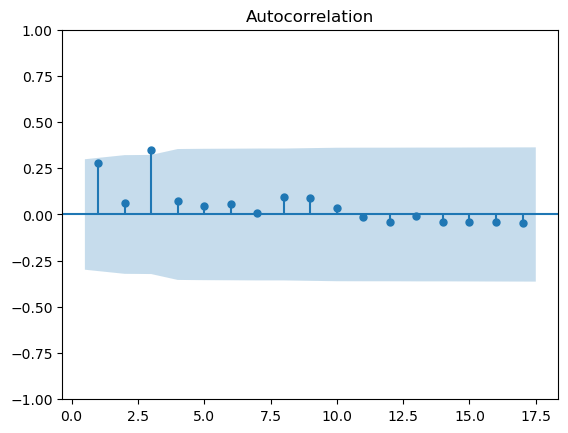

In [106]:
sm.graphics.tsa.plot_acf(sales_agg16['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


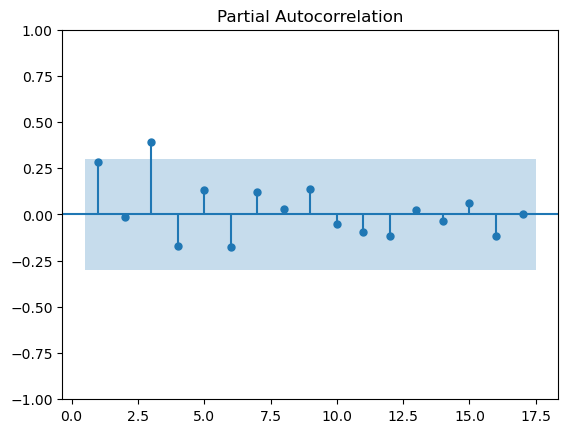

In [107]:
sm.graphics.tsa.plot_pacf(sales_agg16['Adjusted Sales (€)'],zero=False);

In [108]:
# ADF test
result = adfuller(sales_agg16['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.318487170101587
p-value: 3.107895121488079e-08
Critical values: {'1%': -3.6461350877925254, '5%': -2.954126991123355, '10%': -2.6159676124885216}
The time series is stationary


<a class="anchor" id="ugck20">
    
## Product Group 20
    
</a>

In [109]:
# Sales dataset aggregated by month for the twentieth product group
sales_agg20=pd.DataFrame(sales_agg[sales_agg['GCK']==20].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg20.reset_index(inplace=True)
sales_agg20.head()

,DateMY,Adjusted Sales (€)
0,2018-10,4522.07174
1,2018-11,5711.16790
2,2018-12,904.87025
3,2019-01,2342.88508
4,2019-02,608.86746


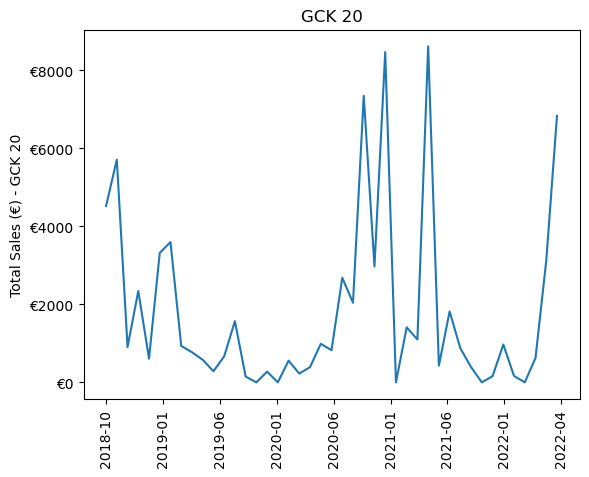

In [110]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg20['DateMY'],sales_agg20['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 20')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 20')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

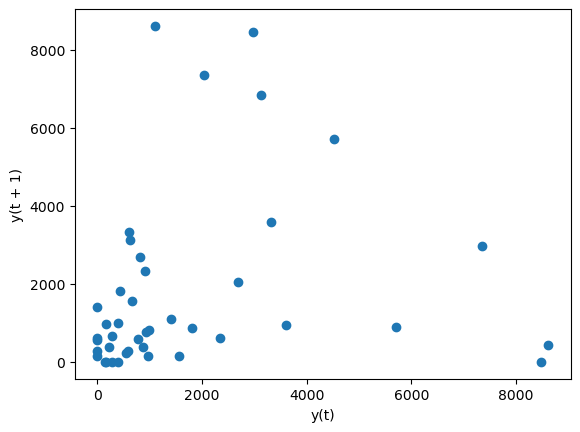

In [111]:
pd.plotting.lag_plot(sales_agg20['Adjusted Sales (€)'],lag=1)

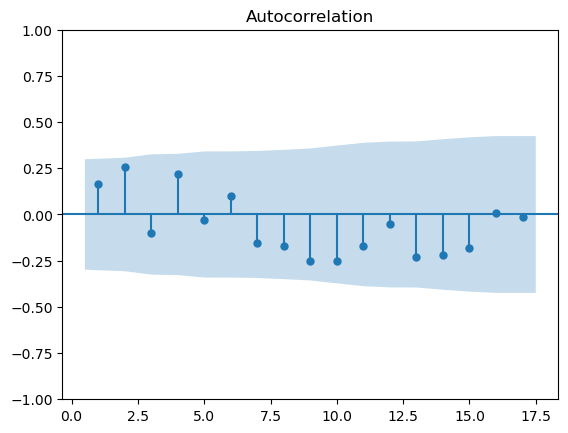

In [112]:
sm.graphics.tsa.plot_acf(sales_agg20['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


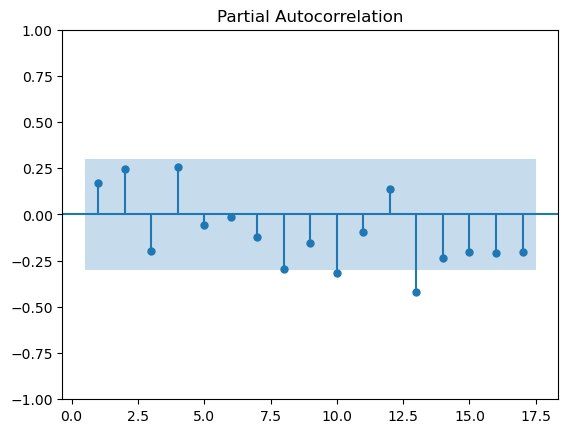

In [113]:
sm.graphics.tsa.plot_pacf(sales_agg20['Adjusted Sales (€)'],zero=False);

In [114]:
# ADF test
result = adfuller(sales_agg20['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.057543251266095
p-value: 0.02985893419477049
Critical values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
The time series is stationary


<a class="anchor" id="ugck36">
    
## Product Group 36
    
</a>

In [115]:
# Sales dataset aggregated by month for the thirty-sixth product group
sales_agg36=pd.DataFrame(sales_agg[sales_agg['GCK']==36].groupby('DateMY')['Adjusted Sales (€)'].sum())
sales_agg36.reset_index(inplace=True)
sales_agg36.head()

,DateMY,Adjusted Sales (€)
0,2018-10,6416.32860
1,2018-11,21293.34585
2,2018-12,13715.65220
3,2019-01,15089.16903
4,2019-02,7898.17815


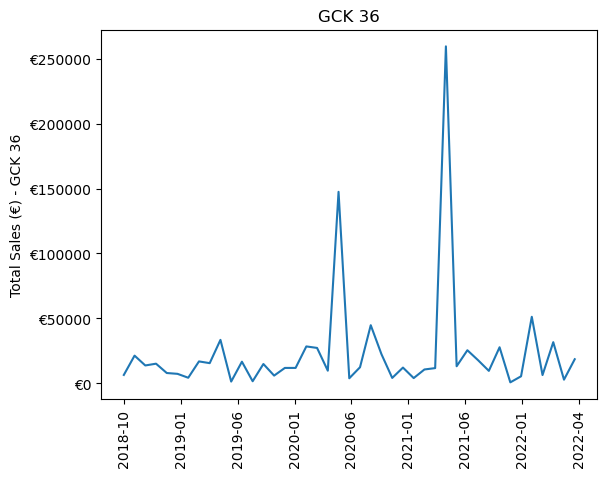

In [116]:
# Create a new plot
fig, ax = plt.subplots()
ax.plot(sales_agg36['DateMY'],sales_agg36['Adjusted Sales (€)'])
ax.grid(False)
    
ax.set_ylabel('Total Sales (€) - GCK 36')  # Set the y-axis label

# Set the y-axis tick label format
y_tick_fmt = FormatStrFormatter('€%.0f')
ax.yaxis.set_major_formatter(y_tick_fmt)
    
# Set the title of the plot 
ax.set_title('GCK 36')
    
# Set the x-axis tick labels to show only the desired values
ax.set_xticks([month_to_index[label] for label in x_tick_labels])
ax.set_xticklabels(x_tick_labels)
    
# Rotate the x-axis tick labels by 90 degrees
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

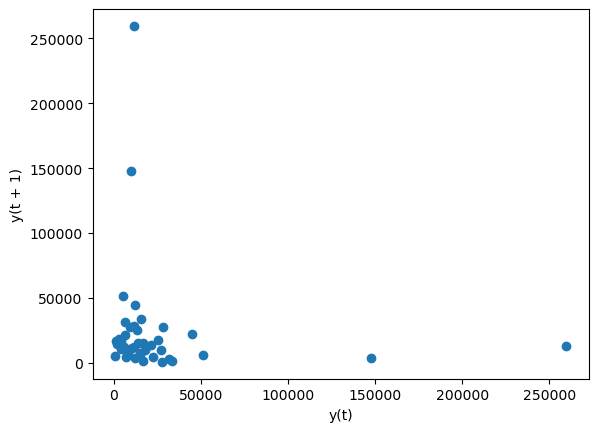

In [117]:
pd.plotting.lag_plot(sales_agg36['Adjusted Sales (€)'],lag=1)

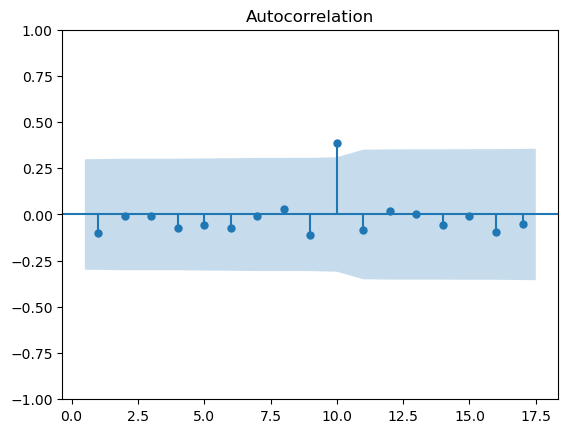

In [118]:
sm.graphics.tsa.plot_acf(sales_agg36['Adjusted Sales (€)'],zero=False);

C:\Users\migue\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


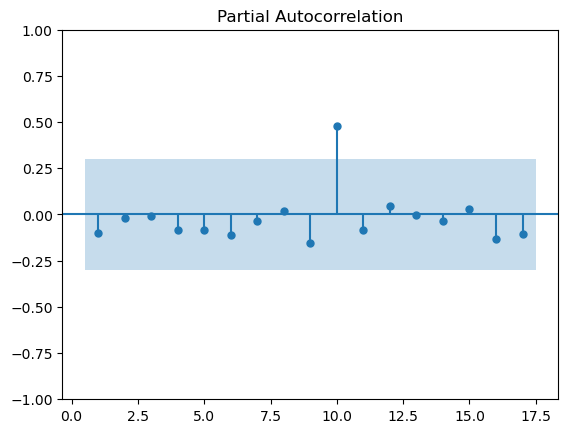

In [119]:
sm.graphics.tsa.plot_pacf(sales_agg36['Adjusted Sales (€)'],zero=False);

In [120]:
# ADF test
result = adfuller(sales_agg36['Adjusted Sales (€)'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.994030484685736
p-value: 7.614896551314959e-10
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


<hr>
<a class="anchor" id="datapreparation">
    
# 3. Data Preparation
    
    
</a>

<a class="anchor" id="missingvalues">
    
## Missing Values
    
    
</a>

In [121]:
# Extracting the indices of the columns that have missing values
indices = [i for i, val in enumerate(market_data_pred.isna().sum()) if val > 0]
print(indices)

[10, 11, 13, 15, 26, 28, 30, 33, 40, 41]


In [122]:
# Create an empty DataFrame with the same index as market_data_pred
data_nan=pd.DataFrame(index=market_data_pred.index)
# For each indece merge the current column with the data_nan DataFrame using the index as the key
for value in indices:
    data_nan=pd.DataFrame(market_data_pred.iloc[:, value]).merge(data_nan, left_index=True, right_index=True)

In [123]:
# Count of % missing values
data_nan=pd.DataFrame(data_nan.isna().sum(),columns=['Count'])
data_nan['Percentage (%)'] = round((data_nan['Count'] / len(market_data_pred))*100, 2)
data_nan

,Count,Percentage (%)
Production Index Electrical equipment Switzerland,1,0.46
Production Index Electrical equipment World,11,5.02
Production Index Machinery and equipment n.e.c. Switzerland,1,0.46
Producer Prices Electrical equipment China,23,10.50
Producer Prices Electrical equipment France,35,15.98
Producer Prices Electrical equipment United Kingdom,18,8.22
Shipments Index Machinery & Electricals United States,1,0.46
Shipments Index Machinery & Electricals United Kingdom,18,8.22
Shipments Index Machinery & Electricals Switzerland,1,0.46
Production Index Machinery & Electricals Switzerland,1,0.46


#### Production Index Machinery & Electricals Switzerland (10)

In [124]:
# create a boolean series indicating where values are missing in the 10th column
missing_values = market_data_pred.iloc[:, 10].isna()
# get the indexes where missing values occur
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2022-04-01'], dtype='datetime64[ns]', freq=None)

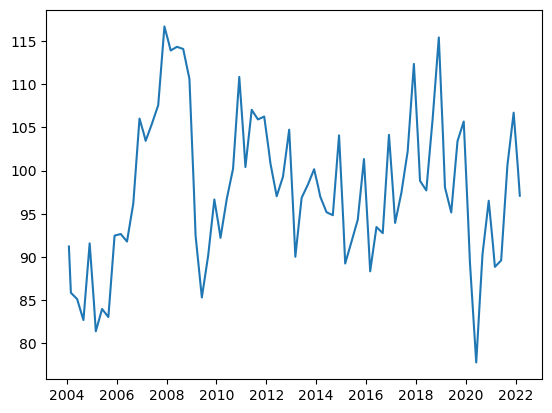

In [125]:
plt.plot(market_data_pred.iloc[:,10])

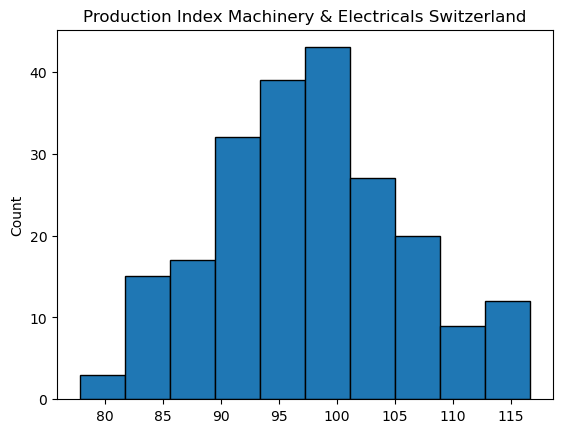

In [126]:
# Create a new plot
fig, ax = plt.subplots()

# Define the series of values
values = market_data_pred.iloc[:,10]

# Calculate the number of bins and the bin size
num_bins = 10
data_range = max(values) - min(values)
bin_size = data_range / num_bins

# Create the histogram using the plt.hist() function
ax.hist(values, bins=np.arange(min(values), max(values) + bin_size, bin_size), edgecolor='black')

# Set the y-axis label
ax.set_ylabel('Count')

# Set the title of the plot
ax.set_title('Production Index Machinery & Electricals Switzerland')

# Display the plot
plt.show()

values_copy=values.copy()
values_copy = values_copy.drop(values_copy.index[1])

Kolmogorov-Smirnov test result: KstestResult(statistic=0.03355294043326207, pvalue=0.9599066031404989)


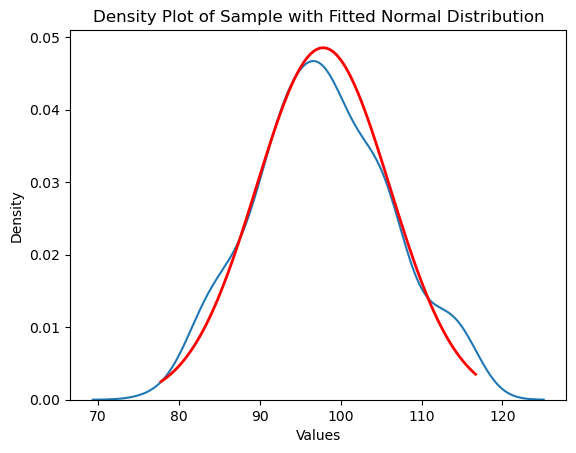

In [127]:
# Define the series of values
values = market_data_pred.iloc[:,10].dropna()

# Generate the density plot
sns.kdeplot(values)

# Estimate the parameters of the normal distribution that best fit the density plot
mu, std = norm.fit(values)

# Calculate the PDF of the normal distribution with the estimated parameters
x = np.linspace(min(values), max(values), 100)
pdf = norm.pdf(x, mu, std)

# Plot the normal distribution
plt.plot(x, pdf, 'r', linewidth=2)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample with Fitted Normal Distribution')

# Perform the Kolmogorov-Smirnov test to assess the fit of the normal distribution
kstest_result = kstest(values, 'norm', args=(mu, std))
print('Kolmogorov-Smirnov test result:', kstest_result)

# Show the plot
plt.show()

In [128]:
# Generate 1 prediction based on the fitted distribution
predictions = norm.rvs(mu,std, size=1)

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 10].name].fillna(pd.Series(index=missing_indexes,data=predictions), inplace=True)

#### Shipments Index Machinery & Electricals Switzerland (11)

In [129]:
# create a boolean series indicating where values are missing in the 11th column
missing_values = market_data_pred.iloc[:, 11].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2022-04-01'], dtype='datetime64[ns]', freq=None)

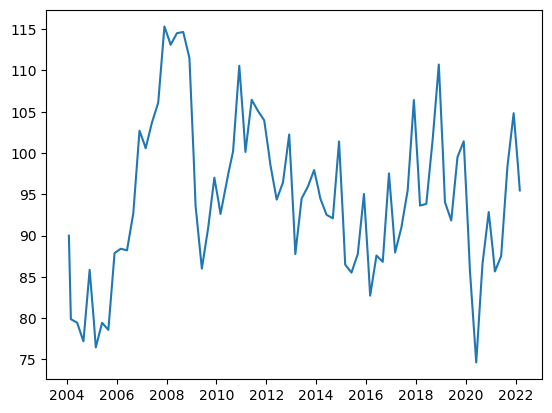

In [130]:
plt.plot(market_data_pred.iloc[:,11])

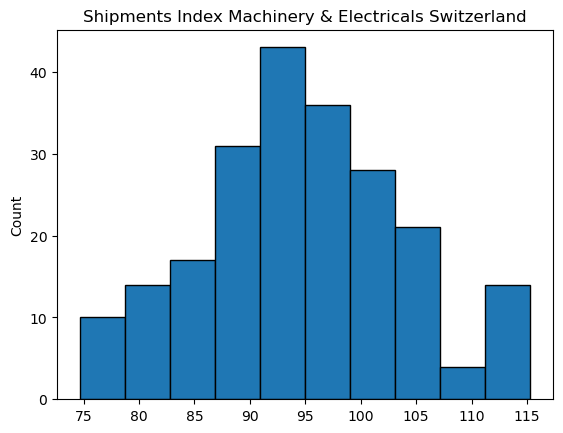

In [131]:
# Create a new plot
fig, ax = plt.subplots()

# Define the series of values
values = market_data_pred.iloc[:,11]

# Calculate the number of bins and the bin size
num_bins = 10
data_range = max(values) - min(values)
bin_size = data_range / num_bins

# Create the histogram using the plt.hist() function
ax.hist(values, bins=np.arange(min(values), max(values) + bin_size, bin_size), edgecolor='black')

# Set the y-axis label
ax.set_ylabel('Count')

# Set the title of the plot
ax.set_title('Shipments Index Machinery & Electricals Switzerland')

# Display the plot
plt.show()

values_copy=values.copy()
values_copy = values_copy.drop(values_copy.index[1])

Kolmogorov-Smirnov test result: KstestResult(statistic=0.03556483427838519, pvalue=0.9363157564843992)


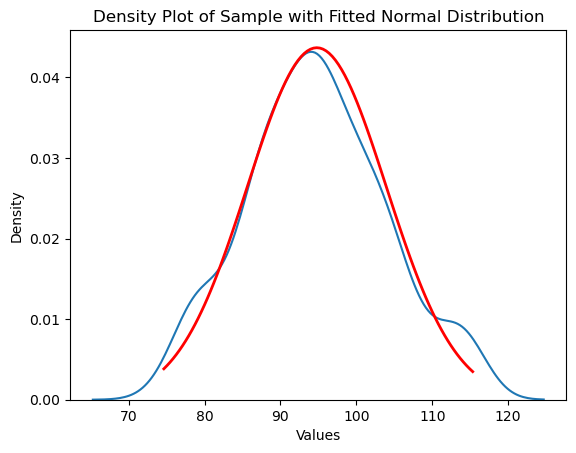

In [132]:
# Define the series of values
values = market_data_pred.iloc[:,11].dropna()

# Generate the density plot
sns.kdeplot(values)

# Estimate the parameters of the normal distribution that best fit the density plot
mu, std = norm.fit(values)

# Calculate the PDF of the normal distribution with the estimated parameters
x = np.linspace(min(values), max(values), 100)
pdf = norm.pdf(x, mu, std)

# Plot the normal distribution
plt.plot(x, pdf, 'r', linewidth=2)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample with Fitted Normal Distribution')

# Perform the Kolmogorov-Smirnov test to assess the fit of the normal distribution
kstest_result = kstest(values, 'norm', args=(mu, std))
print('Kolmogorov-Smirnov test result:', kstest_result)

# Show the plot
plt.show()

In [133]:
# Generate 1 prediction based on the fitted distribution
predictions = norm.rvs(mu,std, size=1)

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 11].name].fillna(pd.Series(index=missing_indexes,data=predictions), inplace=True)

#### Shipments Index Machinery & Electricals United Kingdom (13)

In [134]:
# create a boolean series indicating where values are missing in the 13th column
missing_values = market_data_pred.iloc[:, 13].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2020-11-01', '2020-12-01', '2021-01-01', '2021-02-01',
               '2021-03-01', '2021-04-01', '2021-05-01', '2021-06-01',
               '2021-07-01', '2021-08-01', '2021-09-01', '2021-10-01',
               '2021-11-01', '2021-12-01', '2022-01-01', '2022-02-01',
               '2022-03-01', '2022-04-01'],
              dtype='datetime64[ns]', freq=None)

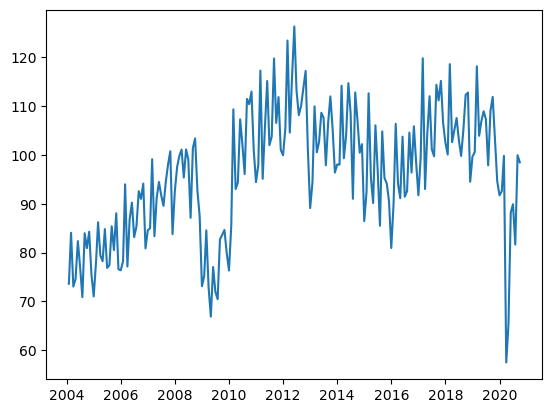

In [135]:
plt.plot(market_data_pred.iloc[:,13])

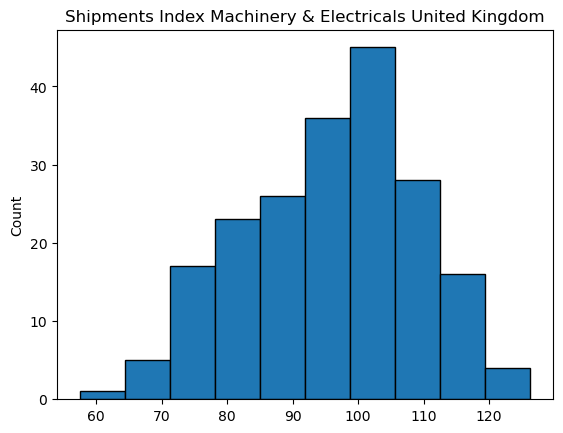

In [136]:
# Create a new plot
fig, ax = plt.subplots()

# Define the series of values
values = market_data_pred.iloc[:,13]

# Calculate the number of bins and the bin size
num_bins = 10
data_range = max(values) - min(values)
bin_size = data_range / num_bins

# Create the histogram using the plt.hist() function
ax.hist(values, bins=np.arange(min(values), max(values) + bin_size, bin_size), edgecolor='black')

# Set the y-axis label
ax.set_ylabel('Count')

# Set the title of the plot
ax.set_title('Shipments Index Machinery & Electricals United Kingdom')

# Display the plot
plt.show()

values_copy=values.copy()
values_copy = values_copy.drop(values_copy.index[1])

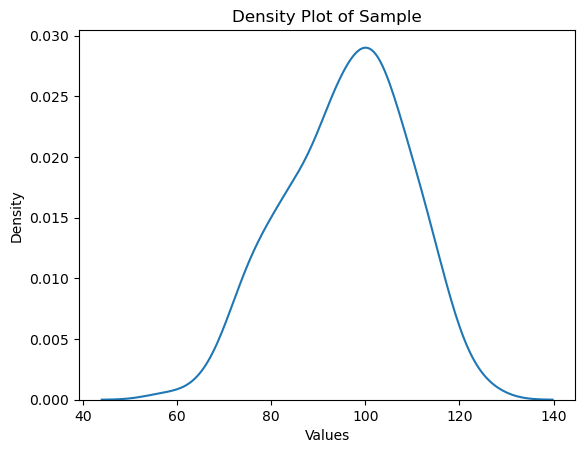

In [137]:
# Define the series of values
values = market_data_pred.iloc[:,13]

# Generate the density plot
sns.kdeplot(values)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample')

# Show the plot
plt.show()

Kolmogorov-Smirnov test result: KstestResult(statistic=0.06133403153157474, pvalue=0.4193607503022948)


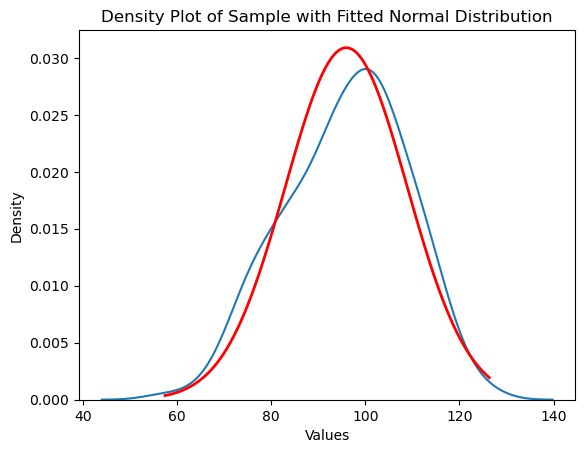

In [138]:
values.dropna(inplace=True)

# Generate the density plot
sns.kdeplot(values)

# Estimate the parameters of the normal distribution that best fit the density plot
mu, std = norm.fit(values)

# Calculate the PDF of the normal distribution with the estimated parameters
x = np.linspace(min(values), max(values), 100)
pdf = norm.pdf(x, mu, std)

# Plot the normal distribution
plt.plot(x, pdf, 'r', linewidth=2)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample with Fitted Normal Distribution')

# Perform the Kolmogorov-Smirnov test to assess the fit of the normal distribution
kstest_result = kstest(values, 'norm', args=(mu, std))
print('Kolmogorov-Smirnov test result:', kstest_result)

# Show the plot
plt.show()

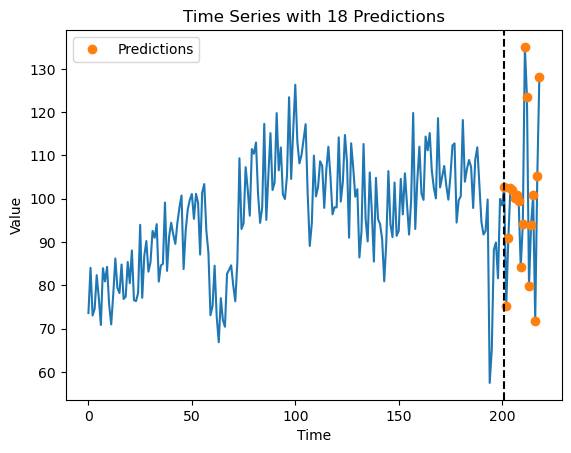

In [139]:
# Generate 18 predictions based on the fitted distribution
predictions = norm.rvs(mu,std, size=18)

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 13].name].fillna(pd.Series(index=missing_indexes,data=predictions), inplace=True)

# Add the predictions as a new series to the original time series
new_series = np.concatenate((values, predictions))

# Plot the original time series and the predictions
plt.plot(new_series)
plt.plot(range(len(values), len(new_series)), predictions, 'o', label='Predictions')

# Add a vertical line to indicate the start of the predictions
plt.axvline(len(values), color='black', linestyle='--')

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Time Series with 18 Predictions')

# Add legend
plt.legend()

# Show the plot
plt.show()

#### Shipments Index Machinery & Electricals United States (15)

In [140]:
# create a boolean series indicating where values are missing in the 15th column
missing_values = market_data_pred.iloc[:, 15].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2022-04-01'], dtype='datetime64[ns]', freq=None)

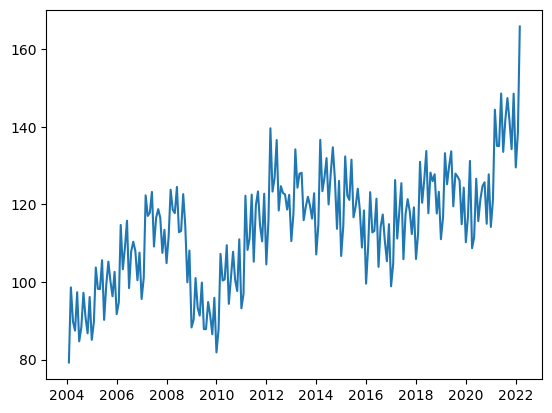

In [141]:
plt.plot(market_data_pred.iloc[:,15])

In [142]:
# Generate 1 prediction
predictions = market_data_pred.iloc[-3:, 15].mean()

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 15].name].fillna(pd.Series(index=missing_indexes,data=predictions), inplace=True)

#### Producer Prices Electrical equipment United Kingdom (26)

In [143]:
# create a boolean series indicating where values are missing in the 26th column
missing_values = market_data_pred.iloc[:, 26].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2020-11-01', '2020-12-01', '2021-01-01', '2021-02-01',
               '2021-03-01', '2021-04-01', '2021-05-01', '2021-06-01',
               '2021-07-01', '2021-08-01', '2021-09-01', '2021-10-01',
               '2021-11-01', '2021-12-01', '2022-01-01', '2022-02-01',
               '2022-03-01', '2022-04-01'],
              dtype='datetime64[ns]', freq=None)

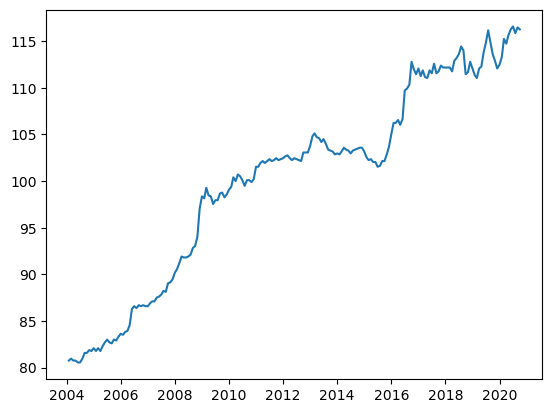

In [144]:
plt.plot(market_data_pred.iloc[:,26])

In [145]:
fs_26=pd.DataFrame(market_data_pred.loc[:'2020-10-01','Producer Prices Electrical equipment United Kingdom ']).reset_index(
        ).rename(columns={'index':'ds','Producer Prices Electrical equipment United Kingdom ':'y'})
fs_26.head()

,ds,y
0,2004-02-01,80.757423
1,2004-03-01,80.962135
2,2004-04-01,80.757423
3,2004-05-01,80.757423
4,2004-06-01,80.552711


In [146]:
prophet_f26=Prophet()
prophet_f26.fit(fs_26)

17:12:53 - cmdstanpy - INFO - Chain [1] start processing
17:12:54 - cmdstanpy - INFO - Chain [1] done processing


In [147]:
future = prophet_f26.make_future_dataframe(periods=18,freq='m')
forecast = prophet_f26.predict(future)

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 26].name].fillna(pd.Series(index=missing_indexes,data=forecast['yhat'][-18:].values), inplace=True)

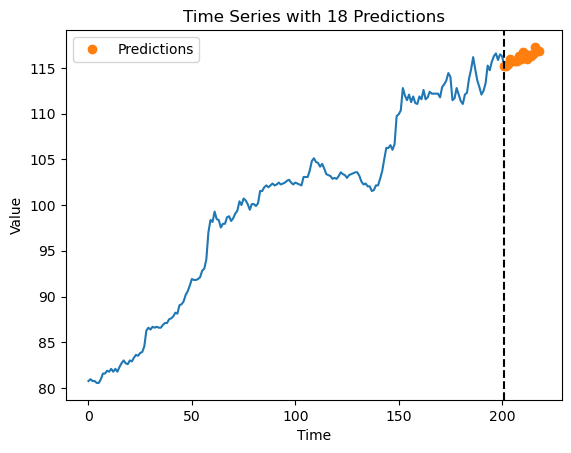

In [148]:
# Add the predictions as a new series to the original time series
new_series = np.concatenate((fs_26['y'],forecast['yhat'][-18:]))

# Plot the original time series and the predictions
plt.plot(new_series)
plt.plot(range(len(new_series) - 18, len(new_series)), forecast['yhat'][-18:], 'o', label='Predictions')

# Add a vertical line to indicate the start of the predictions
plt.axvline(len(values), color='black', linestyle='--')

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Time Series with 18 Predictions')

# Add legend
plt.legend()

# Show the plot
plt.show()

#### Producer Prices Electrical equipment France (28)

In [149]:
# Indices missing are from early years and for the approach below they will not be needed
missing_values = market_data_pred.iloc[:, 28].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2004-02-01', '2004-03-01', '2004-04-01', '2004-05-01',
               '2004-06-01', '2004-07-01', '2004-08-01', '2004-09-01',
               '2004-10-01', '2004-11-01', '2004-12-01', '2005-01-01',
               '2005-02-01', '2005-03-01', '2005-04-01', '2005-05-01',
               '2005-06-01', '2005-07-01', '2005-08-01', '2005-09-01',
               '2005-10-01', '2005-11-01', '2005-12-01', '2006-01-01',
               '2006-02-01', '2006-03-01', '2006-04-01', '2006-05-01',
               '2006-06-01', '2006-07-01', '2006-08-01', '2006-09-01',
               '2006-10-01', '2006-11-01', '2006-12-01'],
              dtype='datetime64[ns]', freq=None)

#### Producer Prices Electrical equipment China (30)

In [150]:
# Indices missing are from early years and for the approach below they will not be needed
missing_values = market_data_pred.iloc[:, 30].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2004-02-01', '2004-03-01', '2004-04-01', '2004-05-01',
               '2004-06-01', '2004-07-01', '2004-08-01', '2004-09-01',
               '2004-10-01', '2004-11-01', '2004-12-01', '2005-01-01',
               '2005-02-01', '2005-03-01', '2005-04-01', '2005-05-01',
               '2005-06-01', '2005-07-01', '2005-08-01', '2005-09-01',
               '2005-10-01', '2005-11-01', '2005-12-01'],
              dtype='datetime64[ns]', freq=None)

#### Production Index Machinery and equipment n.e.c. Switzerland (33)

In [151]:
missing_values = market_data_pred.iloc[:, 33].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2022-04-01'], dtype='datetime64[ns]', freq=None)

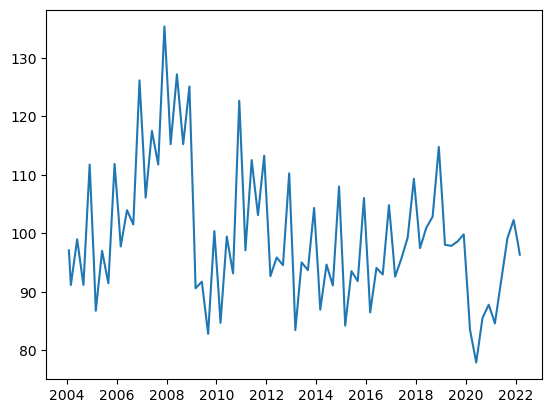

In [152]:
plt.plot(market_data_pred.iloc[:,33])

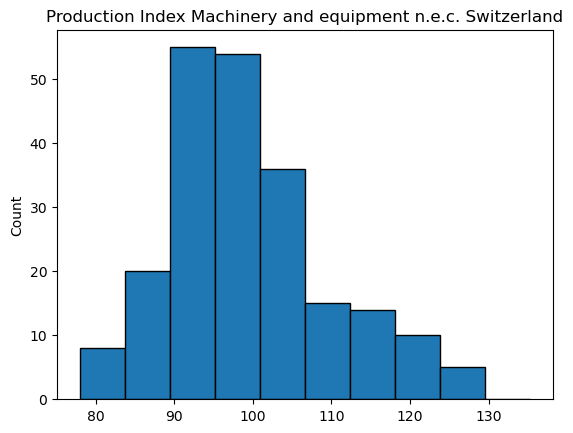

In [153]:
# Create a new plot
fig, ax = plt.subplots()

# Define the series of values
values = market_data_pred.iloc[:,33]

# Calculate the number of bins and the bin size
num_bins = 10
data_range = max(values) - min(values)
bin_size = data_range / num_bins

# Create the histogram using the plt.hist() function
ax.hist(values, bins=np.arange(min(values), max(values) + bin_size, bin_size), edgecolor='black')

# Set the y-axis label
ax.set_ylabel('Count')

# Set the title of the plot
ax.set_title('Production Index Machinery and equipment n.e.c. Switzerland')

# Display the plot
plt.show()

values_copy=values.copy()
values_copy = values_copy.drop(values_copy.index[1])

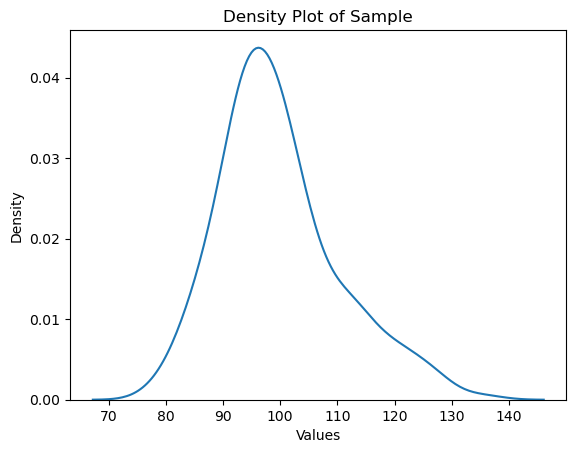

In [154]:
# Define the series of values
values = market_data_pred.iloc[:,33]

# Generate the density plot
sns.kdeplot(values)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample')

# Show the plot
plt.show()

Kolmogorov-Smirnov test result: KstestResult(statistic=0.09346776565773329, pvalue=0.041509762014879326)


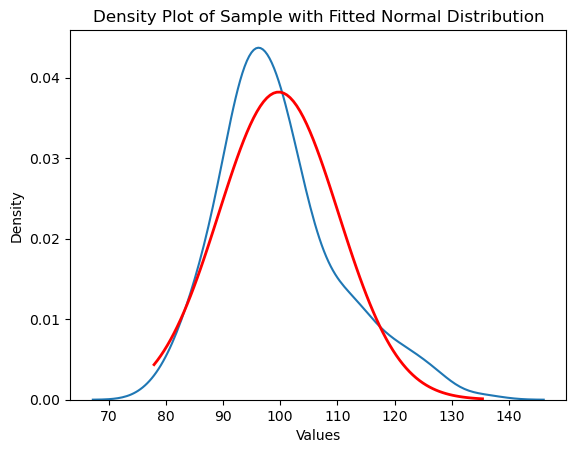

In [155]:
values.dropna(inplace=True)

# Generate the density plot
sns.kdeplot(values)

# Estimate the parameters of the normal distribution that best fit the density plot
mu, std = norm.fit(values)

# Calculate the PDF of the normal distribution with the estimated parameters
x = np.linspace(min(values), max(values), 100)
pdf = norm.pdf(x, mu, std)

# Plot the normal distribution
plt.plot(x, pdf, 'r', linewidth=2)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample with Fitted Normal Distribution')

# Perform the Kolmogorov-Smirnov test to assess the fit of the normal distribution
kstest_result = kstest(values, 'norm', args=(mu, std))
print('Kolmogorov-Smirnov test result:', kstest_result)

# Show the plot
plt.show()

In [156]:
# Generate 1 prediction
predictions = market_data_pred.iloc[:, 33].mean()

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 33].name].fillna(pd.Series(index=missing_indexes,data=predictions), inplace=True)

#### Production Index Electrical equipment World (40)

In [157]:
# Indices missing are from early years and for the approach below they will not be needed
missing_values = market_data_pred.iloc[:, 40].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2004-02-01', '2004-03-01', '2004-04-01', '2004-05-01',
               '2004-06-01', '2004-07-01', '2004-08-01', '2004-09-01',
               '2004-10-01', '2004-11-01', '2004-12-01'],
              dtype='datetime64[ns]', freq=None)

#### Production Index Electrical equipment Switzerland (41)

In [158]:
# create a boolean series indicating where values are missing in the 41th column
missing_values = market_data_pred.iloc[:, 41].isna()
# For each indece merge the current column with the data_nan DataFrame using the index as the key
missing_indexes = missing_values.loc[missing_values == True].index
missing_indexes

DatetimeIndex(['2022-04-01'], dtype='datetime64[ns]', freq=None)

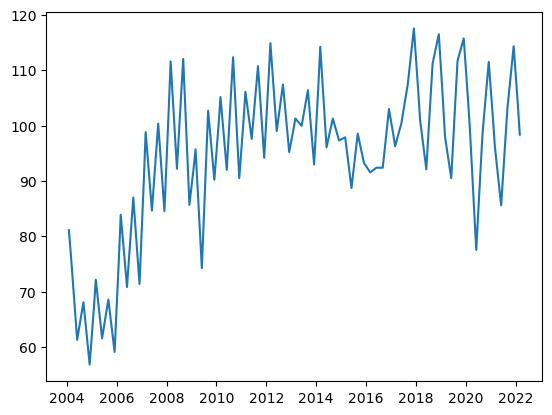

In [159]:
plt.plot(market_data_pred.iloc[:,41])

In [160]:
# Generate 1 prediction
predictions = market_data_pred.iloc[-3:, 41].mean()

# Fill missing values
market_data_pred[market_data_pred.iloc[:, 41].name].fillna(pd.Series(index=missing_indexes,data=predictions), inplace=True)

<a class="anchor" id="featurecreation">
    
## Feature Creation
    
    
</a>

In [161]:
def count_weekend_days(year, month):
    """ This function counts the number of days that fall on a Saturday or a Sunday and returns the total count"""
    num_saturdays = 0
    num_sundays = 0

    # Get the number of days in the given month and year
    num_days = calendar.monthrange(year, month)[1]

    # Loop through each day in the month and count the number of Saturdays and Sundays
    for day in range(1, num_days+1):
        weekday = calendar.weekday(year, month, day)
        if weekday == 5:
            num_saturdays += 1
        elif weekday == 6:
            num_sundays += 1

    return num_saturdays+num_sundays

In [162]:
# Assume `market_data_pred` is a DataFrame with Timestamp index
market_data_pred.reset_index()['index'].values

array(['2004-02-01T00:00:00.000000000', '2004-03-01T00:00:00.000000000',
       '2004-04-01T00:00:00.000000000', '2004-05-01T00:00:00.000000000',
       '2004-06-01T00:00:00.000000000', '2004-07-01T00:00:00.000000000',
       '2004-08-01T00:00:00.000000000', '2004-09-01T00:00:00.000000000',
       '2004-10-01T00:00:00.000000000', '2004-11-01T00:00:00.000000000',
       '2004-12-01T00:00:00.000000000', '2005-01-01T00:00:00.000000000',
       '2005-02-01T00:00:00.000000000', '2005-03-01T00:00:00.000000000',
       '2005-04-01T00:00:00.000000000', '2005-05-01T00:00:00.000000000',
       '2005-06-01T00:00:00.000000000', '2005-07-01T00:00:00.000000000',
       '2005-08-01T00:00:00.000000000', '2005-09-01T00:00:00.000000000',
       '2005-10-01T00:00:00.000000000', '2005-11-01T00:00:00.000000000',
       '2005-12-01T00:00:00.000000000', '2006-01-01T00:00:00.000000000',
       '2006-02-01T00:00:00.000000000', '2006-03-01T00:00:00.000000000',
       '2006-04-01T00:00:00.000000000', '2006-05-01

In [163]:
start_date = datetime.date(2018, 10, 1) # October 2018
end_date = datetime.date(2023, 2, 1) # February 2023
date_list = []

# Loop through each month between the start_date and end_date inclusive, adding the year and month to date_list in the format "YYYY-MM"
while start_date <= end_date:
    date_list.append(start_date.strftime("%Y-%m"))
    start_date = start_date + datetime.timedelta(days=31)

print(date_list)

['2018-10', '2018-11', '2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12', '2020-01', '2020-02', '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12', '2021-01', '2021-02', '2021-03', '2021-04', '2021-05', '2021-06', '2021-07', '2021-08', '2021-09', '2021-10', '2021-11', '2021-12', '2022-01', '2022-02', '2022-03', '2022-04', '2022-05', '2022-06', '2022-07', '2022-08', '2022-09', '2022-10', '2022-11', '2022-12', '2023-01']


In [164]:
weekend_days=[]
# Iterate through each date in the date_list
for date in date_list:
    # Call the function count_weekend_days to determine the number of weekend days in the current month
    value=count_weekend_days(int(date[:4]),int(date[5:]))
    # Append the number of weekend days to the weekend_days list
    weekend_days.append(value)

In [165]:
# https://www.timeanddate.com/holidays/germany/2018?hol=9
# Here, only official holidays were considered
official_holidays=[1,0,2,1,0,0,2,2,1,0,0,0,1,0,2,1,0,0,2,2,1,0,0,1,0,2,1,0,0,2,3,0,0,0,0,1,0,2,1,0,0,2,2,1,0,0,0,1,0,2,1,0]

In [166]:
# Finding the non-working days. It will be added before applying the XGBoost as it does not make sense to find the best lag
#(it should be one) and it cannot be added directly to the market_data_pred as there is no need for values since 2004

# iterate through the lists and sum each element
nowork_days=[]
for i in range(len(weekend_days)):
    nowork_days.append(weekend_days[i] + official_holidays[i])

len(nowork_days)

52

<a class="anchor" id="selection&outlier">
    
## Feature Selection and Outlier Detection
    
    
</a>

In [167]:
# Using the dataset 'market_data_pred' to create a market_data dataset for each Lag (from 1 to 12)

# Lag 1
start_date1=pd.to_datetime('2018-09-01')
end_date1=pd.to_datetime('2022-03-01')
market_data_lag1=market_data_pred[start_date1:end_date1].reset_index(drop=True)

# Lag 2
start_date2=pd.to_datetime('2018-08-01')
end_date2=pd.to_datetime('2022-02-01')
market_data_lag2=market_data_pred[start_date2:end_date2].reset_index(drop=True)

# Lag 3
start_date3=pd.to_datetime('2018-07-01')
end_date3=pd.to_datetime('2022-01-01')
market_data_lag3=market_data_pred[start_date3:end_date3].reset_index(drop=True)

# Lag 4
start_date4=pd.to_datetime('2018-06-01')
end_date4=pd.to_datetime('2021-12-01')
market_data_lag4=market_data_pred[start_date4:end_date4].reset_index(drop=True)

# Lag 5
start_date5=pd.to_datetime('2018-05-01')
end_date5=pd.to_datetime('2021-11-01')
market_data_lag5=market_data_pred[start_date5:end_date5].reset_index(drop=True)

# Lag 6
start_date6=pd.to_datetime('2018-04-01')
end_date6=pd.to_datetime('2021-10-01')
market_data_lag6=market_data_pred[start_date6:end_date6].reset_index(drop=True)

# Lag 7
start_date7=pd.to_datetime('2018-03-01')
end_date7=pd.to_datetime('2021-09-01')
market_data_lag7=market_data_pred[start_date7:end_date7].reset_index(drop=True)

# Lag 8
start_date8=pd.to_datetime('2018-02-01')
end_date8=pd.to_datetime('2021-08-01')
market_data_lag8=market_data_pred[start_date8:end_date8].reset_index(drop=True)

# Lag 9
start_date9=pd.to_datetime('2018-01-01')
end_date9=pd.to_datetime('2021-07-01')
market_data_lag9=market_data_pred[start_date9:end_date9].reset_index(drop=True)

# Lag 10
start_date10=pd.to_datetime('2017-12-01')
end_date10=pd.to_datetime('2021-06-01')
market_data_lag10=market_data_pred[start_date10:end_date10].reset_index(drop=True)

# Lag 11
start_date11=pd.to_datetime('2017-11-01')
end_date11=pd.to_datetime('2021-05-01')
market_data_lag11=market_data_pred[start_date11:end_date11].reset_index(drop=True)

# Lag 12
start_date12=pd.to_datetime('2017-10-01')
end_date12=pd.to_datetime('2021-04-01')
market_data_lag12=market_data_pred[start_date12:end_date12].reset_index(drop=True)

In [168]:
def find_lag(GCK):
    """ This function finds the most important Lag of each macroeconomic index for a given product group. """
    
    sales=sales_agg1
    
    if GCK==3:                 
        sales=sales_agg3       # Product Group 3
    elif GCK==4:               
        sales=sales_agg4       # Product Group 4
    elif GCK==5:               
        sales=sales_agg5       # Product Group 5
    elif GCK==6:               
        sales=sales_agg6       # Product Group 6
    elif GCK==8:               
        sales=sales_agg8       # Product Group 8
    elif GCK==9:               
        sales=sales_agg9       # Product Group 9
    elif GCK==11:              
        sales=sales_agg11      # Product Group 11 
    elif GCK==12:              
        sales=sales_agg12      # Product Group 12 
    elif GCK==13:              
        sales=sales_agg13      # Product Group 13
    elif GCK==14:              
        sales=sales_agg14      # Product Group 14
    elif GCK==16:              
        sales=sales_agg16      # Product Group 16
    elif GCK==20:              
        sales=sales_agg20      # Product Group 20
    elif GCK==36:              
        sales=sales_agg36      # Product Group 36

        
    most_important=[] # list that stores the most important Lag for each macroeconomic index
    
    for feature in market_data_pred.columns:
        # Lag 1
        ds_lag1=market_data_lag1.loc[:,[feature]]
        ds_lag1.rename(columns={feature:feature+' LAG1'}, inplace=True)
        # Lag 2
        ds_lag2=market_data_lag2.loc[:,[feature]]
        ds_lag2.rename(columns={feature:feature+' LAG2'}, inplace=True)
        # Lag 3
        ds_lag3=market_data_lag3.loc[:,[feature]]
        ds_lag3.rename(columns={feature:feature+' LAG3'}, inplace=True)
        # Lag 4
        ds_lag4=market_data_lag4.loc[:,[feature]]
        ds_lag4.rename(columns={feature:feature+' LAG4'}, inplace=True)
        # Lag 5
        ds_lag5=market_data_lag5.loc[:,[feature]]
        ds_lag5.rename(columns={feature:feature+' LAG5'}, inplace=True)
        # Lag 6
        ds_lag6=market_data_lag6.loc[:,[feature]]
        ds_lag6.rename(columns={feature:feature+' LAG6'}, inplace=True)
        # Lag 7
        ds_lag7=market_data_lag7.loc[:,[feature]]
        ds_lag7.rename(columns={feature:feature+' LAG7'}, inplace=True)
        # Lag 8
        ds_lag8=market_data_lag8.loc[:,[feature]]
        ds_lag8.rename(columns={feature:feature+' LAG8'}, inplace=True)
        # Lag 9
        ds_lag9=market_data_lag9.loc[:,[feature]]
        ds_lag9.rename(columns={feature:feature+' LAG9'}, inplace=True)
        # Lag 10
        ds_lag10=market_data_lag10.loc[:,[feature]]
        ds_lag10.rename(columns={feature:feature+' LAG10'}, inplace=True)
        # Lag 11
        ds_lag11=market_data_lag11.loc[:,[feature]]
        ds_lag11.rename(columns={feature:feature+' LAG11'}, inplace=True)
        # Lag 12
        ds_lag12=market_data_lag12.loc[:,[feature]]
        ds_lag12.rename(columns={feature:feature+' LAG12'}, inplace=True)
        
        ds_lags=pd.concat([ds_lag1, ds_lag2, ds_lag3, ds_lag4, ds_lag5, ds_lag6, ds_lag7, ds_lag8, ds_lag9, ds_lag10,
                           ds_lag11, ds_lag12, sales['Adjusted Sales (€)']], axis=1)
        
        # Spearman Correlation Matrix
        cor_spearman=ds_lags.corr(method='spearman')
        cor_spearman=cor_spearman.mask(np.triu(np.ones(cor_spearman.shape)).astype(bool))
        # Appending the most important Lag for each feature in a list
        most_important.append(abs(cor_spearman.loc['Adjusted Sales (€)',:]).idxmax())
    return most_important

In [169]:
def create_ds_lag(GCK):
    """ This function creates a dataset with the most important Lags for each index for a given product group. """
    
    sales=sales_agg1
    lags_list=find_lag(1)
    
    if GCK==3:                 
        sales=sales_agg3       # Product Group 3
        lags_list=find_lag(3)
    elif GCK==4:               
        sales=sales_agg4       # Product Group 4
        lags_list=find_lag(4)
    elif GCK==5:               
        sales=sales_agg5       # Product Group 5
        lags_list=find_lag(5)
    elif GCK==6:               
        sales=sales_agg6       # Product Group 6
        lags_list=find_lag(6)
    elif GCK==8:               
        sales=sales_agg8       # Product Group 8
        lags_list=find_lag(8)
    elif GCK==9:               
        sales=sales_agg9       # Product Group 9
        lags_list=find_lag(9)
    elif GCK==11:              
        sales=sales_agg11      # Product Group 11
        lags_list=find_lag(11)
    elif GCK==12:              
        sales=sales_agg12      # Product Group 12
        lags_list=find_lag(12)
    elif GCK==13:              
        sales=sales_agg13      # Product Group 13
        lags_list=find_lag(13)
    elif GCK==14:              
        sales=sales_agg14      # Product Group 14
        lags_list=find_lag(14)
    elif GCK==16:              
        sales=sales_agg16      # Product Group 16
        lags_list=find_lag(16)
    elif GCK==20:              
        sales=sales_agg20      # Product Group 20
        lags_list=find_lag(20)
    elif GCK==36:              
        sales=sales_agg36      # Product Group 36
        lags_list=find_lag(36)
    
    if re.findall(r'\d+', lags_list[0])[-1]=='1':
        data_agg=market_data_lag1.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='2':
        data_agg=market_data_lag2.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='3':
        data_agg=market_data_lag3.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='4':
        data_agg=market_data_lag4.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='5':
        data_agg=market_data_lag5.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='6':
        data_agg=market_data_lag6.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='7':
        data_agg=market_data_lag7.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='8':
        data_agg=market_data_lag8.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='9':
        data_agg=market_data_lag9.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='10':
        data_agg=market_data_lag10.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='11':
        data_agg=market_data_lag11.iloc[:,[0]]
    elif re.findall(r'\d+',lags_list[0])[-1]=='12':
        data_agg=market_data_lag12.iloc[:,[0]]
 
    
    for i in range(1,len(lags_list)):
        if re.findall(r'\d+',lags_list[i])[-1]=='1':
            data_agg=pd.concat([data_agg, market_data_lag1.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='2':
            data_agg=pd.concat([data_agg, market_data_lag2.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='3':
            data_agg=pd.concat([data_agg, market_data_lag3.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='4':
            data_agg=pd.concat([data_agg, market_data_lag4.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='5':
            data_agg=pd.concat([data_agg, market_data_lag5.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='6':
            data_agg=pd.concat([data_agg, market_data_lag6.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='7':
            data_agg=pd.concat([data_agg, market_data_lag7.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='8':
            data_agg=pd.concat([data_agg, market_data_lag8.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='9':
            data_agg=pd.concat([data_agg, market_data_lag9.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='10':
            data_agg=pd.concat([data_agg, market_data_lag10.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='11':
            data_agg=pd.concat([data_agg, market_data_lag11.iloc[:,[i]]], axis=1)
        elif re.findall(r'\d+',lags_list[i])[-1]=='12':
            data_agg=pd.concat([data_agg, market_data_lag12.iloc[:,[i]]], axis=1)
    
    data_agg=pd.concat([data_agg, sales['Adjusted Sales (€)']], axis=1)
    
    # Set start and end dates
    start_date = pd.to_datetime('2018-10-01')
    end_date = pd.to_datetime('2022-04-01')

    # Create DatetimeIndex with monthly frequency
    date_index = pd.date_range(start=start_date, end=end_date, freq='MS')
    
    data_agg.set_index(date_index,inplace=True,drop=True)
    return data_agg

In [170]:
def high_corr(GCK,threshold):
    """Finds the features that have a correlation higher than the threshold value and removes the one less correlated 
    with the target"""
    high_corr_features=[]
    if GCK==1:                 
        high_corr=high_corr1   # Product Group 1
        corr=corr1
    if GCK==3:                 
        high_corr=high_corr3   # Product Group 3
        corr=corr3
    elif GCK==4:               
        high_corr=high_corr4   # Product Group 4
        corr=corr4
    elif GCK==5:               
        high_corr=high_corr5   # Product Group 5
        corr=corr5
    elif GCK==6:               
        high_corr=high_corr6   # Product Group 6
        corr=corr6
    elif GCK==8:              
        high_corr=high_corr8   # Product Group 8
        corr=corr8
    elif GCK==9:               
        high_corr=high_corr9   # Product Group 9
        corr=corr9
    elif GCK==11:              
        high_corr=high_corr11  # Product Group 11
        corr=corr11
    elif GCK==12:              
        high_corr=high_corr12  # Product Group 12
        corr=corr12
    elif GCK==13:              
        high_corr=high_corr13  # Product Group 13
        corr=corr13
    elif GCK==14:              
        high_corr=high_corr14  # Product Group 14
        corr=corr14
    elif GCK==16:              
        high_corr=high_corr16  # Product Group 16
        corr=corr16
    elif GCK==20:              
        high_corr=high_corr20  # Product Group 20
        corr=corr20
    elif GCK==36:              
        high_corr=high_corr36  # Product Group 36
        corr=corr36
    for i in range(high_corr.shape[0]):
        value=high_corr.iloc[i,2]
        if value >=threshold:
            exog_1=high_corr.iloc[i,0]
            exog_2=high_corr.iloc[i,1]
            if abs(corr.loc['Adjusted Sales (€)',exog_1])>=abs(corr.loc['Adjusted Sales (€)',exog_2]):
                high_corr_features.append(exog_2)
            else:
                high_corr_features.append(exog_1)
        else:
            break
    return high_corr_features

In [171]:
def xg_importance(GCK,threshold):
    """ The function then returns the index of the filtered importance data 
    i.e., the features that have an importance score greater than the threshold"""
    
    if GCK==1:                 
        importance=importance_1   # Product Group 1
    if GCK==3:                 
        importance=importance_3   # Product Group 3
    elif GCK==4:              
        importance=importance_4   # Product Group 4
    elif GCK==5:               
        importance=importance_5   # Product Group 5
    elif GCK==6:               
        importance=importance_6   # Product Group 6
    elif GCK==8:              
        importance=importance_8   # Product Group 8
    elif GCK==9:               
        importance=importance_9   # Product Group 9
    elif GCK==11:              
        importance=importance_11  # Product Group 11
    elif GCK==12:              
        importance=importance_12  # Product Group 12
    elif GCK==13:              
        importance=importance_13  # Product Group 13
    elif GCK==14:              
        importance=importance_14  # Product Group 14
    elif GCK==16:              
        importance=importance_16  # Product Group 16
    elif GCK==20:              
        importance=importance_20  # Product Group 20
    elif GCK==36:              
        importance=importance_36  # Product Group 36
    return importance.index[importance[0]>threshold]  

<a class="anchor" id="sgck1">
    
### Product Group 1
    
</a>

For the feature selection, first the lag with the highest correlation with sales will be found for each variable. Then, the variables that have a lower than 1% correlation with sales will be removed. Afterwards, for the variables that have a correlation higher than 99% between each other, one of them will be removed (the one with the least correlation with the target). Finally, XGBoost will be applied and the variables with a value of feature importance higher than 0.05 will be kept. The maximum lag for the sales feature will be determined by experimentation considering the results obtained for each and by maintaining the most information.

### Finding the most important Lags

In [172]:
find_lag(1)

['Production Index Machinery & Electricals China LAG4',
 'Shipments Index Machinery & Electricals China LAG4',
 'Production Index Machinery & Electricals France LAG8',
 'Shipments Index Machinery & Electricals France LAG10',
 'Production Index Machinery & Electricals Germany LAG2',
 'Shipments Index Machinery & Electricals Germany LAG10',
 'Production Index Machinery & Electricals Italy LAG8',
 'Shipments Index Machinery & Electricals Italy LAG10',
 'Production Index Machinery & Electricals Japan LAG1',
 'Shipments Index Machinery & Electricals Japan LAG7',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG1',
 'Shipments Index Machinery & Electricals United Kingdom LAG8',
 'Production Index Machinery & Electricals United States LAG1',
 'Shipments Index Machinery & Electricals United States LAG1',
 'Production Index Machinery & Electricals Europe LAG1'

In [173]:
# Creating a new dataset 'data_agg1' which contains the macroeconomic indices and the sales of product group 1
data_agg1=create_ds_lag(1)
data_agg1.head()

,Production Index Machinery & Electricals China,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,...,Production Index Electrical equipment United States,Production Index Electrical equipment World,Production Index Electrical equipment Switzerland,Production Index Electrical equipment United Kingdom,Production Index Electrical equipment Italy,Production Index Electrical equipment Japan,Production Index Electrical equipment France,Production Index Electrical equipment Germany,GDP Germany,Adjusted Sales (€)
2018-10-01,244.152261,244.152261,91.596398,118.413678,114.674497,151.297092,103.265897,131.603833,127.830484,158.512428,...,111.160194,126.344688,104.838455,110.288394,87.923195,114.521361,82.260551,110.872368,274506.666667,3.577403e+07
2018-11-01,207.834743,207.834743,111.966269,103.810715,118.552573,116.719756,116.111336,86.417990,125.209957,114.877796,...,112.853256,129.325775,111.205674,118.670791,66.624557,112.376774,94.678894,118.298233,274506.666667,5.063649e+06
2018-12-01,197.528665,197.528665,92.235176,104.590757,124.227879,119.492100,101.239742,100.509533,122.624695,114.220665,...,113.145294,128.236176,112.970843,120.467019,79.130875,111.907535,83.933945,117.163727,274506.666667,3.732127e+07
2019-01-01,199.419203,199.419203,88.478162,121.718461,127.404132,141.751327,118.220678,120.224693,122.991956,128.141594,...,111.823624,117.043549,114.736013,105.378705,82.541687,112.524242,81.820183,89.626122,277850.000000,2.709040e+07
2019-02-01,211.955755,211.955755,109.749147,106.608329,120.518565,126.376490,115.249735,102.883953,105.514024,123.892980,...,109.499725,111.522202,116.501182,107.174933,88.605354,95.957352,95.119263,105.406097,277850.000000,3.413209e+07


### Correlation with Sales

In [174]:
# Spearman Correlation

# Calculate the Spearman's rank correlation coefficients between all pairs of columns in data_agg1
cor_spearman1=data_agg1.corr(method='spearman')
# Mask the upper triangle of the correlation matrix to obtain only the lower triangle
corr1=cor_spearman1.mask(np.triu(np.ones(cor_spearman1.shape)).astype(bool))
corr1

,Production Index Machinery & Electricals China,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,...,Production Index Electrical equipment United States,Production Index Electrical equipment World,Production Index Electrical equipment Switzerland,Production Index Electrical equipment United Kingdom,Production Index Electrical equipment Italy,Production Index Electrical equipment Japan,Production Index Electrical equipment France,Production Index Electrical equipment Germany,GDP Germany,Adjusted Sales (€)
Production Index Machinery & Electricals China,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Shipments Index Machinery & Electricals China,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Production Index Machinery & Electricals France,-0.465320,-0.465320,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Shipments Index Machinery & Electricals France,0.332943,0.332943,-0.448354,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Production Index Machinery & Electricals Germany,-0.450897,-0.450897,0.279976,-0.025068,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Shipments Index Machinery & Electricals Germany,0.076345,0.076345,-0.280731,0.721534,-0.002869,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Production Index Machinery & Electricals Italy,-0.356353,-0.356353,0.743582,-0.274992,0.251133,-0.027182,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Shipments Index Machinery & Electricals Italy,0.311422,0.311422,-0.300362,0.726367,-0.145877,0.719722,-0.112504,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Production Index Machinery & Electricals Japan,0.362243,0.362243,-0.331169,0.413621,0.093476,0.228783,-0.080791,0.332075,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Shipments Index Machinery & Electricals Japan,0.153143,0.153143,-0.038659,0.525974,0.141800,0.642404,0.212625,0.524464,0.455452,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [175]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr1.loc['Adjusted Sales (€)',:][abs(corr1.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [176]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr1.loc['Adjusted Sales (€)',:][abs(corr1.loc['Adjusted Sales (€)',:])>0.8]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [177]:
# Checking the macroeconomic indices that have a low Spearman correlation between them

# Create a new DataFrame with the correlations less than 0.05
low_corr1=pd.DataFrame(corr1.drop('Adjusted Sales (€)').stack()[abs(corr1.stack()) < 0.05]).reset_index()
low_corr1.columns=['Index1', 'Index2', 'Correlation']
low_corr1

,Index1,Index2,Correlation
0,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals France,-0.025068
1,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Germany,-0.002869
2,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Germany,-0.027182
3,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals France,-0.038659
4,Production Index Machinery & Electricals Switz...,Production Index Machinery & Electricals France,0.022350
...,...,...,...
113,GDP Germany,Price of Base Metals World,0.044492
114,GDP Germany,Price of Energy World,0.001816
115,GDP Germany,"Price of Crude oil, average World",0.004086
116,GDP Germany,Production Index Machinery and equipment n.e.c...,-0.009080


In [178]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
high_corr1=pd.DataFrame(corr1.drop('Adjusted Sales (€)').stack()[abs(corr1.stack()) > 0.85]).reset_index()
high_corr1.columns=['Index1', 'Index2', 'Correlation']
high_corr1=high_corr1.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr1

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.989580
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.987087
4,"Price of Crude oil, average World",Price of Energy World,0.986258
5,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.980670
6,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals France,0.980328
7,Price of Copper World,Price of Metals & Minerals World,0.965418
8,Price of Copper World,Price of Base Metals World,0.961492
9,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Germany,0.957828


In [179]:
# Features to remove
high_corr(1,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland']

In [180]:
data_agg1.drop(high_corr(1,0.99),axis=1,inplace=True)

### Using XGBoost

In [181]:
# insert the "Non-working Days" column at the penultimate position
data_agg1.insert(len(data_agg1.columns) - 1, 'Non-working Days', nowork_days[:43])

In [182]:
lag = list(range(1, 7))
sales_lags_1=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_1 dataframe for each lag value
for value in lag:
    sales_agg1['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_1=pd.concat([sales_lags_1,sales_agg1['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_1.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,3.577403e+07,NaN,NaN,NaN,NaN,NaN
2,5.063649e+06,3.577403e+07,NaN,NaN,NaN,NaN
3,3.732127e+07,5.063649e+06,3.577403e+07,NaN,NaN,NaN
4,2.709040e+07,3.732127e+07,5.063649e+06,3.577403e+07,NaN,NaN


In [183]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data1=data_agg1.reset_index().iloc[6:,:].merge(sales_lags_1.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')

lag_data1.index.name=None
adjusted_sales = lag_data1.pop('Adjusted Sales (€)')
lag_data1.insert(len(lag_data1.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data1.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,241.846854,68.229708,127.099604,109.597012,147.947403,60.764542,126.987611,141.637717,129.419735,98.442835,...,111.388054,280753.333333,10,3.334895e+07,3.413209e+07,2.709040e+07,3.732127e+07,5.063649e+06,3.577403e+07,3.945016e+07
2019-05-01,175.668147,97.630983,104.741535,122.534648,129.834876,105.463832,121.357126,107.150653,124.793250,98.075490,...,102.518265,280753.333333,10,3.945016e+07,3.334895e+07,3.413209e+07,2.709040e+07,3.732127e+07,5.063649e+06,3.874238e+07
2019-06-01,175.668147,108.280608,92.801986,110.612414,130.043079,118.350514,74.464983,108.940926,123.289888,97.708145,...,107.468842,280753.333333,11,3.874238e+07,3.945016e+07,3.334895e+07,3.413209e+07,2.709040e+07,3.732127e+07,3.906764e+07
2019-07-01,261.642802,99.636911,110.501701,115.712333,136.619316,107.719260,115.289962,117.747574,124.508413,100.443454,...,95.814354,288706.666667,8,3.906764e+07,3.874238e+07,3.945016e+07,3.334895e+07,3.413209e+07,2.709040e+07,3.802631e+07
2019-08-01,219.595813,94.690312,122.451734,108.917455,137.741953,88.783181,122.456894,118.878856,106.303946,103.178762,...,107.675117,288706.666667,9,3.802631e+07,3.906764e+07,3.874238e+07,3.945016e+07,3.334895e+07,3.413209e+07,3.811876e+07


In [184]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data1.iloc[:,:53], lag_data1.iloc[:,53])

# feature importance
importance_1=pd.DataFrame(index=lag_data1.iloc[:,:53].columns, data=model.feature_importances_)
importance_1.head()

,0
Shipments Index Machinery & Electricals China,0.008703
Production Index Machinery & Electricals France,0.003610
Shipments Index Machinery & Electricals France,0.000190
Production Index Machinery & Electricals Germany,0.001029
Shipments Index Machinery & Electricals Germany,0.002049


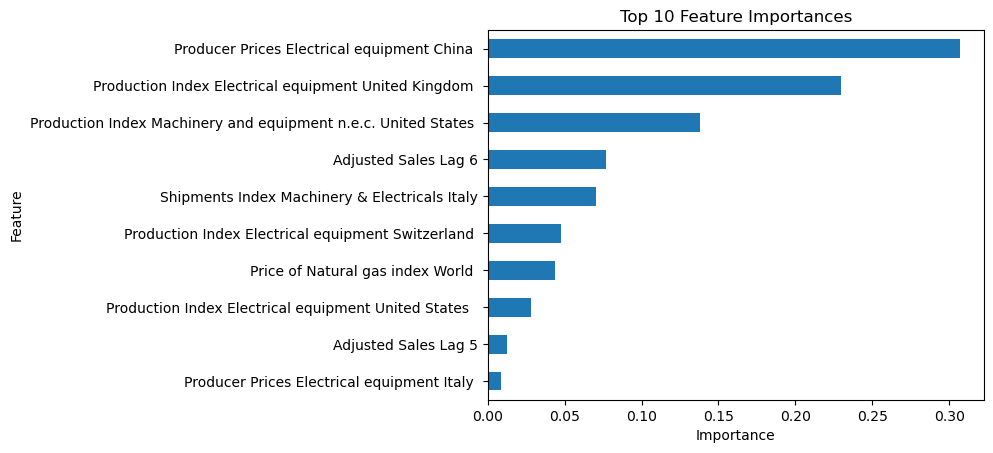

In [185]:
importance_1.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_1.iloc[-10:]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [186]:
xg_importance(1,0.05)

Index(['Shipments Index Machinery & Electricals Italy', 'Adjusted Sales Lag 6',
       'Production Index Machinery and equipment n.e.c. United States ',
       'Production Index Electrical equipment United Kingdom ',
       'Producer Prices Electrical equipment China '],
      dtype='object')

In [187]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg1=data_agg1[[r for r in xg_importance(1,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg1.head()

,Shipments Index Machinery & Electricals Italy,Production Index Machinery and equipment n.e.c. United States,Production Index Electrical equipment United Kingdom,Producer Prices Electrical equipment China,Adjusted Sales (€)
2018-10-01,131.603833,110.895096,110.288394,96.577716,3.577403e+07
2018-11-01,86.417990,111.422638,118.670791,96.318329,5.063649e+06
2018-12-01,100.509533,109.737129,120.467019,95.370118,3.732127e+07
2019-01-01,120.224693,103.448280,105.378705,94.994885,2.709040e+07
2019-02-01,102.883953,106.506844,107.174933,94.950134,3.413209e+07


In [188]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data1=lag_data1[xg_importance(1,0.05).to_list()+['Adjusted Sales (€)']]
lag_data1.head()

,Shipments Index Machinery & Electricals Italy,Adjusted Sales Lag 6,Production Index Machinery and equipment n.e.c. United States,Production Index Electrical equipment United Kingdom,Producer Prices Electrical equipment China,Adjusted Sales (€)
2019-04-01,126.987611,3.577403e+07,111.952568,126.214949,94.434591,3.945016e+07
2019-05-01,121.357126,5.063649e+06,109.168541,113.521605,93.858959,3.874238e+07
2019-06-01,74.464983,3.732127e+07,109.194138,117.593055,94.490632,3.906764e+07
2019-07-01,115.289962,2.709040e+07,111.479668,123.101487,94.873895,3.802631e+07
2019-08-01,122.456894,3.413209e+07,100.386810,123.939727,95.127120,3.811876e+07


### Outlier Detection

In [189]:
sales1_zscore = sales_agg1.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales1_zscore['Adjusted Sales (€)']))
sales1_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales1_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,3.577403e+07
1,2018-11,NaN
2,2018-12,3.732127e+07
3,2019-01,2.709040e+07
4,2019-02,3.413209e+07
5,2019-03,3.334895e+07
6,2019-04,3.945016e+07
7,2019-05,3.874238e+07
8,2019-06,3.906764e+07
9,2019-07,3.802631e+07


In [190]:
sales1_zscore = sales1_zscore.interpolate(method='linear', limit_direction='both')
sales1_zscore.iloc[1]

DateMY                        2018-11
Adjusted Sales (€)    36547648.229545
Name: 1, dtype: object

In [191]:
out_data_agg1=data_agg1.copy()
out_data_agg1.iloc[1,-1]=sales1_zscore.iloc[1][1]

In [192]:
trace1 = dict(type='scatter',
              x=sales_agg1['DateMY'],
              y=sales_agg1['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales1_zscore['DateMY'],
              y=sales1_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 1'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<a class="anchor" id="sgck3">
    
### Product Group 3
    
</a>

### Finding the most important Lag

In [193]:
find_lag(3)

['Production Index Machinery & Electricals China LAG3',
 'Shipments Index Machinery & Electricals China LAG3',
 'Production Index Machinery & Electricals France LAG7',
 'Shipments Index Machinery & Electricals France LAG5',
 'Production Index Machinery & Electricals Germany LAG1',
 'Shipments Index Machinery & Electricals Germany LAG10',
 'Production Index Machinery & Electricals Italy LAG4',
 'Shipments Index Machinery & Electricals Italy LAG4',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG10',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG9',
 'Shipments Index Machinery & Electricals United Kingdom LAG9',
 'Production Index Machinery & Electricals United States LAG1',
 'Shipments Index Machinery & Electricals United States LAG3',
 'Production Index Machinery & Electricals Europe LAG4'

In [194]:
# Creating a new dataset 'data_agg3' which contains the macroeconomic indices and the sales of product group 3
data_agg3=create_ds_lag(3)

### Correlation with Sales

In [195]:
# Spearman Correlation
cor_spearman3=data_agg3.corr(method='spearman')
# Mask the upper triangle of the correlation matrix to obtain only the lower triangle
corr3=cor_spearman3.mask(np.triu(np.ones(cor_spearman3.shape)).astype(bool))

In [196]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr3.loc['Adjusted Sales (€)',:][abs(corr3.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [197]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr3.loc['Adjusted Sales (€)',:][abs(corr3.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [198]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr3=pd.DataFrame(corr3.drop('Adjusted Sales (€)').stack()[abs(corr3.stack()) < 0.01]).reset_index()
low_corr3.columns=['Index1', 'Index2', 'Correlation']
low_corr3.sort_values('Correlation')

,Index1,Index2,Correlation
19,Production Index Electrical equipment United K...,Shipments Index Machinery & Electricals United...,-0.007778
22,Production Index Electrical equipment Japan,Production Index Machinery & Electricals Italy,-0.007702
11,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,-0.007174
13,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Germany,-0.005437
15,Production Index Machinery and equipment n.e.c...,Price of Energy World,-0.004304
8,Producer Prices Electrical equipment Germany,Shipments Index Machinery & Electricals France,-0.004234
1,Production Index Machinery & Electricals Switz...,Production Index Machinery & Electricals Italy,-0.003473
7,Producer Prices Electrical equipment France,Production Index Machinery & Electricals France,-0.003106
14,Production Index Machinery and equipment n.e.c...,Producer Prices Electrical equipment United St...,-0.002114
12,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Europe,-0.001208


In [199]:
# Checking the macroeconomic indices that have a high Spearman correlation between them

# Find pairs of variables that have a correlation greater than 0.98
high_corr3=pd.DataFrame(corr3.drop('Adjusted Sales (€)').stack()[abs(corr3.stack()) > 0.98]).reset_index()
high_corr3.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr3=high_corr3.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr3

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990939
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.990372
4,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990033
5,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.989580
6,"Price of Crude oil, average World",Price of Energy World,0.986560
7,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.982634


In [200]:
# Features to remove
high_corr(3,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland',
 'Production Index Machinery and equipment n.e.c. Japan ',
 'Production Index Machinery and equipment n.e.c. Italy ',
 'Production Index Machinery & Electricals Japan']

In [201]:
data_agg3.drop(high_corr(3,0.99),axis=1,inplace=True)

### Using XGBoost

In [202]:
# insert the "Non-working Days" column at the penultimate position
data_agg3.insert(len(data_agg3.columns) - 1, 'Non-working Days', nowork_days[:43])

In [203]:
lag = list(range(1, 13))
sales_lags_3=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_3 dataframe for each lag value
for value in lag:
    sales_agg3['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_3=pd.concat([sales_lags_3,sales_agg3['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_3.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8.016661e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.168506e+07,8.016661e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8.605806e+06,1.168506e+07,8.016661e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.045908e+07,8.605806e+06,1.168506e+07,8.016661e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [204]:
# Create a lagged dataset with 12 lags of Adjusted Sales (€) column
lag_data3=data_agg3.reset_index().iloc[12:,:].merge(sales_lags_3.reset_index().iloc[12:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data3.index.name=None
adjusted_sales = lag_data3.pop('Adjusted Sales (€)')
lag_data3.insert(len(lag_data3.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data3.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales (€)
2019-10-01,217.053447,107.861788,110.814496,117.909570,141.407661,108.231888,121.312004,124.508413,109.077781,101.799754,...,1.153491e+07,1.274775e+07,1.224357e+07,1.087494e+07,9.974609e+06,1.045908e+07,8.605806e+06,1.168506e+07,8.016661e+06,1.140554e+07
2019-11-01,207.815420,98.677844,122.045555,114.729876,118.703828,114.705312,123.572862,106.303946,112.241491,103.495768,...,1.346182e+07,1.153491e+07,1.274775e+07,1.224357e+07,1.087494e+07,9.974609e+06,1.045908e+07,8.605806e+06,1.168506e+07,1.375693e+07
2019-12-01,215.853833,94.779550,107.250458,116.876757,122.686997,56.245575,71.772044,114.996302,115.405201,120.754768,...,1.138214e+07,1.346182e+07,1.153491e+07,1.274775e+07,1.224357e+07,1.087494e+07,9.974609e+06,1.045908e+07,8.605806e+06,1.107760e+07
2020-01-01,226.669259,98.978105,89.190446,113.794908,140.116214,107.755094,115.641563,146.096768,109.621788,106.691164,...,1.661283e+07,1.138214e+07,1.346182e+07,1.153491e+07,1.274775e+07,1.224357e+07,1.087494e+07,9.974609e+06,1.045908e+07,1.167650e+07
2020-02-01,240.953763,100.354372,115.174401,97.818789,127.512006,114.384082,123.385529,104.722281,103.838375,109.719699,...,1.140554e+07,1.661283e+07,1.138214e+07,1.346182e+07,1.153491e+07,1.274775e+07,1.224357e+07,1.087494e+07,9.974609e+06,1.005166e+07


In [205]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data3.iloc[:,:56], lag_data3.iloc[:,56])
# feature importance
importance_3=pd.DataFrame(index=lag_data3.iloc[:,:56].columns, data=model.feature_importances_)
importance_3.head()

,0
Shipments Index Machinery & Electricals China,0.000229
Production Index Machinery & Electricals France,0.000131
Shipments Index Machinery & Electricals France,0.001555
Production Index Machinery & Electricals Germany,0.000675
Shipments Index Machinery & Electricals Germany,0.000837


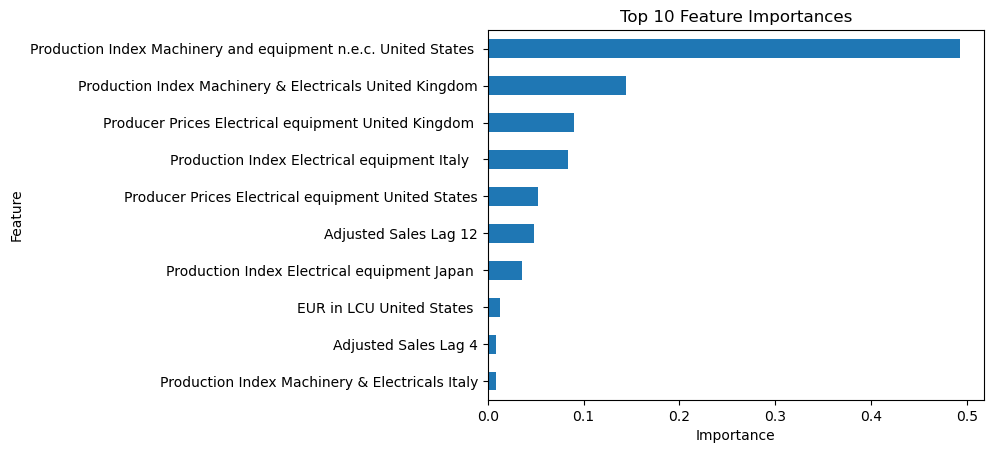

In [206]:
importance_3.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_3.iloc[-10:]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [207]:
xg_importance(3,0.05)

Index(['Producer Prices Electrical equipment United States',
       'Production Index Electrical equipment Italy  ',
       'Producer Prices Electrical equipment United Kingdom ',
       'Production Index Machinery & Electricals United Kingdom',
       'Production Index Machinery and equipment n.e.c. United States '],
      dtype='object')

In [208]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg3=data_agg3[[r for r in xg_importance(3,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg3.head()

,Producer Prices Electrical equipment United States,Production Index Electrical equipment Italy,Producer Prices Electrical equipment United Kingdom,Production Index Machinery & Electricals United Kingdom,Production Index Machinery and equipment n.e.c. United States,Adjusted Sales (€)
2018-10-01,107.978470,89.439110,111.770729,104.052221,110.895096,8.016661e+06
2018-11-01,108.554298,90.803436,112.384850,101.092557,111.422638,1.168506e+07
2018-12-01,108.777786,46.917637,112.180145,119.910298,109.737129,8.605806e+06
2019-01-01,110.005486,85.194542,112.180145,106.078469,103.448280,1.045908e+07
2019-02-01,110.096680,93.001511,112.180145,107.185716,106.506844,9.974609e+06


In [209]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data3=lag_data3[xg_importance(3,0.05).to_list()+['Adjusted Sales (€)']]
lag_data3.head()

,Producer Prices Electrical equipment United States,Production Index Electrical equipment Italy,Producer Prices Electrical equipment United Kingdom,Production Index Machinery & Electricals United Kingdom,Production Index Machinery and equipment n.e.c. United States,Adjusted Sales (€)
2019-10-01,111.384506,83.527031,111.463669,101.799754,103.335777,1.140554e+07
2019-11-01,111.613358,92.925720,111.668373,103.495768,103.513992,1.375693e+07
2019-12-01,110.550217,43.961597,112.794266,120.754768,101.278183,1.107760e+07
2020-01-01,110.795616,87.695801,112.077789,106.691164,99.128448,1.167650e+07
2020-02-01,110.656105,91.637192,111.361313,109.719699,102.212601,1.005166e+07


### Outlier Detection

In [210]:
sales3_zscore = sales_agg3.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales3_zscore['Adjusted Sales (€)']))
sales3_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales3_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,8.016661e+06
1,2018-11,1.168506e+07
2,2018-12,8.605806e+06
3,2019-01,1.045908e+07
4,2019-02,9.974609e+06
5,2019-03,1.087494e+07
6,2019-04,1.224357e+07
7,2019-05,1.274775e+07
8,2019-06,1.153491e+07
9,2019-07,1.346182e+07


In [211]:
sales3_zscore = sales3_zscore.interpolate(method='linear', limit_direction='both')
sales3_zscore.iloc[27]

DateMY                       2021-01
Adjusted Sales (€)    13065158.56405
Name: 27, dtype: object

In [212]:
out_data_agg3=data_agg3.copy()
out_data_agg3.iloc[27,-1]=sales3_zscore.iloc[27][1]

In [213]:
out_lag_data3=lag_data3.copy()
out_lag_data3.loc['2021-01-01']['Adjusted Sales (€)']=sales3_zscore.iloc[27,1]

In [214]:
trace1 = dict(type='scatter',
              x=sales_agg3['DateMY'],
              y=sales_agg3['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales3_zscore['DateMY'],
              y=sales3_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 3'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<a class="anchor" id="sgck4">
    
### Product Group 4
    
</a>

### Finding the most important Lag

In [215]:
find_lag(4)

['Production Index Machinery & Electricals China LAG8',
 'Shipments Index Machinery & Electricals China LAG8',
 'Production Index Machinery & Electricals France LAG10',
 'Shipments Index Machinery & Electricals France LAG10',
 'Production Index Machinery & Electricals Germany LAG4',
 'Shipments Index Machinery & Electricals Germany LAG10',
 'Production Index Machinery & Electricals Italy LAG4',
 'Shipments Index Machinery & Electricals Italy LAG8',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG10',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG5',
 'Shipments Index Machinery & Electricals United Kingdom LAG9',
 'Production Index Machinery & Electricals United States LAG1',
 'Shipments Index Machinery & Electricals United States LAG10',
 'Production Index Machinery & Electricals Europe LA

In [216]:
# Creating a new dataset 'data_agg4' which contains the macroeconomic indices and the sales of product group 4
data_agg4=create_ds_lag(4)

### Correlation with Sales

In [217]:
# Spearman Correlation
cor_spearman4=data_agg4.corr(method='spearman')
corr4=cor_spearman4.mask(np.triu(np.ones(cor_spearman4.shape)).astype(bool))

In [218]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr4.loc['Adjusted Sales (€)',:][abs(corr4.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [219]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr4.loc['Adjusted Sales (€)',:][abs(corr4.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [220]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr4=pd.DataFrame(corr4.drop('Adjusted Sales (€)').stack()[abs(corr4.stack()) < 0.01]).reset_index()
low_corr4.columns=['Index1', 'Index2', 'Correlation']
low_corr4.sort_values('Correlation')

,Index1,Index2,Correlation
4,Production Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals United...,-0.008457
19,Production Index Electrical equipment Japan,Production Index Machinery & Electricals Europe,-0.007249
21,Production Index Electrical equipment Japan,Production Index Machinery and equipment n.e.c...,-0.007098
13,Producer Prices Electrical equipment China,Producer Prices Electrical equipment United St...,-0.005134
3,Production Index Machinery & Electricals Europe,Production Index Machinery & Electricals Switz...,-0.005134
2,Production Index Machinery & Electricals Switz...,Production Index Machinery & Electricals Italy,-0.003473
12,Producer Prices Electrical equipment Germany,"Price of Crude oil, average World",-0.003024
15,Production Index Machinery and equipment n.e.c...,Production Index Machinery and equipment n.e.c...,-0.002115
17,Production Index Electrical equipment United K...,Production Index Machinery and equipment n.e.c...,-0.001020
26,GDP Germany,Production Index Machinery and equipment n.e.c...,-0.000605


In [221]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr4=pd.DataFrame(corr4.drop('Adjusted Sales (€)').stack()[abs(corr4.stack()) > 0.98]).reset_index()
high_corr4.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr4=high_corr4.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr4

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990939
3,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990033
4,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.989580
5,"Price of Crude oil, average World",Price of Energy World,0.984748
6,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.982634
7,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals France,0.981310


In [222]:
# Features to remove
high_corr(4,0.99)

['Production Index Machinery & Electricals China',
 'Production Index Machinery & Electricals Switzerland',
 'Production Index Machinery & Electricals Japan',
 'Production Index Machinery & Electricals Japan']

In [223]:
data_agg4.drop(high_corr(4,0.99),axis=1,inplace=True)

### Using XGBoost

In [224]:
# insert the "Non-working Days" column at the penultimate position
data_agg4.insert(len(data_agg4.columns) - 1, 'Non-working Days', nowork_days[:43])

In [225]:
lag = list(range(1, 7))
sales_lags_4=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_4 dataframe for each lag value
for value in lag:
    sales_agg4['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_4=pd.concat([sales_lags_4,sales_agg4['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_4.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,394180.84379,NaN,NaN,NaN,NaN,NaN
2,365752.58370,394180.84379,NaN,NaN,NaN,NaN
3,423649.44560,365752.58370,394180.84379,NaN,NaN,NaN
4,473037.88076,423649.44560,365752.58370,394180.84379,NaN,NaN


In [226]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data4=data_agg4.reset_index().iloc[6:,:].merge(sales_lags_4.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data4.index.name=None
adjusted_sales = lag_data4.pop('Adjusted Sales (€)')
lag_data4.insert(len(lag_data4.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data4.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,197.528665,109.749147,127.099604,120.518565,147.947403,88.783181,74.464983,128.141594,93.703398,115.088417,...,118.298233,277850.000000,10,484268.93615,608251.19580,473037.88076,423649.44560,365752.58370,394180.84379,423664.01196
2019-05-01,199.419203,100.834345,104.741535,104.776326,129.834876,99.275113,115.289962,123.892980,93.772252,101.556108,...,117.163727,277850.000000,10,423664.01196,484268.93615,608251.19580,473037.88076,423649.44560,365752.58370,374168.88372
2019-06-01,211.955755,68.229708,92.801986,109.597012,130.043079,104.586684,122.456894,117.467286,93.841106,101.799754,...,89.626122,277850.000000,11,374168.88372,423664.01196,484268.93615,608251.19580,473037.88076,423649.44560,190530.42885
2019-07-01,220.519655,97.630983,110.501701,122.534648,136.619316,114.299549,120.132032,129.419735,96.405178,103.495768,...,105.406097,280753.333333,8,190530.42885,374168.88372,423664.01196,484268.93615,608251.19580,473037.88076,382418.78488
2019-08-01,241.846854,108.280608,122.451734,110.612414,137.741953,99.732969,131.936099,124.793250,98.969251,120.754768,...,103.652771,280753.333333,9,382418.78488,190530.42885,374168.88372,423664.01196,484268.93615,608251.19580,302577.37686


In [227]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data4.iloc[:,:52], lag_data4.iloc[:,52])
# feature importance
importance_4=pd.DataFrame(index=lag_data4.iloc[:,:52].columns, data=model.feature_importances_)
importance_4.head()

,0
Shipments Index Machinery & Electricals China,0.001050
Production Index Machinery & Electricals France,0.055203
Shipments Index Machinery & Electricals France,0.001054
Production Index Machinery & Electricals Germany,0.001149
Shipments Index Machinery & Electricals Germany,0.002042


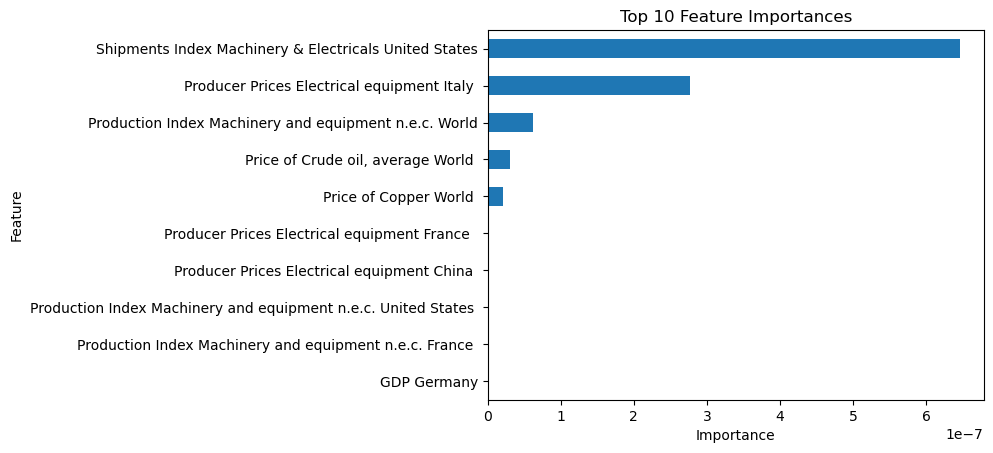

In [228]:
importance_4.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_4.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [229]:
xg_importance(4,0.05)

Index(['Production Index Machinery & Electricals France',
       'Production Index Machinery and equipment n.e.c. Italy ',
       'Production Index Machinery and equipment n.e.c. Japan ',
       'Shipments Index Machinery & Electricals Japan'],
      dtype='object')

In [230]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg4=data_agg4[[r for r in xg_importance(4,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg4.head()

,Production Index Machinery & Electricals France,Production Index Machinery and equipment n.e.c. Italy,Production Index Machinery and equipment n.e.c. Japan,Shipments Index Machinery & Electricals Japan,Adjusted Sales (€)
2018-10-01,101.397118,130.589127,132.601604,129.739861,394180.84379
2018-11-01,91.006621,126.489464,116.782340,113.691669,365752.58370
2018-12-01,91.596398,127.689362,123.759402,120.856531,423649.44560
2019-01-01,111.966269,66.794441,159.977219,158.512428,473037.88076
2019-02-01,92.235176,114.290482,119.068913,114.877796,608251.19580


In [231]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data4=lag_data4[xg_importance(4,0.05).to_list()+['Adjusted Sales (€)']]
lag_data4.head()

,Production Index Machinery & Electricals France,Production Index Machinery and equipment n.e.c. Italy,Production Index Machinery and equipment n.e.c. Japan,Shipments Index Machinery & Electricals Japan,Adjusted Sales (€)
2019-04-01,109.749147,117.990173,130.897936,128.141594,423664.01196
2019-05-01,100.834345,99.191734,126.519656,123.892980,374168.88372
2019-06-01,68.229708,106.991089,121.184201,117.467286,190530.42885
2019-07-01,97.630983,113.790520,134.357731,129.419735,382418.78488
2019-08-01,108.280608,125.389557,131.503786,124.793250,302577.37686


### Outlier Detection

In [232]:
sales4_zscore = sales_agg4.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales4_zscore['Adjusted Sales (€)']))
sales4_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales4_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,394180.84379
1,2018-11,365752.58370
2,2018-12,423649.44560
3,2019-01,473037.88076
4,2019-02,608251.19580
5,2019-03,484268.93615
6,2019-04,423664.01196
7,2019-05,374168.88372
8,2019-06,190530.42885
9,2019-07,382418.78488


In [233]:
sales4_zscore = sales4_zscore.interpolate(method='linear', limit_direction='both')
sales4_zscore.iloc[32]

DateMY                     2021-06
Adjusted Sales (€)    519036.01788
Name: 32, dtype: object

In [234]:
out_data_agg4=data_agg4.copy()
out_data_agg4.iloc[32,-1]=sales4_zscore.iloc[32][1]

In [235]:
out_lag_data4=lag_data4.copy()
out_lag_data4.loc['2021-06-01']['Adjusted Sales (€)']=sales4_zscore.iloc[32][1]

In [236]:
trace1 = dict(type='scatter',
              x=sales_agg4['DateMY'],
              y=sales_agg4['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales4_zscore['DateMY'],
              y=sales4_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 4'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<a class="anchor" id="sgck5">
    
### Product Group 5
    
</a>

### Finding the most important Lag

In [237]:
find_lag(5)

['Production Index Machinery & Electricals China LAG3',
 'Shipments Index Machinery & Electricals China LAG3',
 'Production Index Machinery & Electricals France LAG1',
 'Shipments Index Machinery & Electricals France LAG1',
 'Production Index Machinery & Electricals Germany LAG1',
 'Shipments Index Machinery & Electricals Germany LAG1',
 'Production Index Machinery & Electricals Italy LAG6',
 'Shipments Index Machinery & Electricals Italy LAG1',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG10',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG1',
 'Shipments Index Machinery & Electricals United Kingdom LAG10',
 'Production Index Machinery & Electricals United States LAG12',
 'Shipments Index Machinery & Electricals United States LAG12',
 'Production Index Machinery & Electricals Europe LAG

In [238]:
# Creating a new dataset 'data_agg5' which contains the macroeconomic indices and the sales of product group 5
data_agg5=create_ds_lag(5)

### Correlation with Sales

In [239]:
# Spearman Correlation
cor_spearman5=data_agg5.corr(method='spearman')
corr5=cor_spearman5.mask(np.triu(np.ones(cor_spearman5.shape)).astype(bool))

In [240]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr5.loc['Adjusted Sales (€)',:][abs(corr5.loc['Adjusted Sales (€)',:])<0.1]

EUR in LCU United States    -0.083812
Name: Adjusted Sales (€), dtype: float64

In [241]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr5.loc['Adjusted Sales (€)',:][abs(corr5.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [242]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr5=pd.DataFrame(corr5.drop('Adjusted Sales (€)').stack()[abs(corr5.stack()) < 0.01]).reset_index()
low_corr5.columns=['Index1', 'Index2', 'Correlation']
low_corr5.sort_values('Correlation')

,Index1,Index2,Correlation
10,Production Index Machinery and equipment n.e.c...,Producer Prices Electrical equipment France,-0.009205
12,Production Index Electrical equipment World,Producer Prices Electrical equipment China,-0.009061
13,Production Index Electrical equipment France,Production Index Machinery and equipment n.e.c...,-0.008910
11,Production Index Electrical equipment United S...,Shipments Index Machinery & Electricals Italy,-0.005889
2,Production Index Machinery & Electricals Europe,Production Index Machinery & Electricals Switz...,-0.005134
6,Producer Prices Electrical equipment United Ki...,Shipments Index Machinery & Electricals Germany,-0.005063
8,Producer Prices Electrical equipment Germany,Production Index Machinery & Electricals Europe,-0.002873
0,Production Index Machinery & Electricals Switz...,Shipments Index Machinery & Electricals France,-0.002114
1,Shipments Index Machinery & Electricals Switze...,Shipments Index Machinery & Electricals France,-0.000453
14,Production Index Electrical equipment Germany,Production Index Electrical equipment France,0.003172


In [243]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr5=pd.DataFrame(corr5.drop('Adjusted Sales (€)').stack()[abs(corr5.stack()) > 0.98]).reset_index()
high_corr5.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr5=high_corr5.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr5

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990939
3,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990033
4,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.982634
5,"Price of Crude oil, average World",Price of Energy World,0.981124


In [244]:
# Features to remove
high_corr(5,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland',
 'Production Index Machinery and equipment n.e.c. Japan ',
 'Shipments Index Machinery & Electricals Japan']

In [245]:
data_agg5.drop(high_corr(5,0.99),axis=1,inplace=True)

### Using XGBoost

In [246]:
# insert the "Non-working Days" column at the penultimate position
data_agg5.insert(len(data_agg5.columns) - 1, 'Non-working Days', nowork_days[:43])

In [247]:
lag = list(range(1, 7))
sales_lags_5=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_5 dataframe for each lag value
for value in lag:
    sales_agg5['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_5=pd.concat([sales_lags_5,sales_agg5['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_5.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,2.476570e+06,NaN,NaN,NaN,NaN,NaN
2,8.859035e+06,2.476570e+06,NaN,NaN,NaN,NaN
3,6.843295e+06,8.859035e+06,2.476570e+06,NaN,NaN,NaN
4,8.043841e+06,6.843295e+06,8.859035e+06,2.476570e+06,NaN,NaN


In [248]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data5=data_agg5.reset_index().iloc[6:,:].merge(sales_lags_5.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data5.index.name=None
adjusted_sales = lag_data5.pop('Adjusted Sales (€)')
lag_data5.insert(len(lag_data5.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data5.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,175.668147,107.861788,126.966216,122.534648,140.116214,118.350514,122.454318,126.907472,98.442835,120.754768,...,118.298233,277850.000000,10,1.173560e+07,6.748545e+06,8.043841e+06,6.843295e+06,8.859035e+06,2.476570e+06,5.680176e+06
2019-05-01,175.668147,98.677844,114.917432,110.612414,127.512006,107.719260,106.279804,123.214607,98.075490,106.691164,...,117.163727,277850.000000,10,5.680176e+06,1.173560e+07,6.748545e+06,8.043841e+06,6.843295e+06,8.859035e+06,1.134411e+07
2019-06-01,261.642802,94.779550,110.814496,115.712333,131.993634,88.783181,123.261639,115.194729,97.708145,109.719699,...,89.626122,280753.333333,11,1.134411e+07,5.680176e+06,1.173560e+07,6.748545e+06,8.043841e+06,6.843295e+06,1.366820e+07
2019-07-01,219.595813,98.978105,122.045555,108.917455,126.769557,99.275113,121.312004,127.830484,100.443454,111.546958,...,105.406097,280753.333333,8,1.366820e+07,1.134411e+07,5.680176e+06,1.173560e+07,6.748545e+06,8.043841e+06,1.117847e+07
2019-08-01,234.169196,100.354372,107.250458,117.126331,132.660766,104.586684,123.572862,125.209957,103.178762,110.593756,...,103.652771,280753.333333,9,1.117847e+07,1.366820e+07,1.134411e+07,5.680176e+06,1.173560e+07,6.748545e+06,7.661037e+06


In [249]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data5.iloc[:,:51], lag_data5.iloc[:,51])
# feature importance
importance_5=pd.DataFrame(index=lag_data5.iloc[:,:51].columns, data=model.feature_importances_)
importance_5.head()

,0
Shipments Index Machinery & Electricals China,8.024530e-03
Production Index Machinery & Electricals France,2.145648e-03
Shipments Index Machinery & Electricals France,3.541580e-02
Production Index Machinery & Electricals Germany,2.123389e-05
Shipments Index Machinery & Electricals Germany,1.541460e-08


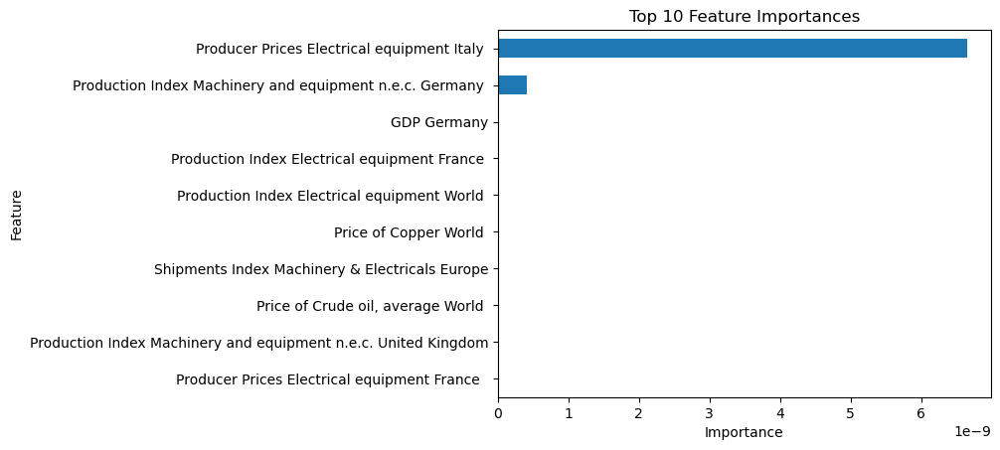

In [250]:
importance_5.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_5.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [251]:
xg_importance(5,0.05)

Index(['Price of Base Metals World ',
       'Producer Prices Electrical equipment China ',
       'Price of Metals  & Minerals World ', 'Non-working Days',
       'Adjusted Sales Lag 3'],
      dtype='object')

In [252]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg5=data_agg5[[r for r in xg_importance(5,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg5.head()

,Price of Base Metals World,Producer Prices Electrical equipment China,Price of Metals & Minerals World,Non-working Days,Adjusted Sales (€)
2018-10-01,96.429104,96.441508,77.444916,9,2.476570e+06
2018-11-01,96.829925,96.690564,79.354986,8,8.859035e+06
2018-12-01,88.027270,96.645106,77.500875,12,6.843295e+06
2019-01-01,85.576276,96.165571,76.071705,9,8.043841e+06
2019-02-01,84.540562,95.579388,75.774153,8,6.748545e+06


In [253]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data5=lag_data5[xg_importance(5,0.05).to_list()+['Adjusted Sales (€)']]
lag_data5.head()

,Price of Base Metals World,Producer Prices Electrical equipment China,Price of Metals & Minerals World,Non-working Days,Adjusted Sales Lag 3,Adjusted Sales (€)
2019-04-01,83.841374,97.008073,81.096698,10,8.043841e+06,5.680176e+06
2019-05-01,82.733389,97.068489,81.599388,10,6.748545e+06,1.134411e+07
2019-06-01,81.251093,96.773172,78.649189,11,1.173560e+07,1.366820e+07
2019-07-01,84.681739,96.577716,78.526089,8,5.680176e+06,1.117847e+07
2019-08-01,86.167828,96.318329,81.031184,9,1.134411e+07,7.661037e+06


### Outlier Detection

In [254]:
sales5_zscore = sales_agg5.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales5_zscore['Adjusted Sales (€)']))
sales5_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales5_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,2.476570e+06
1,2018-11,8.859035e+06
2,2018-12,6.843295e+06
3,2019-01,8.043841e+06
4,2019-02,6.748545e+06
5,2019-03,1.173560e+07
6,2019-04,5.680176e+06
7,2019-05,1.134411e+07
8,2019-06,1.366820e+07
9,2019-07,1.117847e+07


There seem to be no outliers to deal with.

<a class="anchor" id="sgck6">
    
### Product Group 6
    
</a>

### Finding the most important Lag

In [255]:
find_lag(6)

['Production Index Machinery & Electricals China LAG7',
 'Shipments Index Machinery & Electricals China LAG7',
 'Production Index Machinery & Electricals France LAG1',
 'Shipments Index Machinery & Electricals France LAG1',
 'Production Index Machinery & Electricals Germany LAG5',
 'Shipments Index Machinery & Electricals Germany LAG1',
 'Production Index Machinery & Electricals Italy LAG9',
 'Shipments Index Machinery & Electricals Italy LAG1',
 'Production Index Machinery & Electricals Japan LAG5',
 'Shipments Index Machinery & Electricals Japan LAG5',
 'Production Index Machinery & Electricals Switzerland LAG7',
 'Shipments Index Machinery & Electricals Switzerland LAG7',
 'Production Index Machinery & Electricals United Kingdom LAG5',
 'Shipments Index Machinery & Electricals United Kingdom LAG9',
 'Production Index Machinery & Electricals United States LAG7',
 'Shipments Index Machinery & Electricals United States LAG3',
 'Production Index Machinery & Electricals Europe LAG1',
 'S

In [256]:
# Creating a new dataset 'data_agg6' which contains the macroeconomic indices and the sales of product group 6
data_agg6=create_ds_lag(6)

### Correlation with Sales

In [257]:
# Spearman Correlation
cor_spearman6=data_agg6.corr(method='spearman')
corr6=cor_spearman6.mask(np.triu(np.ones(cor_spearman6.shape)).astype(bool))

In [258]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr6.loc['Adjusted Sales (€)',:][abs(corr6.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [259]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr6.loc['Adjusted Sales (€)',:][abs(corr6.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [260]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr6=pd.DataFrame(corr6.drop('Adjusted Sales (€)').stack()[abs(corr6.stack()) < 0.01]).reset_index()
low_corr6.columns=['Index1', 'Index2', 'Correlation']
low_corr6.sort_values('Correlation')

,Index1,Index2,Correlation
1,Production Index Machinery & Electricals Unite...,Shipments Index Machinery & Electricals Italy,-0.009665
22,Production Index Electrical equipment France,Production Index Electrical equipment Switzerl...,-0.008835
6,Production Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals United...,-0.008457
15,Production Index Electrical equipment United S...,Producer Prices Electrical equipment United St...,-0.008457
9,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Italy,-0.008306
26,GDP Germany,Production Index Electrical equipment Japan,-0.007415
25,GDP Germany,Production Index Machinery and equipment n.e.c...,-0.006810
17,Production Index Electrical equipment World,Price of Natural gas index World,-0.004530
11,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals France,-0.004077
18,Production Index Electrical equipment United K...,Production Index Machinery & Electricals Germany,-0.003323


In [261]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr6=pd.DataFrame(corr6.drop('Adjusted Sales (€)').stack()[abs(corr6.stack()) > 0.98]).reset_index()
high_corr6.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr6=high_corr6.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr6

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.989278
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.987238
3,"Price of Crude oil, average World",Price of Energy World,0.986560
4,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.985654
5,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.984748


In [262]:
# Features to remove
high_corr(6,0.99)

['Production Index Machinery & Electricals China']

In [263]:
data_agg6.drop(high_corr(6,0.99),axis=1,inplace=True)

### Using XGBoost

In [264]:
# insert the "Non-working Days" column at the penultimate position
data_agg6.insert(len(data_agg6.columns) - 1, 'Non-working Days', nowork_days[:43])

In [265]:
lag = list(range(1, 7))
sales_lags_6=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_6 dataframe for each lag value
for value in lag:
    sales_agg6['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_6=pd.concat([sales_lags_6,sales_agg6['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_6.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,365908.51560,NaN,NaN,NaN,NaN,NaN
2,465951.25560,365908.51560,NaN,NaN,NaN,NaN
3,984480.59965,465951.25560,365908.5156,NaN,NaN,NaN
4,585099.99570,984480.59965,465951.2556,365908.5156,NaN,NaN


In [266]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data6=data_agg6.reset_index().iloc[6:,:].merge(sales_lags_6.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data6.index.name=None
adjusted_sales = lag_data6.pop('Adjusted Sales (€)')
lag_data6.insert(len(lag_data6.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data6.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,199.419203,107.861788,126.966216,127.404132,140.116214,116.499514,122.454318,122.624695,123.289888,105.914071,...,117.163727,283860.0,10,724570.16655,531738.80712,585099.99570,984480.59965,465951.25560,365908.51560,275909.66928
2019-05-01,211.955755,98.677844,114.917432,120.518565,127.512006,60.764542,106.279804,122.991956,124.508413,109.077781,...,89.626122,284280.0,10,275909.66928,724570.16655,531738.80712,585099.99570,984480.59965,465951.25560,314714.85492
2019-06-01,220.519655,94.779550,110.814496,104.776326,131.993634,105.463832,123.261639,105.514024,106.303946,112.241491,...,105.406097,284280.0,11,314714.85492,275909.66928,724570.16655,531738.80712,585099.99570,984480.59965,282680.22681
2019-07-01,241.846854,98.978105,122.045555,109.597012,126.769557,118.350514,121.312004,114.466647,114.996302,115.405201,...,103.652771,284280.0,8,282680.22681,314714.85492,275909.66928,724570.16655,531738.80712,585099.99570,727588.22597
2019-08-01,175.668147,100.354372,107.250458,122.534648,132.660766,107.719260,123.572862,141.637717,146.096768,109.621788,...,111.388054,292550.0,9,727588.22597,282680.22681,314714.85492,275909.66928,724570.16655,531738.80712,207345.03234


In [267]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data6.iloc[:,:54], lag_data6.iloc[:,54])
# feature importance
importance_6=pd.DataFrame(index=lag_data6.iloc[:,:54].columns, data=model.feature_importances_)
importance_6.head()

,0
Shipments Index Machinery & Electricals China,0.001170
Production Index Machinery & Electricals France,0.000423
Shipments Index Machinery & Electricals France,0.000036
Production Index Machinery & Electricals Germany,0.005159
Shipments Index Machinery & Electricals Germany,0.000714


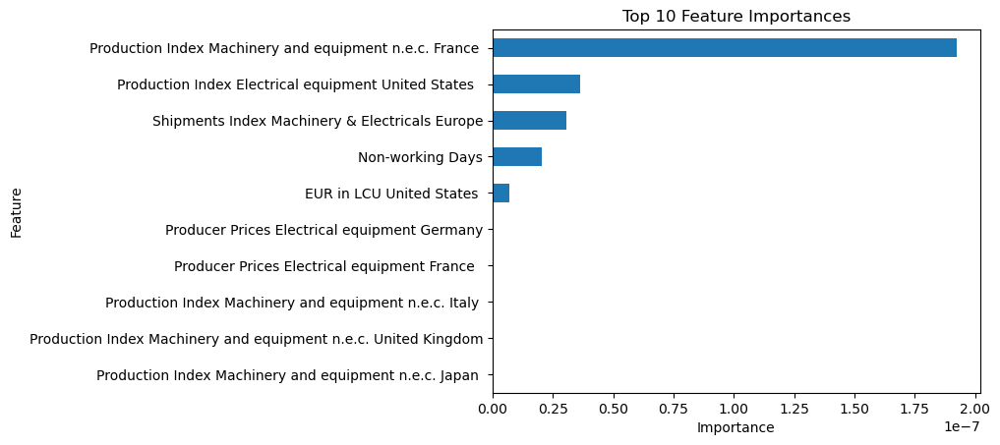

In [268]:
importance_6.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_6.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [269]:
xg_importance(6,0.05)

Index(['Price of Natural gas index World ',
       'Production Index Machinery & Electricals Japan',
       'Price of Energy World ',
       'Production Index Electrical equipment Italy  ',
       'Production Index Electrical equipment Japan ',
       'Shipments Index Machinery & Electricals Italy'],
      dtype='object')

In [270]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg6=data_agg6[[r for r in xg_importance(6,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg6.head()

,Price of Natural gas index World,Production Index Machinery & Electricals Japan,Price of Energy World,Production Index Electrical equipment Italy,Production Index Electrical equipment Japan,Shipments Index Machinery & Electricals Italy,Adjusted Sales (€)
2018-10-01,73.291727,115.377449,98.724499,85.194542,107.071826,115.289962,365908.51560
2018-11-01,84.821629,126.907472,100.222169,93.001511,118.770875,122.456894,465951.25560
2018-12-01,71.030120,123.214607,84.436807,84.133400,116.475579,120.132032,984480.59965
2019-01-01,71.462457,115.194729,74.898746,64.881248,102.982134,131.936099,585099.99570
2019-02-01,73.518728,127.830484,76.204771,81.556343,114.521361,92.418842,531738.80712


In [271]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data6=lag_data6[xg_importance(6,0.05).to_list()+['Adjusted Sales (€)']]
lag_data6.head()

,Price of Natural gas index World,Production Index Machinery & Electricals Japan,Price of Energy World,Production Index Electrical equipment Italy,Production Index Electrical equipment Japan,Shipments Index Machinery & Electricals Italy,Adjusted Sales (€)
2019-04-01,78.338011,122.624695,82.223201,88.832741,111.907535,122.454318,275909.66928
2019-05-01,77.504493,122.991956,86.426732,75.947449,112.524242,106.279804,314714.85492
2019-06-01,81.713569,105.514024,85.175773,91.637192,95.957352,123.261639,282680.22681
2019-07-01,89.167570,114.466647,76.339272,83.527031,107.309956,121.312004,727588.22597
2019-08-01,89.570796,141.637717,77.038422,92.925720,131.450762,123.572862,207345.03234


### Outliers Detection

In [272]:
sales6_zscore = sales_agg6.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales6_zscore['Adjusted Sales (€)']))
sales6_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales6_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,365908.51560
1,2018-11,465951.25560
2,2018-12,984480.59965
3,2019-01,585099.99570
4,2019-02,531738.80712
5,2019-03,724570.16655
6,2019-04,275909.66928
7,2019-05,314714.85492
8,2019-06,282680.22681
9,2019-07,727588.22597


There seem to be no outliers to deal with.

<a class="anchor" id="sgck8">
    
### Product Group 8
    
</a>

### Finding the most important Lag

In [273]:
find_lag(8)

['Production Index Machinery & Electricals China LAG9',
 'Shipments Index Machinery & Electricals China LAG9',
 'Production Index Machinery & Electricals France LAG7',
 'Shipments Index Machinery & Electricals France LAG7',
 'Production Index Machinery & Electricals Germany LAG7',
 'Shipments Index Machinery & Electricals Germany LAG7',
 'Production Index Machinery & Electricals Italy LAG7',
 'Shipments Index Machinery & Electricals Italy LAG9',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG10',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG7',
 'Shipments Index Machinery & Electricals United Kingdom LAG7',
 'Production Index Machinery & Electricals United States LAG1',
 'Shipments Index Machinery & Electricals United States LAG3',
 'Production Index Machinery & Electricals Europe LAG7',

In [274]:
# Creating a new dataset 'data_agg8' which contains the macroeconomic indices and the sales of product group 8
data_agg8=create_ds_lag(8)

### Correlation with Sales

In [275]:
# Spearman Correlation
cor_spearman8=data_agg8.corr(method='spearman')
corr8=cor_spearman8.mask(np.triu(np.ones(cor_spearman8.shape)).astype(bool))

In [276]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr8.loc['Adjusted Sales (€)',:][abs(corr8.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [277]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr8.loc['Adjusted Sales (€)',:][abs(corr8.loc['Adjusted Sales (€)',:])>0.7]

Producer Prices Electrical equipment United States    0.704319
Producer Prices Electrical equipment Germany          0.716922
Name: Adjusted Sales (€), dtype: float64

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [278]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr8=pd.DataFrame(corr8.drop('Adjusted Sales (€)').stack()[abs(corr8.stack()) < 0.01]).reset_index()
low_corr8.columns=['Index1', 'Index2', 'Correlation']
low_corr8.sort_values('Correlation')

,Index1,Index2,Correlation
17,Production Index Electrical equipment United K...,Shipments Index Machinery & Electricals United...,-0.009742
6,Price of Metals & Minerals World,Shipments Index Machinery & Electricals Europe,-0.006645
1,Shipments Index Machinery & Electricals United...,Production Index Machinery & Electricals Italy,-0.006342
19,Production Index Electrical equipment France,Production Index Electrical equipment United K...,-0.005626
10,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals France,-0.005587
7,Producer Prices Electrical equipment United Ki...,Shipments Index Machinery & Electricals France,-0.004836
4,Shipments Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals Switze...,-0.004832
3,Production Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals Switze...,-0.004530
9,Producer Prices Electrical equipment France,Production Index Machinery & Electricals France,-0.003106
11,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Switze...,-0.000453


In [279]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr8=pd.DataFrame(corr8.drop('Adjusted Sales (€)').stack()[abs(corr8.stack()) > 0.98]).reset_index()
high_corr8.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr8=high_corr8.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr8

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990939
3,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990033
4,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.989580
5,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.988786
6,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.982634


In [280]:
# Features to remove
high_corr(8,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland',
 'Production Index Machinery & Electricals Japan',
 'Shipments Index Machinery & Electricals Japan']

In [281]:
data_agg8.drop(high_corr(8,0.99),axis=1,inplace=True)

### Using XGBoost

In [282]:
# insert the "Non-working Days" column at the penultimate position
data_agg8.insert(len(data_agg8.columns) - 1, 'Non-working Days', nowork_days[:43])

In [283]:
lag = list(range(1, 16))
sales_lags_8=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_8 dataframe for each lag value
for value in lag:
    sales_agg8['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_8=pd.concat([sales_lags_8,sales_agg8['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_8.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,580778.26534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,518398.37845,580778.26534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,267418.34935,518398.37845,580778.26534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,372627.94655,267418.34935,518398.37845,580778.26534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [284]:
# Create a lagged dataset with 15 lags of Adjusted Sales (€) column
lag_data8=data_agg8.reset_index().iloc[15:,:].merge(sales_lags_8.reset_index().iloc[15:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data8.index.name=None
adjusted_sales = lag_data8.pop('Adjusted Sales (€)')
lag_data8.insert(len(lag_data8.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data8.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,Shipments Index Machinery & Electricals United Kingdom,...,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15,Adjusted Sales (€)
2020-01-01,219.595813,98.978105,122.045555,108.917455,126.769557,108.231888,106.279804,109.621788,111.546958,108.958677,...,4.202870e+05,2.976116e+05,416386.50060,582419.03460,361474.53417,372627.94655,267418.34935,518398.37845,580778.26534,323121.66160
2020-02-01,234.169196,100.354372,107.250458,117.126331,132.660766,114.705312,123.261639,103.838375,110.593756,107.342877,...,3.680812e+05,4.202870e+05,297611.61264,416386.50060,582419.03460,361474.53417,372627.94655,267418.34935,518398.37845,327300.91394
2020-03-01,261.126350,65.470200,89.190446,104.348074,121.128352,56.245575,121.312004,98.054962,100.108825,97.868918,...,3.983323e+05,3.680812e+05,420287.02227,297611.61264,416386.50060,582419.03460,361474.53417,372627.94655,267418.34935,848395.33328
2020-04-01,217.053447,100.849908,115.174401,117.909570,138.359392,107.755094,123.572862,97.088932,112.212040,109.032887,...,1.086855e+06,3.983323e+05,368081.20078,420287.02227,297611.61264,416386.50060,582419.03460,361474.53417,372627.94655,303976.74272
2020-05-01,207.815420,101.454706,120.928567,114.729876,128.931038,114.384082,71.772044,96.122902,113.312315,111.895235,...,1.120149e+05,1.086855e+06,398332.27440,368081.20078,420287.02227,297611.61264,416386.50060,582419.03460,361474.53417,715597.36552


In [285]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data8.iloc[:,:60], lag_data8.iloc[:,60])
# feature importance
importance_8=pd.DataFrame(index=lag_data8.iloc[:,:60].columns, data=model.feature_importances_)
importance_8.head()

,0
Shipments Index Machinery & Electricals China,0.115136
Production Index Machinery & Electricals France,0.011301
Shipments Index Machinery & Electricals France,0.002150
Production Index Machinery & Electricals Germany,0.000086
Shipments Index Machinery & Electricals Germany,0.000247


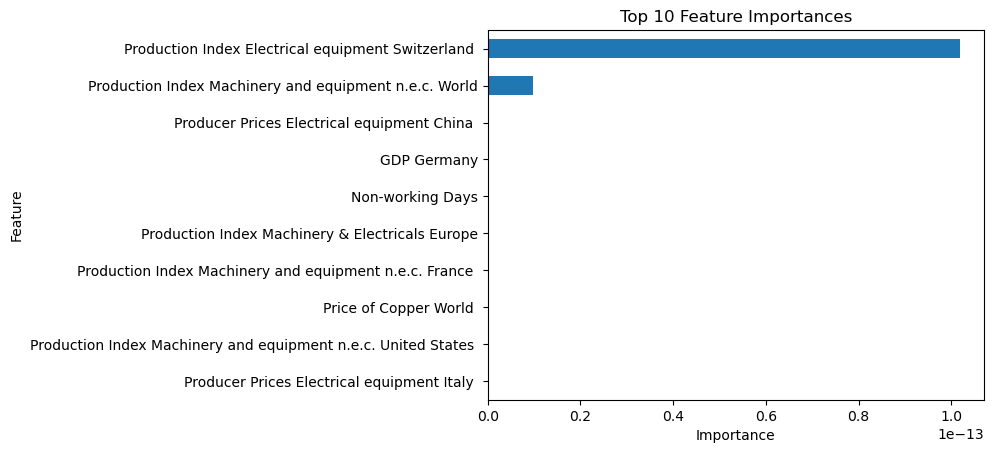

In [286]:
importance_8.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_8.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [287]:
xg_importance(8,0.05)

Index(['Adjusted Sales Lag 5', 'Shipments Index Machinery & Electricals Italy',
       'Shipments Index Machinery & Electricals China',
       'Producer Prices Electrical equipment France  ',
       'Production Index Electrical equipment Japan ',
       'Production Index Machinery and equipment n.e.c. Germany ',
       'Producer Prices Electrical equipment United States'],
      dtype='object')

In [288]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg8=data_agg8[[r for r in xg_importance(8,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg8.head()

,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals China,Producer Prices Electrical equipment France,Production Index Electrical equipment Japan,Production Index Machinery and equipment n.e.c. Germany,Producer Prices Electrical equipment United States,Adjusted Sales (€)
2018-10-01,86.417990,163.730626,102.472603,141.504470,130.800232,108.777786,580778.26534
2018-11-01,100.509533,163.730626,102.268677,108.338016,116.062180,110.005486,518398.37845
2018-12-01,120.224693,227.203511,102.574562,107.071826,115.025909,110.096680,267418.34935
2019-01-01,102.883953,210.321281,102.472603,118.770875,132.527344,110.400536,372627.94655
2019-02-01,120.609094,221.233736,102.472603,116.475579,119.746689,110.700409,361474.53417


In [289]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data8=lag_data8[xg_importance(8,0.05).to_list()+['Adjusted Sales (€)']]
lag_data8.head()

,Adjusted Sales Lag 5,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals China,Producer Prices Electrical equipment France,Production Index Electrical equipment Japan,Production Index Machinery and equipment n.e.c. Germany,Producer Prices Electrical equipment United States,Adjusted Sales (€)
2020-01-01,3.983323e+05,106.279804,219.595813,102.472603,112.251279,116.062180,111.050255,323121.66160
2020-02-01,1.086855e+06,123.261639,234.169196,102.574562,114.830812,122.279793,111.032204,327300.91394
2020-03-01,1.120149e+05,121.312004,261.126350,102.778488,91.688531,107.426605,111.035423,848395.33328
2020-04-01,5.402088e+05,123.572862,217.053447,102.676529,114.935920,123.546349,111.286629,303976.74272
2020-05-01,4.913327e+05,71.772044,207.815420,102.676529,101.347561,117.789299,111.528870,715597.36552


### Outlier Detection

In [290]:
# https://www.section.io/engineering-education/anomaly-detection-model-on-time-series-data-using-isolation-forest/
sales8_out = sales_agg8.copy()

In [291]:
model = IsolationForest(contamination=0.005)
sales_data = sales8_out['Adjusted Sales (€)'].values.reshape(-1, 1)
model.fit(sales_data)
sales8_out['Outlier'] = pd.Series(model.predict(sales_data)).apply(lambda x: 'yes' if (x == -1) else 'no' )
sales8_out['Adjusted Sales (€)'] = np.where(sales8_out['Outlier']=='yes', np.nan, sales8_out['Adjusted Sales (€)'])
sales8_out.drop('Outlier', axis=1, inplace=True)
sales8_out

,DateMY,Adjusted Sales (€)
0,2018-10-01,5.807783e+05
1,2018-11-01,5.183984e+05
2,2018-12-01,2.674183e+05
3,2019-01-01,3.726279e+05
4,2019-02-01,3.614745e+05
5,2019-03-01,5.824190e+05
6,2019-04-01,4.163865e+05
7,2019-05-01,2.976116e+05
8,2019-06-01,4.202870e+05
9,2019-07-01,3.680812e+05


In [292]:
sales8_out = sales8_out.interpolate(method='pad', limit_direction='forward')
sales8_out.iloc[38]

DateMY                2021-12-01 00:00:00
Adjusted Sales (€)           1192052.9434
Name: 38, dtype: object

In [293]:
out_data_agg8=data_agg8.copy()
out_data_agg8.iloc[38,-1]=sales8_out.iloc[38][1]

In [294]:
out_lag_data8=lag_data8.copy()
out_lag_data8.loc['2021-12-01']['Adjusted Sales (€)']=sales8_out.iloc[38][1]

In [295]:
trace1 = dict(type='scatter',
              x=sales_agg8['DateMY'],
              y=sales_agg8['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales8_out['DateMY'],
              y=sales8_out['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 8'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<a class="anchor" id="sgck9">
    
### Product Group 9
    
</a>

In [296]:
find_lag(9)

['Production Index Machinery & Electricals China LAG12',
 'Shipments Index Machinery & Electricals China LAG12',
 'Production Index Machinery & Electricals France LAG7',
 'Shipments Index Machinery & Electricals France LAG11',
 'Production Index Machinery & Electricals Germany LAG7',
 'Shipments Index Machinery & Electricals Germany LAG7',
 'Production Index Machinery & Electricals Italy LAG7',
 'Shipments Index Machinery & Electricals Italy LAG7',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG10',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG11',
 'Shipments Index Machinery & Electricals United Kingdom LAG11',
 'Production Index Machinery & Electricals United States LAG11',
 'Shipments Index Machinery & Electricals United States LAG10',
 'Production Index Machinery & Electricals Europe

### Finding the most important Lag

In [297]:
# Creating a new dataset 'data_agg9' which contains the macroeconomic indices and the sales of product group 9
data_agg9=create_ds_lag(9)

### Correlation with Sales

In [298]:
# Spearman Correlation
cor_spearman9=data_agg9.corr(method='spearman')
corr9=cor_spearman9.mask(np.triu(np.ones(cor_spearman9.shape)).astype(bool))

In [299]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr9.loc['Adjusted Sales (€)',:][abs(corr9.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [300]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr9.loc['Adjusted Sales (€)',:][abs(corr9.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [301]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr9=pd.DataFrame(corr9.drop('Adjusted Sales (€)').stack()[abs(corr9.stack()) < 0.01]).reset_index()
low_corr9.columns=['Index1', 'Index2', 'Correlation']
low_corr9.sort_values('Correlation')

,Index1,Index2,Correlation
0,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals France,-0.009665
14,Production Index Electrical equipment United K...,Production Index Machinery and equipment n.e.c...,-0.008194
18,Production Index Electrical equipment France,Shipments Index Machinery & Electricals United...,-0.007929
12,Production Index Electrical equipment United K...,Production Index Machinery & Electricals Europe,-0.005210
5,Producer Prices Electrical equipment France,Production Index Machinery & Electricals France,-0.004545
3,Production Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals Switze...,-0.004530
9,Production Index Machinery and equipment n.e.c...,Producer Prices Electrical equipment France,-0.003826
1,Production Index Machinery & Electricals Unite...,Shipments Index Machinery & Electricals Italy,-0.000604
16,Production Index Electrical equipment Italy,Production Index Machinery and equipment n.e.c...,-0.000302
7,Producer Prices Electrical equipment China,Shipments Index Machinery & Electricals United...,0.000604


In [302]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr9=pd.DataFrame(corr9.drop('Adjusted Sales (€)').stack()[abs(corr9.stack()) > 0.98]).reset_index()
high_corr9.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr9=high_corr9.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr9

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990939
3,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990033
4,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.988786
5,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.984446
6,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.982634


In [303]:
# Features to remove
high_corr(9,0.99)

['Production Index Machinery & Electricals China',
 'Production Index Machinery & Electricals Switzerland',
 'Production Index Machinery and equipment n.e.c. Japan ',
 'Shipments Index Machinery & Electricals Japan']

In [304]:
data_agg9.drop(high_corr(9,0.99),axis=1,inplace=True)

### Using XGBoost

In [305]:
# insert the "Non-working Days" column at the penultimate position
data_agg9.insert(len(data_agg9.columns) - 1, 'Non-working Days', nowork_days[:43])

In [306]:
lag = list(range(1, 7))
sales_lags_9=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_9 dataframe for each lag value
for value in lag:
    sales_agg9['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_9=pd.concat([sales_lags_9,sales_agg9['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_9.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,3190.34612,NaN,NaN,NaN,NaN,NaN
2,1847.76150,3190.34612,NaN,NaN,NaN,NaN
3,0.00000,1847.76150,3190.34612,NaN,NaN,NaN
4,1452.79900,0.00000,1847.76150,3190.34612,NaN,NaN


In [307]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data9=data_agg9.reset_index().iloc[6:,:].merge(sales_lags_9.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data9.index.name=None
adjusted_sales = lag_data9.pop('Adjusted Sales (€)')
lag_data9.insert(len(lag_data9.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data9.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,210.321281,97.630983,102.270244,118.552573,136.619316,105.463832,115.289962,126.907472,93.703398,107.185716,...,106.746880,288706.666667,10,12854.85085,3172.82868,1452.79900,0.00000,1847.76150,3190.34612,9064.93210
2019-05-01,221.233736,108.280608,127.099604,124.227879,137.741953,118.350514,122.456894,123.214607,93.772252,111.152096,...,116.751183,288706.666667,10,9064.93210,12854.85085,3172.82868,1452.79900,0.00000,1847.76150,4595.62368
2019-06-01,244.152261,99.636911,104.741535,127.404132,142.732193,107.719260,120.132032,115.194729,93.841106,106.077526,...,111.181778,283860.000000,11,4595.62368,9064.93210,12854.85085,3172.82868,1452.79900,0.00000,4483.60191
2019-07-01,207.834743,94.690312,92.801986,120.518565,141.407661,88.783181,131.936099,127.830484,96.405178,103.659614,...,111.284912,283860.000000,8,4483.60191,4595.62368,9064.93210,12854.85085,3172.82868,1452.79900,1771.69920
2019-08-01,197.528665,90.143775,110.501701,104.776326,118.703828,99.275113,92.418842,125.209957,98.969251,108.307376,...,110.872368,283860.000000,9,1771.69920,4483.60191,4595.62368,9064.93210,12854.85085,3172.82868,6384.24300


In [308]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data9.iloc[:,:51], lag_data9.iloc[:,51])
# feature importance
importance_9=pd.DataFrame(index=lag_data9.iloc[:,:51].columns, data=model.feature_importances_)
importance_9.head()

,0
Shipments Index Machinery & Electricals China,0.002697
Production Index Machinery & Electricals France,0.010495
Shipments Index Machinery & Electricals France,0.000081
Production Index Machinery & Electricals Germany,0.015778
Shipments Index Machinery & Electricals Germany,0.024253


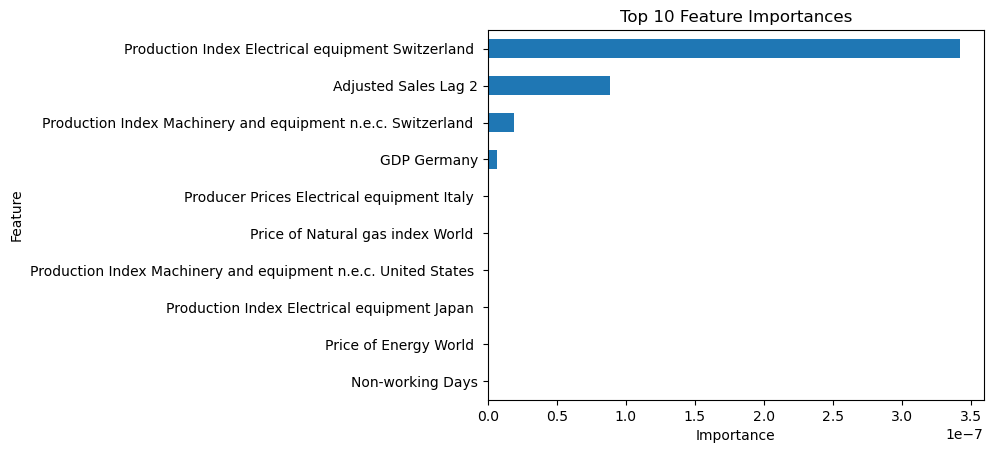

In [309]:
importance_9.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_9.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [310]:
xg_importance(9,0.05)

Index(['Shipments Index Machinery & Electricals United Kingdom', 'Price of Copper World '], dtype='object')

In [311]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg9=data_agg9[[r for r in xg_importance(9,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg9.head()

,Shipments Index Machinery & Electricals United Kingdom,Price of Copper World,Adjusted Sales (€)
2018-10-01,115.182792,90.349026,3190.34612
2018-11-01,106.495260,90.600527,1847.76150
2018-12-01,102.479231,90.697942,0.00000
2019-01-01,100.078602,93.776466,1452.79900
2019-02-01,118.619156,92.989051,3172.82868


In [312]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data9=lag_data9[xg_importance(9,0.05).to_list()+['Adjusted Sales (€)']]
lag_data9.head()

,Shipments Index Machinery & Electricals United Kingdom,Price of Copper World,Adjusted Sales (€)
2019-04-01,105.078826,90.931791,9064.93210
2019-05-01,107.574931,90.583539,4595.62368
2019-06-01,103.079336,92.449420,4483.60191
2019-07-01,99.790584,82.958631,1771.69920
2019-08-01,105.269576,80.308255,6384.24300


### Outlier Detection

In [313]:
sales9_zscore = sales_agg9.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales9_zscore['Adjusted Sales (€)']))
sales9_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales9_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,3190.34612
1,2018-11,1847.76150
2,2018-12,0.00000
3,2019-01,1452.79900
4,2019-02,3172.82868
5,2019-03,12854.85085
6,2019-04,9064.93210
7,2019-05,4595.62368
8,2019-06,4483.60191
9,2019-07,1771.69920


In [314]:
sales9_zscore = sales9_zscore.interpolate(method='linear', limit_direction='both')
sales9_zscore.iloc[24]

DateMY                   2020-10
Adjusted Sales (€)   -730.177875
Name: 24, dtype: object

In [315]:
out_data_agg9=data_agg9.copy()
out_data_agg9.iloc[24,-1]=sales9_zscore.iloc[24][1]

In [316]:
out_lag_data9=lag_data9.copy()
out_lag_data9.loc['2020-10-01']['Adjusted Sales (€)']=sales9_zscore.iloc[24][1]

In [317]:
trace1 = dict(type='scatter',
              x=sales_agg9['DateMY'],
              y=sales_agg9['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales9_zscore['DateMY'],
              y=sales9_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 9'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<a class="anchor" id="sgck11">
    
### Product Group 11
    
</a>

### Finding the most important Lag

In [318]:
find_lag(11)

['Production Index Machinery & Electricals China LAG9',
 'Shipments Index Machinery & Electricals China LAG9',
 'Production Index Machinery & Electricals France LAG7',
 'Shipments Index Machinery & Electricals France LAG9',
 'Production Index Machinery & Electricals Germany LAG7',
 'Shipments Index Machinery & Electricals Germany LAG7',
 'Production Index Machinery & Electricals Italy LAG2',
 'Shipments Index Machinery & Electricals Italy LAG9',
 'Production Index Machinery & Electricals Japan LAG7',
 'Shipments Index Machinery & Electricals Japan LAG7',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG7',
 'Shipments Index Machinery & Electricals United Kingdom LAG1',
 'Production Index Machinery & Electricals United States LAG8',
 'Shipments Index Machinery & Electricals United States LAG3',
 'Production Index Machinery & Electricals Europe LAG7',
 

In [319]:
# Creating a new dataset 'data_agg11' which contains the macroeconomic indices and the sales of product group 11
data_agg11=create_ds_lag(11)

### Correlation with Sales

In [320]:
# Spearman Correlation
cor_spearman11=data_agg11.corr(method='spearman')
corr11=cor_spearman11.mask(np.triu(np.ones(cor_spearman11.shape)).astype(bool))

In [321]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr11.loc['Adjusted Sales (€)',:][abs(corr11.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [322]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr11.loc['Adjusted Sales (€)',:][abs(corr11.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [323]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr11=pd.DataFrame(corr11.drop('Adjusted Sales (€)').stack()[abs(corr11.stack()) < 0.01]).reset_index()
low_corr11.columns=['Index1', 'Index2', 'Correlation']
low_corr11.sort_values('Correlation')

,Index1,Index2,Correlation
0,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Italy,-0.009363
16,Production Index Electrical equipment France,Production Index Electrical equipment United K...,-0.005626
12,Production Index Machinery and equipment n.e.c...,Production Index Machinery and equipment n.e.c...,-0.005135
4,Shipments Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals Switze...,-0.004832
6,Producer Prices Electrical equipment France,Production Index Machinery & Electricals France,-0.004545
3,Production Index Machinery & Electricals Europe,Shipments Index Machinery & Electricals Switze...,-0.004530
14,Production Index Electrical equipment Italy,Production Index Machinery & Electricals Japan,-0.003549
7,Producer Prices Electrical equipment France,Production Index Machinery & Electricals Unite...,-0.001060
9,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Switze...,-0.000453
13,Production Index Machinery and equipment n.e.c...,Price of Copper World,0.000227


In [324]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr11=pd.DataFrame(corr11.drop('Adjusted Sales (€)').stack()[abs(corr11.stack()) > 0.98]).reset_index()
high_corr11.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr11=high_corr11.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr11

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.989541
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.984597
4,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.984446
5,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.983993
6,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.980670


In [325]:
# Features to remove
high_corr(11,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland']

In [326]:
data_agg11.drop(high_corr(11,0.99),axis=1,inplace=True)

### Using XGBoost

In [327]:
# insert the "Non-working Days" column at the penultimate position
data_agg11.insert(len(data_agg11.columns) - 1, 'Non-working Days', nowork_days[:43])

In [328]:
lag = list(range(1, 16))
sales_lags_11=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_11 dataframe for each lag value
for value in lag:
    sales_agg11['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_11=pd.concat([sales_lags_11,sales_agg11['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_11.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.012112e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.870362e+06,1.012112e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.207730e+06,1.870362e+06,1.012112e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2.165415e+06,1.207730e+06,1.870362e+06,1.012112e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [329]:
# Create a lagged dataset with 15 lags of Adjusted Sales (€) column
lag_data11=data_agg11.reset_index().iloc[15:,:].merge(sales_lags_11.reset_index().iloc[15:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data11.index.name=None
adjusted_sales = lag_data11.pop('Adjusted Sales (€)')
lag_data11.insert(len(lag_data11.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data11.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,...,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15,Adjusted Sales (€)
2020-01-01,219.595813,98.978105,114.917432,108.917455,126.769557,102.943985,106.279804,117.747574,118.460806,109.621788,...,4.916411e+05,1.061800e+06,1.475376e+06,4.865898e+05,5.988579e+05,2.165415e+06,1.207730e+06,1.870362e+06,1.012112e+06,5.832013e+05
2020-02-01,234.169196,100.354372,110.814496,117.126331,132.660766,85.860261,123.261639,118.878856,119.178834,103.838375,...,5.874051e+05,4.916411e+05,1.061800e+06,1.475376e+06,4.865898e+05,5.988579e+05,2.165415e+06,1.207730e+06,1.870362e+06,1.234843e+06
2020-03-01,261.126350,65.470200,122.045555,104.348074,121.128352,94.663497,121.312004,100.931353,104.476342,98.054962,...,2.904577e+06,5.874051e+05,4.916411e+05,1.061800e+06,1.475376e+06,4.865898e+05,5.988579e+05,2.165415e+06,1.207730e+06,2.978858e+06
2020-04-01,217.053447,100.849908,107.250458,117.909570,138.359392,101.787534,123.572862,128.197926,132.102871,97.088932,...,3.757480e+06,2.904577e+06,5.874051e+05,4.916411e+05,1.061800e+06,1.475376e+06,4.865898e+05,5.988579e+05,2.165415e+06,8.165562e+05
2020-05-01,207.815420,101.454706,89.190446,114.729876,128.931038,71.969280,71.772044,107.692863,106.526402,96.122902,...,2.194147e+05,3.757480e+06,2.904577e+06,5.874051e+05,4.916411e+05,1.061800e+06,1.475376e+06,4.865898e+05,5.988579e+05,8.458962e+05


In [330]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data11.iloc[:,:62], lag_data11.iloc[:,62])
# feature importance
importance_11=pd.DataFrame(index=lag_data11.iloc[:,:62].columns, data=model.feature_importances_)
importance_11.head()

,0
Shipments Index Machinery & Electricals China,9.976352e-04
Production Index Machinery & Electricals France,6.417007e-03
Shipments Index Machinery & Electricals France,1.760252e-01
Production Index Machinery & Electricals Germany,7.253262e-04
Shipments Index Machinery & Electricals Germany,1.650380e-11


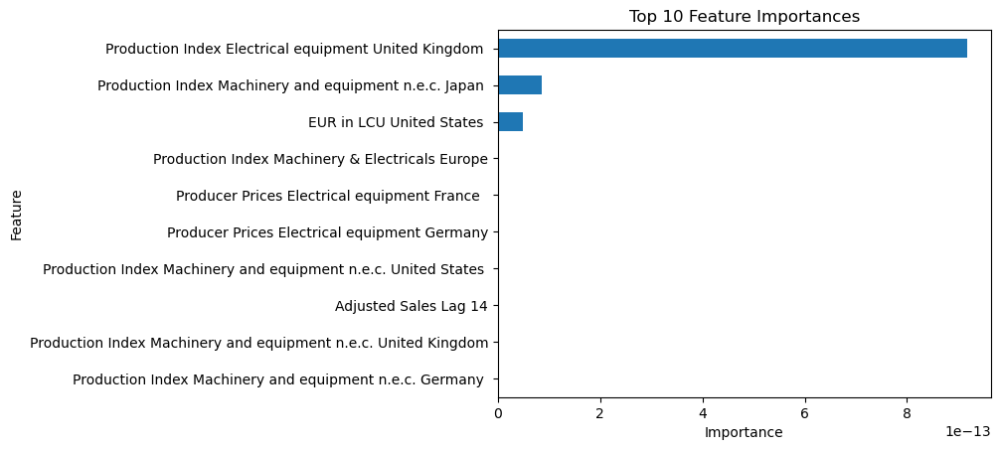

In [331]:
importance_11.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_11.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [332]:
xg_importance(11,0.05)

Index(['Production Index Machinery & Electricals United Kingdom',
       'Adjusted Sales Lag 15', 'Adjusted Sales Lag 12',
       'Production Index Machinery & Electricals Japan',
       'Adjusted Sales Lag 9', 'Price of Natural gas index World ',
       'Shipments Index Machinery & Electricals France',
       'Price of Copper World '],
      dtype='object')

In [333]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg11=data_agg11[[r for r in xg_importance(11,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg11.head()

,Production Index Machinery & Electricals United Kingdom,Production Index Machinery & Electricals Japan,Price of Natural gas index World,Shipments Index Machinery & Electricals France,Price of Copper World,Adjusted Sales (€)
2018-10-01,119.910298,153.898678,69.770865,103.810715,90.237278,1.012112e+06
2018-11-01,106.078469,115.537863,73.875687,104.590757,90.931791,1.870362e+06
2018-12-01,107.185716,115.377449,73.291727,121.718461,90.583539,1.207730e+06
2019-01-01,111.152096,126.907472,84.821629,106.608329,92.449420,2.165415e+06
2019-02-01,106.077526,123.214607,71.030120,102.270244,82.958631,5.988579e+05


In [334]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data11=lag_data11[xg_importance(11,0.05).to_list()+['Adjusted Sales (€)']]
lag_data11.head()

,Production Index Machinery & Electricals United Kingdom,Adjusted Sales Lag 15,Adjusted Sales Lag 12,Production Index Machinery & Electricals Japan,Adjusted Sales Lag 9,Price of Natural gas index World,Shipments Index Machinery & Electricals France,Price of Copper World,Adjusted Sales (€)
2020-01-01,111.546958,1.012112e+06,2.165415e+06,117.747574,1.475376e+06,80.055366,114.917432,78.067712,5.832013e+05
2020-02-01,110.593756,1.870362e+06,5.988579e+05,118.878856,1.061800e+06,69.545042,110.814496,78.850349,1.234843e+06
2020-03-01,100.108825,1.207730e+06,4.865898e+05,100.931353,4.916411e+05,67.912111,122.045555,75.774479,2.978858e+06
2020-04-01,112.212040,2.165415e+06,1.475376e+06,128.197926,5.874051e+05,62.486066,107.250458,76.435547,8.165562e+05
2020-05-01,113.312315,5.988579e+05,1.061800e+06,107.692863,2.904577e+06,59.422335,89.190446,76.409667,8.458962e+05


### Outlier Detection

In [335]:
sales11_zscore = sales_agg11.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales11_zscore['Adjusted Sales (€)']))
sales11_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales11_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,1.012112e+06
1,2018-11,1.870362e+06
2,2018-12,1.207730e+06
3,2019-01,2.165415e+06
4,2019-02,5.988579e+05
5,2019-03,4.865898e+05
6,2019-04,1.475376e+06
7,2019-05,1.061800e+06
8,2019-06,4.916411e+05
9,2019-07,5.874051e+05


There seem to be no outliers to deal with.

<a class="anchor" id="sgck12">
    
### Product Group 12
    
</a>

### Finding the most important Lag

In [336]:
find_lag(12)

['Production Index Machinery & Electricals China LAG6',
 'Shipments Index Machinery & Electricals China LAG6',
 'Production Index Machinery & Electricals France LAG10',
 'Shipments Index Machinery & Electricals France LAG10',
 'Production Index Machinery & Electricals Germany LAG10',
 'Shipments Index Machinery & Electricals Germany LAG10',
 'Production Index Machinery & Electricals Italy LAG12',
 'Shipments Index Machinery & Electricals Italy LAG2',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG10',
 'Production Index Machinery & Electricals Switzerland LAG8',
 'Shipments Index Machinery & Electricals Switzerland LAG8',
 'Production Index Machinery & Electricals United Kingdom LAG10',
 'Shipments Index Machinery & Electricals United Kingdom LAG11',
 'Production Index Machinery & Electricals United States LAG12',
 'Shipments Index Machinery & Electricals United States LAG3',
 'Production Index Machinery & Electricals Europe 

In [337]:
# Creating a new dataset 'data_agg12' which contains the macroeconomic indices and the sales of product group 12
data_agg12=create_ds_lag(12)

### Correlation with Sales

In [338]:
# Spearman Correlation
cor_spearman12=data_agg12.corr(method='spearman')
corr12=cor_spearman12.mask(np.triu(np.ones(cor_spearman12.shape)).astype(bool))

In [339]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr12.loc['Adjusted Sales (€)',:][abs(corr12.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [340]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr12.loc['Adjusted Sales (€)',:][abs(corr12.loc['Adjusted Sales (€)',:])>0.7]

Producer Prices Electrical equipment United States    0.753247
Producer Prices Electrical equipment China           -0.701148
Name: Adjusted Sales (€), dtype: float64

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [341]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr12=pd.DataFrame(corr12.drop('Adjusted Sales (€)').stack()[abs(corr12.stack()) < 0.01]).reset_index()
low_corr12.columns=['Index1', 'Index2', 'Correlation']
low_corr12.sort_values('Correlation')

,Index1,Index2,Correlation
1,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals France,-0.008457
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals France,-0.004078
5,Production Index Machinery and equipment n.e.c...,Producer Prices Electrical equipment France,-0.002462
2,Producer Prices Electrical equipment United St...,Shipments Index Machinery & Electricals Europe,0.000604
7,GDP Germany,Production Index Machinery and equipment n.e.c...,0.001059
6,Production Index Electrical equipment United S...,Production Index Machinery & Electricals Italy,0.002567
0,Production Index Machinery & Electricals Italy,Production Index Machinery & Electricals France,0.004379
4,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Italy,0.005966


In [342]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr12=pd.DataFrame(corr12.drop('Adjusted Sales (€)').stack()[abs(corr12.stack()) > 0.98]).reset_index()
high_corr12.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr12=high_corr12.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr12

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990939
2,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990033
3,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.989278
4,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.986445
5,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.982634
6,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.982483
7,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals France,0.981310


In [343]:
# Features to remove
high_corr(12,0.99)

['Production Index Machinery & Electricals China',
 'Production Index Machinery & Electricals Japan',
 'Shipments Index Machinery & Electricals Japan']

In [344]:
data_agg12.drop(high_corr(12,0.99),axis=1,inplace=True)

### Using XGBoost

In [345]:
# insert the "Non-working Days" column at the penultimate position
data_agg12.insert(len(data_agg12.columns) - 1, 'Non-working Days', nowork_days[:43])

In [346]:
lag = list(range(1, 16))
sales_lags_12=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_12 dataframe for each lag value
for value in lag:
    sales_agg12['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_12=pd.concat([sales_lags_12,sales_agg12['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_12.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,28428.15303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1053.95000,28428.15303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17612.39100,1053.95000,28428.15303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20989.86800,17612.39100,1053.95000,28428.15303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [347]:
# Create a lagged dataset with 15 lags of Adjusted Sales (€) column
lag_data12=data_agg12.reset_index().iloc[15:,:].merge(sales_lags_12.reset_index().iloc[15:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data12.index.name=None
adjusted_sales = lag_data12.pop('Adjusted Sales (€)')
lag_data12.insert(len(lag_data12.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data12.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Switzerland,Shipments Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15,Adjusted Sales (€)
2020-01-01,217.053447,107.861788,126.966216,122.534648,140.116214,99.275113,118.301128,96.122902,92.573895,120.754768,...,44211.42432,24370.12800,21682.39038,9966.23000,33564.65994,20989.86800,17612.39100,1053.95000,28428.15303,212888.68936
2020-02-01,207.815420,98.677844,114.917432,110.612414,127.512006,104.586684,135.804285,95.156872,91.831897,106.691164,...,21382.43544,44211.42432,24370.12800,21682.39038,9966.23000,33564.65994,20989.86800,17612.39100,1053.95000,324767.79335
2020-03-01,215.853833,94.779550,110.814496,115.712333,131.993634,114.299549,89.096602,97.909288,94.394925,109.719699,...,19255.43400,21382.43544,44211.42432,24370.12800,21682.39038,9966.23000,33564.65994,20989.86800,17612.39100,186391.39167
2020-04-01,226.669259,98.978105,122.045555,108.917455,126.769557,99.732969,100.426324,100.661704,96.957953,111.546958,...,293075.38080,19255.43400,21382.43544,44211.42432,24370.12800,21682.39038,9966.23000,33564.65994,20989.86800,79950.52800
2020-05-01,240.953763,100.354372,107.250458,117.126331,132.660766,118.006286,88.740135,103.414120,99.520980,110.593756,...,141101.32938,293075.38080,19255.43400,21382.43544,44211.42432,24370.12800,21682.39038,9966.23000,33564.65994,154565.03696


In [348]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data12.iloc[:,:61], lag_data12.iloc[:,61])
# feature importance
importance_12=pd.DataFrame(index=lag_data12.iloc[:,:61].columns, data=model.feature_importances_)
importance_12.head()

,0
Shipments Index Machinery & Electricals China,0.000032
Production Index Machinery & Electricals France,0.003775
Shipments Index Machinery & Electricals France,0.000141
Production Index Machinery & Electricals Germany,0.001109
Shipments Index Machinery & Electricals Germany,0.000002


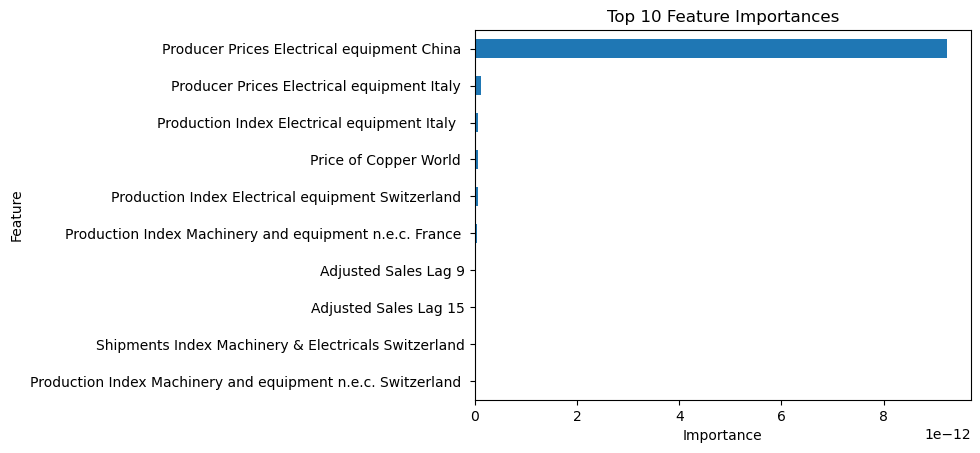

In [349]:
importance_12.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_12.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [350]:
xg_importance(12,0.05)

Index(['Producer Prices Electrical equipment United States',
       'Production Index Machinery & Electricals Switzerland',
       'Production Index Machinery and equipment n.e.c. Germany '],
      dtype='object')

In [351]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg12=data_agg12[[r for r in xg_importance(12,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg12.head()

,Producer Prices Electrical equipment United States,Production Index Machinery & Electricals Switzerland,Production Index Machinery and equipment n.e.c. Germany,Adjusted Sales (€)
2018-10-01,106.437057,103.320555,147.265411,28428.15303
2018-11-01,106.771606,98.810180,104.548080,1053.95000
2018-12-01,107.571632,98.442835,110.535408,17612.39100
2019-01-01,107.978470,98.075490,130.800232,20989.86800
2019-02-01,108.554298,97.708145,116.062180,33564.65994


In [352]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data12=lag_data12[xg_importance(12,0.05).to_list()+['Adjusted Sales (€)']]
lag_data12.head()

,Producer Prices Electrical equipment United States,Production Index Machinery & Electricals Switzerland,Production Index Machinery and equipment n.e.c. Germany,Adjusted Sales (€)
2020-01-01,111.384506,96.122902,128.612549,212888.68936
2020-02-01,111.613358,95.156872,115.025909,324767.79335
2020-03-01,110.550217,97.909288,120.207260,186391.39167
2020-04-01,110.795616,100.661704,116.062180,79950.52800
2020-05-01,110.656105,103.414120,122.279793,154565.03696


### Outlier Detection

In [353]:
sales12_zscore = sales_agg12.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales12_zscore['Adjusted Sales (€)']))
sales12_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales12_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,28428.15303
1,2018-11,1053.95000
2,2018-12,17612.39100
3,2019-01,20989.86800
4,2019-02,33564.65994
5,2019-03,9966.23000
6,2019-04,21682.39038
7,2019-05,24370.12800
8,2019-06,44211.42432
9,2019-07,21382.43544


There seem to be no outliers to deal with.

<a class="anchor" id="sgck13">
    
### Product Group 13
    
</a>

In [354]:
find_lag(13)

['Production Index Machinery & Electricals China LAG2',
 'Shipments Index Machinery & Electricals China LAG2',
 'Production Index Machinery & Electricals France LAG4',
 'Shipments Index Machinery & Electricals France LAG4',
 'Production Index Machinery & Electricals Germany LAG1',
 'Shipments Index Machinery & Electricals Germany LAG3',
 'Production Index Machinery & Electricals Italy LAG5',
 'Shipments Index Machinery & Electricals Italy LAG4',
 'Production Index Machinery & Electricals Japan LAG1',
 'Shipments Index Machinery & Electricals Japan LAG1',
 'Production Index Machinery & Electricals Switzerland LAG1',
 'Shipments Index Machinery & Electricals Switzerland LAG1',
 'Production Index Machinery & Electricals United Kingdom LAG1',
 'Shipments Index Machinery & Electricals United Kingdom LAG4',
 'Production Index Machinery & Electricals United States LAG5',
 'Shipments Index Machinery & Electricals United States LAG11',
 'Production Index Machinery & Electricals Europe LAG1',
 '

### Finding the most important Lag

In [355]:
# Creating a new dataset 'data_agg13' which contains the macroeconomic indices and the sales of product group 13
data_agg13=create_ds_lag(13)

### Correlation with Sales

In [356]:
# Spearman Correlation
cor_spearman13=data_agg13.corr(method='spearman')
corr13=cor_spearman13.mask(np.triu(np.ones(cor_spearman13.shape)).astype(bool))

In [357]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr13.loc['Adjusted Sales (€)',:][abs(corr13.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [358]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr13.loc['Adjusted Sales (€)',:][abs(corr13.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [359]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr13=pd.DataFrame(corr13.drop('Adjusted Sales (€)').stack()[abs(corr13.stack()) < 0.01]).reset_index()
low_corr13.columns=['Index1', 'Index2', 'Correlation']
low_corr13.sort_values('Correlation')

,Index1,Index2,Correlation
22,Production Index Electrical equipment France,Shipments Index Machinery & Electricals China,-0.009629
21,Production Index Electrical equipment France,Production Index Machinery & Electricals China,-0.009629
17,Production Index Electrical equipment Japan,Production Index Machinery & Electricals France,-0.009363
8,Production Index Electrical equipment United S...,Shipments Index Machinery & Electricals United...,-0.007098
4,Producer Prices Electrical equipment France,Shipments Index Machinery & Electricals Japan,-0.005758
9,Production Index Electrical equipment World,Production Index Machinery & Electricals Unite...,-0.004379
0,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Germany,-0.003775
6,Producer Prices Electrical equipment Germany,Production Index Machinery & Electricals Europe,-0.002873
2,Producer Prices Electrical equipment United St...,Price of Base Metals World,-0.002869
14,Production Index Electrical equipment United K...,Production Index Machinery and equipment n.e.c...,-0.001661


In [360]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr13=pd.DataFrame(corr13.drop('Adjusted Sales (€)').stack()[abs(corr13.stack()) > 0.98]).reset_index()
high_corr13.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr13=high_corr13.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr13

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.991090
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.990221
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.987466
4,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.985654
5,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.983238


In [361]:
# Features to remove
high_corr(13,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland',
 'Production Index Machinery & Electricals Italy']

In [362]:
data_agg13.drop(high_corr(13,0.99),axis=1,inplace=True)

### Using XGBoost

In [363]:
# insert the "Non-working Days" column at the penultimate position
data_agg13.insert(len(data_agg13.columns) - 1, 'Non-working Days', nowork_days[:43])

In [364]:
lag = list(range(1, 16))
sales_lags_13=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_13 dataframe for each lag value
for value in lag:
    sales_agg13['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_13=pd.concat([sales_lags_13,sales_agg13['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_13.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,27417.10510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,67157.30000,27417.1051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,15420.35230,67157.3000,27417.1051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,26572.72933,15420.3523,67157.3000,27417.1051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [365]:
# Create a lagged dataset with 15 lags of Adjusted Sales (€) column
lag_data13=data_agg13.reset_index().iloc[15:,:].merge(sales_lags_13.reset_index().iloc[15:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data13.index.name=None
adjusted_sales = lag_data13.pop('Adjusted Sales (€)')
lag_data13.insert(len(lag_data13.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data13.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15,Adjusted Sales (€)
2020-01-01,240.953763,100.849908,115.174401,113.794908,128.931038,115.641563,119.779464,120.926433,105.680362,101.886526,...,34814.36079,2540.10876,7443.60876,11711.65000,32018.49603,26572.72933,15420.35230,67157.30000,27417.10510,19480.55082
2020-02-01,262.913997,101.454706,120.928567,97.818789,135.209745,123.385529,103.523694,102.647362,100.227579,97.702785,...,43137.37505,34814.36079,2540.10876,7443.60876,11711.65000,32018.49603,26572.72933,15420.35230,67157.30000,13760.91717
2020-03-01,130.439177,94.551015,110.239446,102.986158,135.889887,118.301128,104.626107,107.330894,94.774795,98.210808,...,22542.59520,43137.37505,34814.36079,2540.10876,7443.60876,11711.65000,32018.49603,26572.72933,15420.35230,23584.13077
2020-04-01,130.439177,93.197445,119.047516,112.901583,110.707393,135.804285,131.109001,134.177575,89.322011,106.381843,...,19640.25210,22542.59520,43137.37505,34814.36079,2540.10876,7443.60876,11711.65000,32018.49603,26572.72933,30838.97444
2020-05-01,255.237921,86.012460,103.635875,81.061581,117.371846,89.096602,95.103868,92.979134,85.481842,61.048022,...,65886.05910,19640.25210,22542.59520,43137.37505,34814.36079,2540.10876,7443.60876,11711.65000,32018.49603,3777.87128


In [366]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data13.iloc[:,:61], lag_data13.iloc[:,61])
# feature importance
importance_13=pd.DataFrame(index=lag_data13.iloc[:,:61].columns, data=model.feature_importances_)
importance_13.head()

,0
Shipments Index Machinery & Electricals China,0.000194
Production Index Machinery & Electricals France,0.000160
Shipments Index Machinery & Electricals France,0.013109
Production Index Machinery & Electricals Germany,0.000324
Shipments Index Machinery & Electricals Germany,0.000308


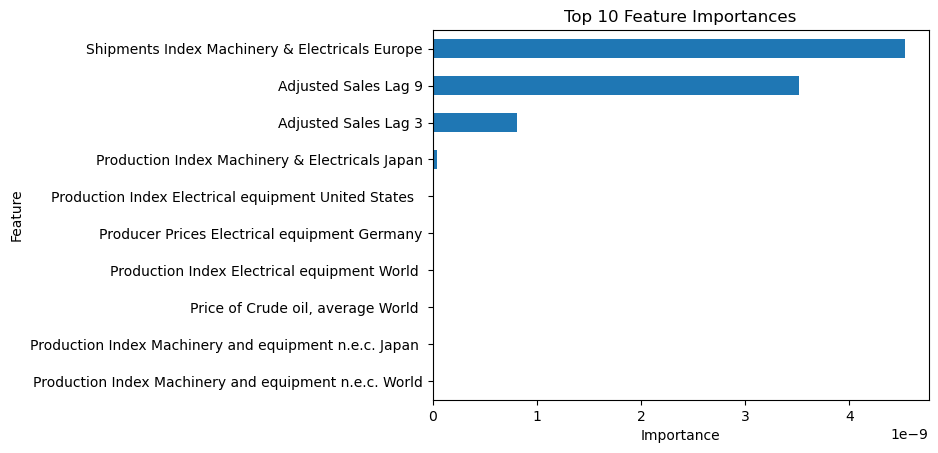

In [367]:
importance_13.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_13.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [368]:
xg_importance(13,0.05)

Index(['Producer Prices Electrical equipment Italy ', 'Adjusted Sales Lag 15',
       'Adjusted Sales Lag 2',
       'Production Index Electrical equipment Switzerland '],
      dtype='object')

In [369]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg13=data_agg13[[r for r in xg_importance(13,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg13.head()

,Producer Prices Electrical equipment Italy,Production Index Electrical equipment Switzerland,Adjusted Sales (€)
2018-10-01,105.297836,111.205674,27417.10510
2018-11-01,105.609985,112.970843,67157.30000
2018-12-01,105.714035,114.736013,15420.35230
2019-01-01,105.505936,116.501182,26572.72933
2019-02-01,105.505936,110.354610,32018.49603


In [370]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data13=lag_data13[xg_importance(13,0.05).to_list()+['Adjusted Sales (€)']]
lag_data13.head()

,Producer Prices Electrical equipment Italy,Adjusted Sales Lag 15,Adjusted Sales Lag 2,Production Index Electrical equipment Switzerland,Adjusted Sales (€)
2020-01-01,105.297836,27417.10510,42974.80620,115.744681,19480.55082
2020-02-01,105.193787,67157.30000,26729.76000,110.228526,13760.91717
2020-03-01,105.193787,15420.35230,19480.55082,104.712372,23584.13077
2020-04-01,105.089737,26572.72933,13760.91717,99.196217,30838.97444
2020-05-01,104.985687,32018.49603,23584.13077,91.977935,3777.87128


### Outlier Detection

In [371]:
sales13_zscore = sales_agg13.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales13_zscore['Adjusted Sales (€)']))
sales13_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales13_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,27417.10510
1,2018-11,67157.30000
2,2018-12,15420.35230
3,2019-01,26572.72933
4,2019-02,32018.49603
5,2019-03,11711.65000
6,2019-04,7443.60876
7,2019-05,2540.10876
8,2019-06,34814.36079
9,2019-07,43137.37505


There seem to be no outliers to deal with.

<a class="anchor" id="sgck14">
    
### Product Group 14
    
</a>

### Finding the most important Lag

In [372]:
find_lag(14)

['Production Index Machinery & Electricals China LAG3',
 'Shipments Index Machinery & Electricals China LAG3',
 'Production Index Machinery & Electricals France LAG8',
 'Shipments Index Machinery & Electricals France LAG10',
 'Production Index Machinery & Electricals Germany LAG1',
 'Shipments Index Machinery & Electricals Germany LAG8',
 'Production Index Machinery & Electricals Italy LAG8',
 'Shipments Index Machinery & Electricals Italy LAG12',
 'Production Index Machinery & Electricals Japan LAG8',
 'Shipments Index Machinery & Electricals Japan LAG8',
 'Production Index Machinery & Electricals Switzerland LAG12',
 'Shipments Index Machinery & Electricals Switzerland LAG12',
 'Production Index Machinery & Electricals United Kingdom LAG5',
 'Shipments Index Machinery & Electricals United Kingdom LAG8',
 'Production Index Machinery & Electricals United States LAG9',
 'Shipments Index Machinery & Electricals United States LAG9',
 'Production Index Machinery & Electricals Europe LAG8',

In [373]:
# Creating a new dataset 'data_agg14' which contains the macroeconomic indices and the sales of product group 14
data_agg14=create_ds_lag(14)

### Correlation with Sales

In [374]:
# Spearman Correlation
cor_spearman14=data_agg14.corr(method='spearman')
corr14=cor_spearman14.mask(np.triu(np.ones(cor_spearman14.shape)).astype(bool))

In [375]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr14.loc['Adjusted Sales (€)',:][abs(corr14.loc['Adjusted Sales (€)',:])<0.1]

Price of Copper World                           0.092983
EUR in LCU United States                        0.064884
Producer Prices Electrical equipment Germany    0.085615
Producer Prices Electrical equipment China     -0.080369
Name: Adjusted Sales (€), dtype: float64

In [376]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr14.loc['Adjusted Sales (€)',:][abs(corr14.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [377]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr14=pd.DataFrame(corr14.drop('Adjusted Sales (€)').stack()[abs(corr14.stack()) < 0.01]).reset_index()
low_corr14.columns=['Index1', 'Index2', 'Correlation']
low_corr14.sort_values('Correlation')

,Index1,Index2,Correlation
16,GDP Germany,Shipments Index Machinery & Electricals Japan,-0.009231
10,Producer Prices Electrical equipment China,Producer Prices Electrical equipment United Ki...,-0.008612
6,Producer Prices Electrical equipment Germany,Shipments Index Machinery & Electricals Europe,-0.008392
12,Production Index Electrical equipment United K...,Production Index Machinery & Electricals Switz...,-0.008232
3,Price of Copper World,Production Index Machinery & Electricals Unite...,-0.008004
15,Production Index Electrical equipment Germany,Shipments Index Machinery & Electricals Switze...,-0.005361
14,Production Index Electrical equipment United K...,Production Index Machinery and equipment n.e.c...,-0.003512
8,Producer Prices Electrical equipment China,Shipments Index Machinery & Electricals China,-0.003398
7,Producer Prices Electrical equipment China,Production Index Machinery & Electricals China,-0.003398
0,Production Index Machinery & Electricals Japan,Production Index Machinery & Electricals Germany,0.002265


In [378]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr14=pd.DataFrame(corr14.drop('Adjusted Sales (€)').stack()[abs(corr14.stack()) > 0.98]).reset_index()
high_corr14.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr14=high_corr14.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr14

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.993204
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.984446
3,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.984295
4,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.983842
5,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.981275
6,"Price of Crude oil, average World",Price of Energy World,0.981124
7,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals France,0.980328


In [379]:
# Features to remove
high_corr(14,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland']

In [380]:
data_agg14.drop(high_corr(14,0.99),axis=1,inplace=True)

### Using XGBoost

In [381]:
# insert the "Non-working Days" column at the penultimate position
data_agg14.insert(len(data_agg14.columns) - 1, 'Non-working Days', nowork_days[:43])

In [382]:
lag = list(range(1, 16))
sales_lags_14=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_14 dataframe for each lag value
for value in lag:
    sales_agg14['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_14=pd.concat([sales_lags_14,sales_agg14['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_14.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5718.0700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,16873.0500,5718.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0000,16873.05,5718.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1647.6128,0.00,16873.05,5718.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [383]:
# Create a lagged dataset with 15 lags of Adjusted Sales (€) column
lag_data14=data_agg14.reset_index().iloc[15:,:].merge(sales_lags_14.reset_index().iloc[15:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data14.index.name=None
adjusted_sales = lag_data14.pop('Adjusted Sales (€)')
lag_data14.insert(len(lag_data14.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data14.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,...,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15,Adjusted Sales (€)
2020-01-01,226.669259,94.779550,126.966216,113.794908,131.993634,118.006286,92.418842,108.940926,108.492392,109.621788,...,62954.69229,17700.31440,0.00000,7422.22125,18831.57030,1647.61280,0.00000,16873.05000,5718.0700,2949.30956
2020-02-01,240.953763,98.978105,114.917432,97.818789,126.769557,108.231888,103.214212,117.747574,118.460806,103.838375,...,20781.45790,62954.69229,17700.31440,0.00000,7422.22125,18831.57030,1647.61280,0.00000,16873.0500,10910.90000
2020-03-01,262.913997,100.354372,110.814496,102.986158,132.660766,114.705312,122.454318,118.878856,119.178834,98.054962,...,1605.20400,20781.45790,62954.69229,17700.31440,0.00000,7422.22125,18831.57030,1647.61280,0.0000,10356.12545
2020-04-01,130.439177,65.470200,122.045555,112.901583,121.128352,56.245575,106.279804,100.931353,104.476342,97.088932,...,12876.90240,1605.20400,20781.45790,62954.69229,17700.31440,0.00000,7422.22125,18831.57030,1647.6128,-2862.85580
2020-05-01,130.439177,100.849908,107.250458,81.061581,138.359392,107.755094,123.261639,128.197926,132.102871,96.122902,...,1381.30710,12876.90240,1605.20400,20781.45790,62954.69229,17700.31440,0.00000,7422.22125,18831.5703,32800.68000


In [384]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data14.iloc[:,:62], lag_data14.iloc[:,62])
# feature importance
importance_14=pd.DataFrame(index=lag_data14.iloc[:,:62].columns, data=model.feature_importances_)
importance_14.head()

,0
Shipments Index Machinery & Electricals China,0.000338
Production Index Machinery & Electricals France,0.000387
Shipments Index Machinery & Electricals France,0.000094
Production Index Machinery & Electricals Germany,0.000008
Shipments Index Machinery & Electricals Germany,0.322986


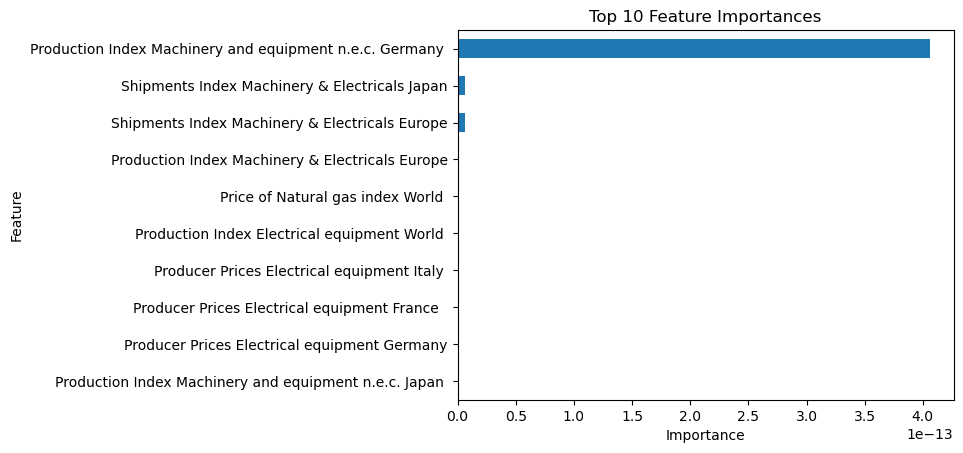

In [385]:
importance_14.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_14.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [386]:
xg_importance(14,0.05)

Index(['Production Index Electrical equipment Germany  ',
       'Production Index Electrical equipment Switzerland ',
       'Price of Copper World ',
       'Shipments Index Machinery & Electricals Germany',
       'Producer Prices Electrical equipment United Kingdom '],
      dtype='object')

In [387]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg14=data_agg14[[r for r in xg_importance(14,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg14.head()

,Production Index Electrical equipment Germany,Production Index Electrical equipment Switzerland,Price of Copper World,Shipments Index Machinery & Electricals Germany,Producer Prices Electrical equipment United Kingdom,Adjusted Sales (€)
2018-10-01,116.751183,110.732861,90.583539,119.492100,112.180145,5718.0700
2018-11-01,111.181778,114.137116,92.449420,141.751327,112.180145,16873.0500
2018-12-01,111.284912,117.541371,82.958631,126.376490,112.180145,0.0000
2019-01-01,110.872368,112.056738,80.308255,126.239172,111.770729,1647.6128
2019-02-01,118.298233,106.572104,80.304406,147.947403,112.896622,18831.5703


In [388]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data14=lag_data14[xg_importance(14,0.05).to_list()+['Adjusted Sales (€)']]
lag_data14.head()

,Production Index Electrical equipment Germany,Production Index Electrical equipment Switzerland,Price of Copper World,Shipments Index Machinery & Electricals Germany,Producer Prices Electrical equipment United Kingdom,Adjusted Sales (€)
2020-01-01,107.571976,110.354610,75.774479,131.993634,112.077789,2949.30956
2020-02-01,109.119034,104.208038,76.435547,126.769557,112.282501,10910.90000
2020-03-01,106.334335,98.061466,76.409667,132.660766,113.817818,10356.12545
2020-04-01,82.819084,95.539795,77.772016,121.128352,114.841354,-2862.85580
2020-05-01,99.836700,93.018125,80.653454,138.359392,116.171959,32800.68000


### Outlier Detection

In [389]:
sales14_zscore = sales_agg14.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales14_zscore['Adjusted Sales (€)']))
sales14_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales14_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,5718.07000
1,2018-11,16873.05000
2,2018-12,0.00000
3,2019-01,1647.61280
4,2019-02,18831.57030
5,2019-03,7422.22125
6,2019-04,0.00000
7,2019-05,17700.31440
8,2019-06,NaN
9,2019-07,20781.45790


In [390]:
sales14_zscore = sales14_zscore.interpolate(method='linear', limit_direction='both')
sales14_zscore.iloc[8]

DateMY                    2019-06
Adjusted Sales (€)    19240.88615
Name: 8, dtype: object

In [391]:
sales14_zscore.iloc[33]

DateMY                   2021-07
Adjusted Sales (€)    4253.32005
Name: 33, dtype: object

In [392]:
out_data_agg14=data_agg14.copy()
out_data_agg14.iloc[8,-1]=sales14_zscore.iloc[8][1]
out_data_agg14.iloc[33,-1]=sales14_zscore.iloc[33][1]

In [393]:
out_lag_data14=lag_data14.copy()
out_lag_data14.loc['2021-07-01']['Adjusted Sales (€)']=sales14_zscore.iloc[33][1]

In [394]:
trace1 = dict(type='scatter',
              x=sales_agg14['DateMY'],
              y=sales_agg14['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales14_zscore['DateMY'],
              y=sales14_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 14'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

For these points, it was difficult to decide if they were actually outliers or if, for instance, there could be present yearly seasonality that did not happen in 2020 because of covid. Nevertheless, they were classified as such because both datasets (with and without outliers) will be tested.

<a class="anchor" id="sgck16">
    
### Product Group 16
    
</a>

In [395]:
find_lag(16)

['Production Index Machinery & Electricals China LAG10',
 'Shipments Index Machinery & Electricals China LAG10',
 'Production Index Machinery & Electricals France LAG2',
 'Shipments Index Machinery & Electricals France LAG9',
 'Production Index Machinery & Electricals Germany LAG6',
 'Shipments Index Machinery & Electricals Germany LAG12',
 'Production Index Machinery & Electricals Italy LAG8',
 'Shipments Index Machinery & Electricals Italy LAG4',
 'Production Index Machinery & Electricals Japan LAG12',
 'Shipments Index Machinery & Electricals Japan LAG12',
 'Production Index Machinery & Electricals Switzerland LAG9',
 'Shipments Index Machinery & Electricals Switzerland LAG10',
 'Production Index Machinery & Electricals United Kingdom LAG12',
 'Shipments Index Machinery & Electricals United Kingdom LAG12',
 'Production Index Machinery & Electricals United States LAG5',
 'Shipments Index Machinery & Electricals United States LAG10',
 'Production Index Machinery & Electricals Europe L

### Finding the most important Lag

In [396]:
# Creating a new dataset 'data_agg16' which contains the macroeconomic indices and the sales of product group 16
data_agg16=create_ds_lag(16)

### Correlation with Sales

In [397]:
# Spearman Correlation
cor_spearman16=data_agg16.corr(method='spearman')
corr16=cor_spearman16.mask(np.triu(np.ones(cor_spearman16.shape)).astype(bool))

In [398]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr16.loc['Adjusted Sales (€)',:][abs(corr16.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [399]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr16.loc['Adjusted Sales (€)',:][abs(corr16.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [400]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr16=pd.DataFrame(corr16.drop('Adjusted Sales (€)').stack()[abs(corr16.stack()) < 0.01]).reset_index()
low_corr16.columns=['Index1', 'Index2', 'Correlation']
low_corr16.sort_values('Correlation')

,Index1,Index2,Correlation
4,Producer Prices Electrical equipment United St...,EUR in LCU United States,-0.009967
15,Production Index Electrical equipment Japan,Shipments Index Machinery & Electricals China,-0.009364
14,Production Index Electrical equipment Japan,Production Index Machinery & Electricals China,-0.009364
13,Production Index Electrical equipment United K...,Shipments Index Machinery & Electricals Europe,-0.005059
0,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals France,-0.004379
12,Production Index Electrical equipment United K...,Shipments Index Machinery & Electricals Switze...,-0.003927
2,Price of Copper World,"Price of Crude oil, average World",-0.000906
11,Production Index Electrical equipment United K...,Production Index Machinery & Electricals Switz...,-0.000755
3,Producer Prices Electrical equipment United St...,Production Index Machinery & Electricals Unite...,0.000453
8,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Italy,0.000453


In [401]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr16=pd.DataFrame(corr16.drop('Adjusted Sales (€)').stack()[abs(corr16.stack()) > 0.98]).reset_index()
high_corr16.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr16=high_corr16.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr16

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.990486
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.990184
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.987087
4,Production Index Machinery and equipment n.e.c...,Shipments Index Machinery & Electricals Japan,0.984597


In [402]:
# Features to remove
high_corr(16,0.99)

['Production Index Machinery & Electricals China',
 'Production Index Machinery & Electricals Japan',
 'Production Index Machinery and equipment n.e.c. Japan ']

In [403]:
data_agg16.drop(high_corr(16,0.99),axis=1,inplace=True)

### Using XGBoost

In [404]:
# insert the "Non-working Days" column at the penultimate position
data_agg16.insert(len(data_agg16.columns) - 1, 'Non-working Days', nowork_days[:43])

In [405]:
lag = list(range(1, 16))
sales_lags_16=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_16 dataframe for each lag value
for value in lag:
    sales_agg16['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_16=pd.concat([sales_lags_16,sales_agg16['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_16.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3.301981e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.357029e+06,3.301981e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4.691087e+06,1.357029e+06,3.301981e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,9.212692e+05,4.691087e+06,1.357029e+06,330198.09817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [406]:
# Create a lagged dataset with 15 lags of Adjusted Sales (€) column
lag_data16=data_agg16.reset_index().iloc[15:,:].merge(sales_lags_16.reset_index().iloc[15:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data16.index.name=None
adjusted_sales = lag_data16.pop('Adjusted Sales (€)')
lag_data16.insert(len(lag_data16.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data16.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,Shipments Index Machinery & Electricals Switzerland,...,Adjusted Sales Lag 7,Adjusted Sales Lag 8,Adjusted Sales Lag 9,Adjusted Sales Lag 10,Adjusted Sales Lag 11,Adjusted Sales Lag 12,Adjusted Sales Lag 13,Adjusted Sales Lag 14,Adjusted Sales Lag 15,Adjusted Sales (€)
2020-01-01,261.642802,94.551015,114.917432,117.126331,118.703828,118.006286,115.641563,106.303946,97.088932,94.057889,...,367057.95462,352037.73384,223154.88860,2.224477e+06,2.528675e+05,9.212692e+05,4.691087e+06,1.357029e+06,3.301981e+05,384030.85908
2020-02-01,219.595813,93.197445,110.814496,104.348074,122.686997,108.231888,123.385529,114.996302,96.122902,93.315892,...,267024.53758,367057.95462,352037.73384,2.231549e+05,2.224477e+06,2.528675e+05,9.212692e+05,4.691087e+06,1.357029e+06,82904.36154
2020-03-01,234.169196,86.012460,122.045555,117.909570,140.116214,114.705312,118.301128,146.096768,95.156872,92.573895,...,727129.68666,267024.53758,367057.95462,3.520377e+05,2.231549e+05,2.224477e+06,2.528675e+05,9.212692e+05,4.691087e+06,160878.54205
2020-04-01,261.126350,90.143951,107.250458,114.729876,127.512006,56.245575,135.804285,104.722281,97.909288,91.831897,...,754389.92832,727129.68666,267024.53758,3.670580e+05,3.520377e+05,2.231549e+05,2.224477e+06,2.528675e+05,9.212692e+05,70812.82280
2020-05-01,217.053447,77.857681,89.190446,116.876757,131.993634,107.755094,89.096602,108.492392,100.661704,94.394925,...,286215.95934,754389.92832,727129.68666,2.670245e+05,3.670580e+05,3.520377e+05,2.231549e+05,2.224477e+06,2.528675e+05,195922.26680


In [407]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data16.iloc[:,:61], lag_data16.iloc[:,61])
# feature importance
importance_16=pd.DataFrame(index=lag_data16.iloc[:,:61].columns, data=model.feature_importances_)
importance_16.head()

,0
Shipments Index Machinery & Electricals China,0.000421
Production Index Machinery & Electricals France,0.001810
Shipments Index Machinery & Electricals France,0.043850
Production Index Machinery & Electricals Germany,0.010097
Shipments Index Machinery & Electricals Germany,0.000003


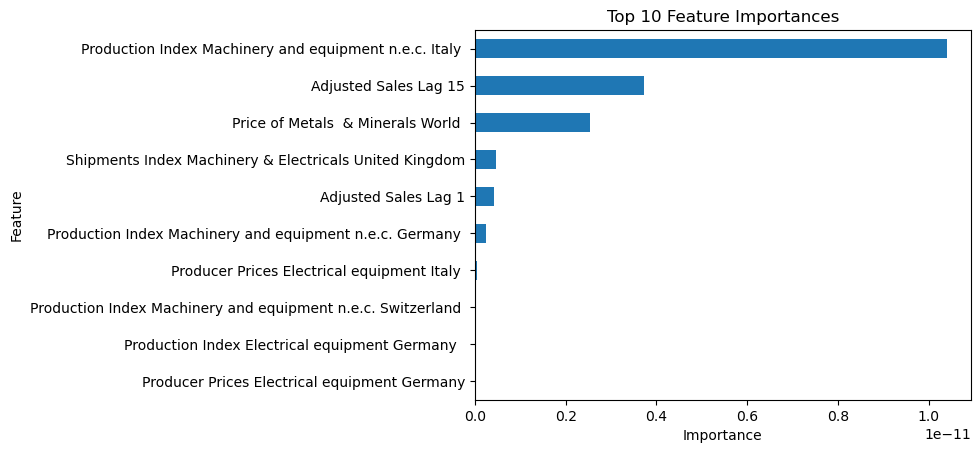

In [408]:
importance_16.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_16.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [409]:
xg_importance(16,0.05)

Index(['Adjusted Sales Lag 6', 'Shipments Index Machinery & Electricals Europe'], dtype='object')

In [410]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg16=data_agg16[[r for r in xg_importance(16,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg16.head()

,Shipments Index Machinery & Electricals Europe,Adjusted Sales (€)
2018-10-01,136.488748,3.301981e+05
2018-11-01,120.435916,1.357029e+06
2018-12-01,112.299480,4.691087e+06
2019-01-01,127.679665,9.212692e+05
2019-02-01,130.989253,2.528675e+05


In [411]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data16=lag_data16[xg_importance(16,0.05).to_list()+['Adjusted Sales (€)']]
lag_data16.head()

,Adjusted Sales Lag 6,Shipments Index Machinery & Electricals Europe,Adjusted Sales (€)
2020-01-01,267024.53758,131.462333,384030.85908
2020-02-01,727129.68666,129.677321,82904.36154
2020-03-01,754389.92832,128.563947,160878.54205
2020-04-01,286215.95934,133.330694,70812.82280
2020-05-01,290384.80985,107.914493,195922.26680


### Outlier Detection

In [412]:
sales16_zscore = sales_agg16.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales16_zscore['Adjusted Sales (€)']))
sales16_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales16_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,3.301981e+05
1,2018-11,1.357029e+06
2,2018-12,NaN
3,2019-01,9.212692e+05
4,2019-02,2.528675e+05
5,2019-03,2.224477e+06
6,2019-04,2.231549e+05
7,2019-05,3.520377e+05
8,2019-06,3.670580e+05
9,2019-07,2.670245e+05


In [413]:
sales16_zscore = sales16_zscore.interpolate(method='linear', limit_direction='both')
sales16_zscore.iloc[2]

DateMY                       2018-12
Adjusted Sales (€)    1139149.039915
Name: 2, dtype: object

In [414]:
out_data_agg16=data_agg16.copy()
out_data_agg16.iloc[2,-1]=sales16_zscore.iloc[2][1]

In [415]:
trace1 = dict(type='scatter',
              x=sales_agg16['DateMY'],
              y=sales_agg16['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales16_zscore['DateMY'],
              y=sales16_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 16'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<a class="anchor" id="sgck20">
    
### Product Group 20
    
</a>

### Finding the most important Lag

In [416]:
find_lag(20)

['Production Index Machinery & Electricals China LAG2',
 'Shipments Index Machinery & Electricals China LAG2',
 'Production Index Machinery & Electricals France LAG2',
 'Shipments Index Machinery & Electricals France LAG8',
 'Production Index Machinery & Electricals Germany LAG2',
 'Shipments Index Machinery & Electricals Germany LAG2',
 'Production Index Machinery & Electricals Italy LAG3',
 'Shipments Index Machinery & Electricals Italy LAG2',
 'Production Index Machinery & Electricals Japan LAG2',
 'Shipments Index Machinery & Electricals Japan LAG2',
 'Production Index Machinery & Electricals Switzerland LAG1',
 'Shipments Index Machinery & Electricals Switzerland LAG1',
 'Production Index Machinery & Electricals United Kingdom LAG2',
 'Shipments Index Machinery & Electricals United Kingdom LAG4',
 'Production Index Machinery & Electricals United States LAG1',
 'Shipments Index Machinery & Electricals United States LAG3',
 'Production Index Machinery & Electricals Europe LAG2',
 'S

In [417]:
# Creating a new dataset 'data_agg20' which contains the macroeconomic indices and the sales of product group 20
data_agg20=create_ds_lag(20)

### Correlation with Sales

In [418]:
# Spearman Correlation
cor_spearman20=data_agg20.corr(method='spearman')
corr20=cor_spearman20.mask(np.triu(np.ones(cor_spearman20.shape)).astype(bool))

In [419]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr20.loc['Adjusted Sales (€)',:][abs(corr20.loc['Adjusted Sales (€)',:])<0.1]

Series([], Name: Adjusted Sales (€), dtype: float64)

In [420]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr20.loc['Adjusted Sales (€)',:][abs(corr20.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [421]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr20=pd.DataFrame(corr20.drop('Adjusted Sales (€)').stack()[abs(corr20.stack()) < 0.01]).reset_index()
low_corr20.columns=['Index1', 'Index2', 'Correlation']
low_corr20.sort_values('Correlation')

,Index1,Index2,Correlation
22,GDP Germany,Production Index Machinery and equipment n.e.c...,-0.007037
15,Production Index Electrical equipment United K...,Production Index Machinery and equipment n.e.c...,-0.006872
18,Production Index Electrical equipment Japan,Shipments Index Machinery & Electricals Europe,-0.006191
9,Production Index Machinery and equipment n.e.c...,Production Index Machinery and equipment n.e.c...,-0.005059
4,Producer Prices Electrical equipment Italy,Production Index Machinery & Electricals Unite...,-0.002890
12,Production Index Electrical equipment United S...,Shipments Index Machinery & Electricals United...,-0.002869
11,Production Index Electrical equipment United S...,Production Index Machinery & Electricals Japan,-0.000906
2,Producer Prices Electrical equipment United Ki...,Shipments Index Machinery & Electricals Europe,0.000151
19,Production Index Electrical equipment France,Production Index Electrical equipment Italy,0.001510
1,Price of Copper World,Production Index Machinery & Electricals Switz...,0.003171


In [422]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr20=pd.DataFrame(corr20.drop('Adjusted Sales (€)').stack()[abs(corr20.stack()) > 0.98]).reset_index()
high_corr20.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr20=high_corr20.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr20

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.991090
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.990523
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.989580
4,"Price of Crude oil, average World",Price of Energy World,0.985654
5,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Japan,0.985503
6,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Japan,0.980670


In [423]:
# Features to remove
high_corr(20,0.99)

['Production Index Machinery & Electricals China',
 'Production Index Machinery & Electricals Switzerland',
 'Production Index Machinery & Electricals Italy']

In [424]:
data_agg20.drop(high_corr(20,0.99),axis=1,inplace=True)

### Using XGBoost

In [425]:
# insert the "Non-working Days" column at the penultimate position
data_agg20.insert(len(data_agg20.columns) - 1, 'Non-working Days', nowork_days[:43])

In [426]:
lag = list(range(1, 7))
sales_lags_20=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_20 dataframe for each lag value
for value in lag:
    sales_agg20['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_20=pd.concat([sales_lags_20,sales_agg20['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_20.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,4522.07174,NaN,NaN,NaN,NaN,NaN
2,5711.16790,4522.07174,NaN,NaN,NaN,NaN
3,904.87025,5711.16790,4522.07174,NaN,NaN,NaN
4,2342.88508,904.87025,5711.16790,4522.07174,NaN,NaN


In [427]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data20=data_agg20.reset_index().iloc[6:,:].merge(sales_lags_20.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data20.index.name=None
adjusted_sales = lag_data20.pop('Adjusted Sales (€)')
lag_data20.insert(len(lag_data20.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data20.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Switzerland,Production Index Machinery & Electricals United Kingdom,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,175.668147,92.551521,92.801986,109.597012,122.686997,103.214212,114.466647,114.996302,94.057889,103.495768,...,111.388054,283860.0,10,3319.00675,608.86746,2342.88508,904.87025,5711.16790,4522.07174,3597.91222
2019-05-01,261.642802,107.861788,110.501701,122.534648,140.116214,122.454318,141.637717,146.096768,93.315892,120.754768,...,102.518265,283860.0,10,3597.91222,3319.00675,608.86746,2342.88508,904.87025,5711.16790,935.14440
2019-06-01,219.595813,98.677844,122.451734,110.612414,127.512006,106.279804,107.150653,104.722281,92.573895,106.691164,...,107.468842,284280.0,11,935.14440,3597.91222,3319.00675,608.86746,2342.88508,904.87025,772.16706
2019-07-01,234.169196,94.779550,115.958210,115.712333,131.993634,123.261639,108.940926,108.492392,91.831897,109.719699,...,95.814354,284280.0,8,772.16706,935.14440,3597.91222,3319.00675,608.86746,2342.88508,579.33280
2019-08-01,261.126350,98.978105,115.128469,108.917455,126.769557,121.312004,117.747574,118.460806,94.394925,111.546958,...,107.675117,284280.0,9,579.33280,772.16706,935.14440,3597.91222,3319.00675,608.86746,284.96880


In [428]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data20.iloc[:,:52], lag_data20.iloc[:,52])
# feature importance
importance_20=pd.DataFrame(index=lag_data20.iloc[:,:52].columns, data=model.feature_importances_)
importance_20.head()

,0
Shipments Index Machinery & Electricals China,0.000750
Production Index Machinery & Electricals France,0.002386
Shipments Index Machinery & Electricals France,0.026618
Production Index Machinery & Electricals Germany,0.014172
Shipments Index Machinery & Electricals Germany,0.000008


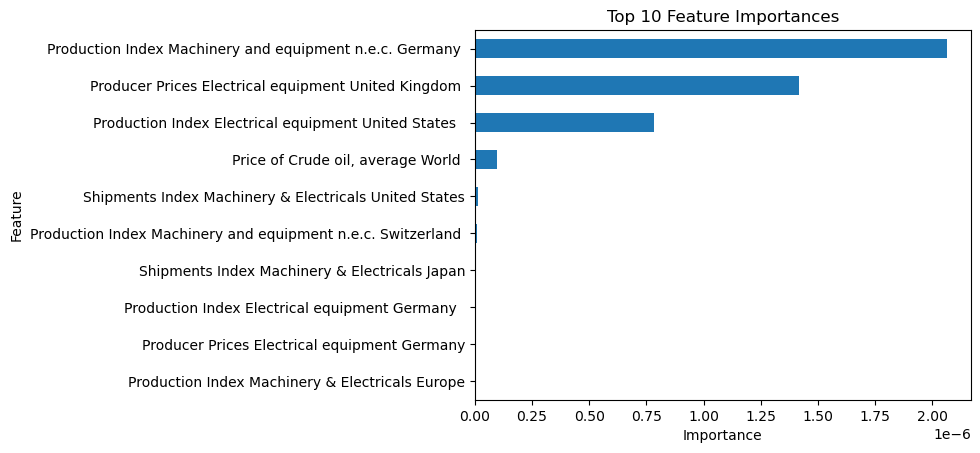

In [429]:
importance_20.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_20.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [430]:
xg_importance(20,0.05)

Index(['Producer Prices Electrical equipment China ',
       'Shipments Index Machinery & Electricals United Kingdom',
       'Adjusted Sales Lag 4'],
      dtype='object')

In [431]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg20=data_agg20[[r for r in xg_importance(20,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg20.head()

,Producer Prices Electrical equipment China,Shipments Index Machinery & Electricals United Kingdom,Adjusted Sales (€)
2018-10-01,96.690564,107.574931,4522.07174
2018-11-01,96.645106,103.079336,5711.16790
2018-12-01,96.165571,99.790584,904.87025
2019-01-01,95.579388,105.269576,2342.88508
2019-02-01,96.616188,112.318030,608.86746


In [432]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data20=lag_data20[xg_importance(20,0.05).to_list()+['Adjusted Sales (€)']]
lag_data20.head()

,Producer Prices Electrical equipment China,Shipments Index Machinery & Electricals United Kingdom,Adjusted Sales Lag 4,Adjusted Sales (€)
2019-04-01,97.068489,94.503733,904.87025,3597.91222
2019-05-01,96.773172,99.659210,2342.88508,935.14440
2019-06-01,96.577716,100.589459,608.86746,772.16706
2019-07-01,96.318329,118.184131,3319.00675,579.33280
2019-08-01,95.370118,103.934375,3597.91222,284.96880


### Outlier Detection

In [433]:
sales20_zscore = sales_agg20.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales20_zscore['Adjusted Sales (€)']))
sales20_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales20_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,4522.07174
1,2018-11,5711.16790
2,2018-12,904.87025
3,2019-01,2342.88508
4,2019-02,608.86746
5,2019-03,3319.00675
6,2019-04,3597.91222
7,2019-05,935.14440
8,2019-06,772.16706
9,2019-07,579.33280


There seem to be no outlier to deal with.

<a class="anchor" id="sgck36">
    
### Product Group 36
    
</a>

### Finding the most important Lag

In [434]:
find_lag(36)

['Production Index Machinery & Electricals China LAG6',
 'Shipments Index Machinery & Electricals China LAG6',
 'Production Index Machinery & Electricals France LAG1',
 'Shipments Index Machinery & Electricals France LAG3',
 'Production Index Machinery & Electricals Germany LAG6',
 'Shipments Index Machinery & Electricals Germany LAG9',
 'Production Index Machinery & Electricals Italy LAG2',
 'Shipments Index Machinery & Electricals Italy LAG9',
 'Production Index Machinery & Electricals Japan LAG10',
 'Shipments Index Machinery & Electricals Japan LAG6',
 'Production Index Machinery & Electricals Switzerland LAG1',
 'Shipments Index Machinery & Electricals Switzerland LAG1',
 'Production Index Machinery & Electricals United Kingdom LAG4',
 'Shipments Index Machinery & Electricals United Kingdom LAG5',
 'Production Index Machinery & Electricals United States LAG5',
 'Shipments Index Machinery & Electricals United States LAG5',
 'Production Index Machinery & Electricals Europe LAG4',
 '

In [435]:
# Creating a new dataset 'data_agg36' which contains the macroeconomic indices and the sales of product group 36
data_agg36=create_ds_lag(36)

### Correlation with Sales

In [436]:
# Spearman Correlation
cor_spearman36=data_agg36.corr(method='spearman')
corr36=cor_spearman36.mask(np.triu(np.ones(cor_spearman36.shape)).astype(bool))

In [437]:
# Checking the macroeconomic indices that have a low Spearman correlation with Sales
corr36.loc['Adjusted Sales (€)',:][abs(corr36.loc['Adjusted Sales (€)',:])<0.1]

Price of Metals  & Minerals World                0.098007
Price of Copper World                           -0.099064
Producer Prices Electrical equipment France      0.099379
Name: Adjusted Sales (€), dtype: float64

In [438]:
# Checking the macroeconomic indices that have a high Spearman correlation with Sales
corr36.loc['Adjusted Sales (€)',:][abs(corr36.loc['Adjusted Sales (€)',:])>0.7]

Series([], Name: Adjusted Sales (€), dtype: float64)

Considering the macroeconomic indices that have a low correlation with the Sales, we will not remove any features.

### Correlation between Macroeconomic Indices

In [439]:
# Checking the macroeconomic indices that have a low Spearman correlation between them
# Create a dataframe of pairs of variables with correlation coefficients below 0.01
low_corr36=pd.DataFrame(corr36.drop('Adjusted Sales (€)').stack()[abs(corr36.stack()) < 0.01]).reset_index()
low_corr36.columns=['Index1', 'Index2', 'Correlation']
low_corr36.sort_values('Correlation')

,Index1,Index2,Correlation
10,Producer Prices Electrical equipment France,Shipments Index Machinery & Electricals United...,-0.007878
11,Producer Prices Electrical equipment Germany,Production Index Machinery & Electricals Italy,-0.004234
19,Production Index Electrical equipment United K...,Production Index Electrical equipment United S...,-0.003700
22,GDP Germany,Producer Prices Electrical equipment China,-0.003632
23,GDP Germany,Production Index Electrical equipment United S...,-0.003329
16,Production Index Electrical equipment United S...,Shipments Index Machinery & Electricals United...,-0.002114
18,Production Index Electrical equipment Switzerl...,Production Index Machinery & Electricals Unite...,-0.002114
7,Producer Prices Electrical equipment United Ki...,"Price of Crude oil, average World",-0.001511
21,Production Index Electrical equipment Germany,Shipments Index Machinery & Electricals Europe,-0.001359
12,Producer Prices Electrical equipment China,Production Index Machinery & Electricals China,-0.000906


In [440]:
# Checking the macroeconomic indices that have a high Spearman correlation between them
# Find pairs of variables that have a correlation greater than 0.98
high_corr36=pd.DataFrame(corr36.drop('Adjusted Sales (€)').stack()[abs(corr36.stack()) > 0.98]).reset_index()
high_corr36.columns=['Index1', 'Index2', 'Correlation']
# Sort the pairs of variables by correlation coefficient in descending order
high_corr36=high_corr36.sort_values('Correlation', ascending=False).reset_index(drop=True)
high_corr36

,Index1,Index2,Correlation
0,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals China,1.000000
1,Shipments Index Machinery & Electricals Switze...,Production Index Machinery & Electricals Switz...,0.991090
2,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Italy,0.989541
3,Production Index Machinery and equipment n.e.c...,Production Index Machinery & Electricals Unite...,0.987466


In [441]:
# Features to remove
high_corr(36,0.99)

['Production Index Machinery & Electricals China',
 'Shipments Index Machinery & Electricals Switzerland']

In [442]:
data_agg36.drop(high_corr(36,0.99),axis=1,inplace=True)

### Using XGBoost

In [443]:
# insert the "Non-working Days" column at the penultimate position
data_agg36.insert(len(data_agg36.columns) - 1, 'Non-working Days', nowork_days[:43])

In [444]:
lag = list(range(1, 7))
sales_lags_36=pd.DataFrame()
# Iterate over the lag values and create a new column in the sales_lags_36 dataframe for each lag value
for value in lag:
    sales_agg36['Adjusted Sales (€)'].name='Adjusted Sales Lag '+str(value)
    sales_lags_36=pd.concat([sales_lags_36,sales_agg36['Adjusted Sales (€)'].shift(value)],axis=1)

sales_lags_36.head()

,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6
0,NaN,NaN,NaN,NaN,NaN,NaN
1,6416.32860,NaN,NaN,NaN,NaN,NaN
2,21293.34585,6416.32860,NaN,NaN,NaN,NaN
3,13715.65220,21293.34585,6416.32860,NaN,NaN,NaN
4,15089.16903,13715.65220,21293.34585,6416.3286,NaN,NaN


In [445]:
# Create a lagged dataset with 6 lags of Adjusted Sales (€) column
lag_data36=data_agg36.reset_index().iloc[6:,:].merge(sales_lags_36.reset_index().iloc[6:,:],left_index=True,
                                                 right_index=True).set_index('index_x').drop(columns='index_y')
lag_data36.index.name=None
adjusted_sales = lag_data36.pop('Adjusted Sales (€)')
lag_data36.insert(len(lag_data36.columns), 'Adjusted Sales (€)', adjusted_sales)
lag_data36.head()

,Shipments Index Machinery & Electricals China,Production Index Machinery & Electricals France,Shipments Index Machinery & Electricals France,Production Index Machinery & Electricals Germany,Shipments Index Machinery & Electricals Germany,Production Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals Italy,Production Index Machinery & Electricals Japan,Shipments Index Machinery & Electricals Japan,Production Index Machinery & Electricals Switzerland,...,Production Index Electrical equipment Germany,GDP Germany,Non-working Days,Adjusted Sales Lag 1,Adjusted Sales Lag 2,Adjusted Sales Lag 3,Adjusted Sales Lag 4,Adjusted Sales Lag 5,Adjusted Sales Lag 6,Adjusted Sales (€)
2019-04-01,211.955755,107.861788,108.325154,124.227879,129.834876,104.586684,121.357126,126.907472,124.793250,98.054962,...,108.706490,280753.333333,10,7262.81870,7898.17815,15089.16903,13715.65220,21293.34585,6416.32860,4254.56850
2019-05-01,220.519655,98.677844,108.944656,127.404132,130.043079,114.299549,74.464983,123.214607,123.289888,97.088932,...,106.746880,288706.666667,10,4254.56850,7262.81870,7898.17815,15089.16903,13715.65220,21293.34585,16837.69872
2019-06-01,241.846854,94.779550,126.966216,120.518565,136.619316,99.732969,115.289962,115.194729,124.508413,96.122902,...,116.751183,288706.666667,11,16837.69872,4254.56850,7262.81870,7898.17815,15089.16903,13715.65220,15500.70378
2019-07-01,175.668147,98.978105,114.917432,104.776326,137.741953,118.006286,122.456894,127.830484,106.303946,95.156872,...,111.181778,288706.666667,8,15500.70378,16837.69872,4254.56850,7262.81870,7898.17815,15089.16903,33434.41323
2019-08-01,175.668147,100.354372,110.814496,109.597012,142.732193,108.231888,120.132032,125.209957,114.996302,97.909288,...,111.284912,283860.000000,9,33434.41323,15500.70378,16837.69872,4254.56850,7262.81870,7898.17815,1308.61200


In [446]:
# fit model on training data
model = XGBRegressor(random_state=1)
model.fit(lag_data36.iloc[:,:53], lag_data36.iloc[:,53])
# feature importance
importance_36=pd.DataFrame(index=lag_data36.iloc[:,:53].columns, data=model.feature_importances_)
importance_36.head()

,0
Shipments Index Machinery & Electricals China,2.329361e-03
Production Index Machinery & Electricals France,3.054846e-01
Shipments Index Machinery & Electricals France,1.075033e-04
Production Index Machinery & Electricals Germany,2.979698e-08
Shipments Index Machinery & Electricals Germany,1.211574e-03


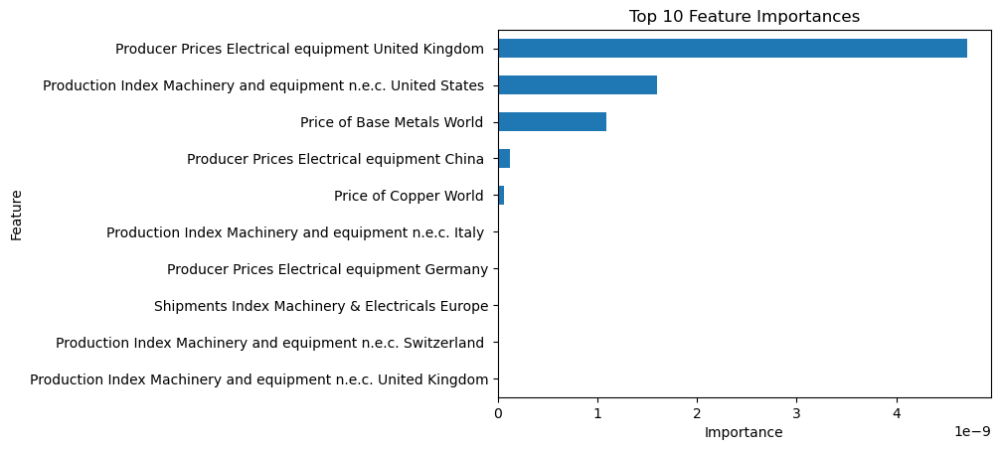

In [447]:
importance_36.sort_values(by=0,inplace=True)

# Select the top 10 rows
top_10 = importance_36.iloc[:10]

# Plot a horizontal bar chart of the top 10 feature importances
top_10.plot(kind='barh', legend=None)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Top 10 Feature Importances')
plt.show()

In [448]:
xg_importance(36,0.05)

Index(['Production Index Machinery & Electricals Italy',
       'Producer Prices Electrical equipment United States',
       'Shipments Index Machinery & Electricals United States',
       'Production Index Machinery & Electricals France'],
      dtype='object')

In [449]:
# Select only the columns with importance greater than 0.05, exclude the lagged sales variables and include the adjusted sales
#(with no lag)
data_agg36=data_agg36[[r for r in xg_importance(36,0.05) if 'Sales' not in r]+['Adjusted Sales (€)']]
data_agg36.head()

,Production Index Machinery & Electricals Italy,Producer Prices Electrical equipment United States,Shipments Index Machinery & Electricals United States,Production Index Machinery & Electricals France,Adjusted Sales (€)
2018-10-01,60.764542,110.096680,126.236188,97.630983,6416.32860
2018-11-01,105.463832,110.400536,133.797520,108.280608,21293.34585
2018-12-01,118.350514,110.700409,117.733911,99.636911,13715.65220
2019-01-01,107.719260,110.994026,128.232758,94.690312,15089.16903
2019-02-01,88.783181,111.162231,126.013347,90.143775,7898.17815


In [450]:
# Select only columns from lag_data1 that are included in the XGBoost feature importance with a threshold of 0.05, 
# and include the adjusted sales (with no lag)
lag_data36=lag_data36[xg_importance(36,0.05).to_list()+['Adjusted Sales (€)']]
lag_data36.head()

,Production Index Machinery & Electricals Italy,Producer Prices Electrical equipment United States,Shipments Index Machinery & Electricals United States,Production Index Machinery & Electricals France,Adjusted Sales (€)
2019-04-01,104.586684,111.561142,117.675874,107.861788,4254.56850
2019-05-01,114.299549,111.924240,123.280134,98.677844,16837.69872
2019-06-01,99.732969,111.384506,111.043755,94.779550,15500.70378
2019-07-01,118.006286,111.613358,116.736921,98.978105,33434.41323
2019-08-01,108.231888,110.550217,133.231664,100.354372,1308.61200


### Outlier Detection

In [451]:
sales36_zscore = sales_agg36.copy()

# Applying z-score method and replace the outliers with Nan
z_score = np.abs(stats.zscore(sales36_zscore['Adjusted Sales (€)']))
sales36_zscore.loc[z_score > 3, 'Adjusted Sales (€)'] = np.nan

sales36_zscore

,DateMY,Adjusted Sales (€)
0,2018-10,6416.32860
1,2018-11,21293.34585
2,2018-12,13715.65220
3,2019-01,15089.16903
4,2019-02,7898.17815
5,2019-03,7262.81870
6,2019-04,4254.56850
7,2019-05,16837.69872
8,2019-06,15500.70378
9,2019-07,33434.41323


In [452]:
sales36_zscore = sales36_zscore.interpolate(method='linear', limit_direction='both')
sales36_zscore.iloc[30]

DateMY                    2021-04
Adjusted Sales (€)    12391.90437
Name: 30, dtype: object

In [453]:
out_data_agg36=data_agg36.copy()
out_data_agg36.iloc[30,-1]=sales36_zscore.iloc[30][1]

In [454]:
out_lag_data36=lag_data36.copy()
out_lag_data36.loc['2021-04-01']['Adjusted Sales (€)']=sales36_zscore.iloc[30][1]

In [455]:
trace1 = dict(type='scatter',
              x=sales_agg36['DateMY'],
              y=sales_agg36['Adjusted Sales (€)'],
              name='Sales with anomalies',
              line_color='blue'         
                  )

trace2 = dict(type='scatter',
              x=sales36_zscore['DateMY'],
              y=sales36_zscore['Adjusted Sales (€)'],
              name='Sales without anomalies',
              line_color='red'         
                  )

data = [trace1, trace2]


layout = dict(title=dict(text='Sales Product 36'),
              xaxis=dict(title='Months', showgrid=False),
              yaxis=dict(title='Sales (€)', showgrid=False)
                  )

fig = go.Figure(data=data, layout=layout)

fig.show(renderer='iframe')

<hr>
<a class="anchor" id="export">
    
# 4. Export
    
    
</a>

In [456]:
data_agg1.to_csv('data_agg1.csv')
lag_data1.to_csv('lag_data1.csv')
out_data_agg1.to_csv('out_data_agg1.csv')

In [457]:
data_agg3.to_csv('data_agg3.csv')
lag_data3.to_csv('lag_data3.csv')
out_data_agg3.to_csv('out_data_agg3.csv')
out_lag_data3.to_csv('out_lag_data3.csv')

In [458]:
data_agg4.to_csv('data_agg4.csv')
lag_data4.to_csv('lag_data4.csv')
out_data_agg4.to_csv('out_data_agg4.csv')
out_lag_data4.to_csv('out_lag_data4.csv')

In [459]:
data_agg5.to_csv('data_agg5.csv')
lag_data5.to_csv('lag_data5.csv')

In [460]:
data_agg6.to_csv('data_agg6.csv')
lag_data6.to_csv('lag_data6.csv')

In [461]:
data_agg8.to_csv('data_agg8.csv')
lag_data8.to_csv('lag_data8.csv')
out_data_agg8.to_csv('out_data_agg8.csv')
out_lag_data8.to_csv('out_lag_data8.csv')

In [462]:
data_agg9.to_csv('data_agg9.csv')
lag_data9.to_csv('lag_data9.csv')
out_data_agg9.to_csv('out_data_agg9.csv')
out_lag_data9.to_csv('out_lag_data9.csv')

In [463]:
data_agg11.to_csv('data_agg11.csv')
lag_data11.to_csv('lag_data11.csv')

In [464]:
data_agg12.to_csv('data_agg12.csv')
lag_data12.to_csv('lag_data12.csv')

In [465]:
data_agg13.to_csv('data_agg13.csv')
lag_data13.to_csv('lag_data13.csv')

In [466]:
data_agg14.to_csv('data_agg14.csv')
lag_data14.to_csv('lag_data14.csv')
out_data_agg14.to_csv('out_data_agg14.csv')
out_lag_data14.to_csv('out_lag_data14.csv')

In [467]:
data_agg16.to_csv('data_agg16.csv')
lag_data16.to_csv('lag_data16.csv')
out_data_agg16.to_csv('out_data_agg16.csv')

In [468]:
data_agg20.to_csv('data_agg20.csv')
lag_data20.to_csv('lag_data20.csv')

In [469]:
data_agg36.to_csv('data_agg36.csv')
lag_data36.to_csv('lag_data36.csv')
out_data_agg36.to_csv('out_data_agg36.csv')
out_lag_data36.to_csv('out_lag_data36.csv')

In [498]:
market_data_pred.to_csv('market_data_pred.csv')